In [1]:
#importing useful libraries
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',200)
pd.set_option('display.max_rows',500)

In [2]:
#Reading the given datasets
app0 = pd.read_csv('application_data.csv')
prev0 = pd.read_csv('previous_application.csv')

In [3]:
#checking the number of nulls in different columns for Application data
app0.isnull().sum()

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

In [4]:
#Adding values of all Document columns to another column
app0['Total_documents'] = app0[['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21']].sum(axis=1)

In [5]:
app0['Total_documents'].value_counts()

1    270056
0     29549
2      7742
3       163
4         1
Name: Total_documents, dtype: int64

In [6]:
#Adding values of all Enquiries columns to another separate column
app0['Total_enquiries'] = app0[['AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR']].sum(axis=1)

In [7]:
#Dropping the unwanted columns after using them to find the total sum
app0.drop(['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21','AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR'],axis=1,inplace=True)

In [8]:
#Checking percentage of null values in the columns
app0.isnull().sum()*100/app0.shape[0]

SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE               0.000000
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
NAME_TYPE_SUITE                  0.420148
NAME_INCOME_TYPE                 0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_FAMILY_STATUS               0.000000
NAME_HOUSING_TYPE                0.000000
REGION_POPULATION_RELATIVE       0.000000
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                    0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
OWN_CAR_AGE                     65.990810
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0

In [9]:
#Dropping few unwanted columns and columns having very high amount of null values
app0.drop(['APARTMENTS_AVG','BASEMENTAREA_AVG','YEARS_BEGINEXPLUATATION_AVG','YEARS_BUILD_AVG','COMMONAREA_AVG','ELEVATORS_AVG','ENTRANCES_AVG','FLOORSMAX_AVG','FLOORSMIN_AVG','LANDAREA_AVG','LIVINGAPARTMENTS_AVG','LIVINGAREA_AVG','NONLIVINGAPARTMENTS_AVG','NONLIVINGAREA_AVG','APARTMENTS_MODE','BASEMENTAREA_MODE','YEARS_BEGINEXPLUATATION_MODE','YEARS_BUILD_MODE','COMMONAREA_MODE','ELEVATORS_MODE','ENTRANCES_MODE','FLOORSMAX_MODE','FLOORSMIN_MODE','LANDAREA_MODE','LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE','NONLIVINGAPARTMENTS_MODE','NONLIVINGAREA_MODE','APARTMENTS_MEDI','BASEMENTAREA_MEDI','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BUILD_MEDI','COMMONAREA_MEDI','ELEVATORS_MEDI','ENTRANCES_MEDI','FLOORSMAX_MEDI','FLOORSMIN_MEDI','LANDAREA_MEDI','LIVINGAPARTMENTS_MEDI','LIVINGAREA_MEDI','NONLIVINGAPARTMENTS_MEDI','NONLIVINGAREA_MEDI','FONDKAPREMONT_MODE','HOUSETYPE_MODE','TOTALAREA_MODE','WALLSMATERIAL_MODE','EMERGENCYSTATE_MODE','FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
       'FLAG_PHONE', 'FLAG_EMAIL','REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY','EXT_SOURCE_1'],axis=1,inplace=True)

In [10]:
#Removing few rows which had inconsistent data
app0 = app0[~((app0.FLAG_OWN_CAR=='Y') & (app0.OWN_CAR_AGE.isnull())) | (app0.FLAG_OWN_CAR=='N')]

In [11]:
#Filling up the null values of 'OCCUPATION_TYPE' column with 'Missing' as the number is huge and we don't want to loose this data by dropping it
app0.OCCUPATION_TYPE = app0.OCCUPATION_TYPE.fillna('Missing')

In [12]:
app0.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'ORGANIZATION_TYPE',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'Total_documents',
       'Total_enquiries'],
      dtype='object')

In [13]:
#Filling the null values with the mode for categorical variables and using median for numerical variables
app0.NAME_TYPE_SUITE = app0.NAME_TYPE_SUITE.fillna(app0.NAME_TYPE_SUITE.mode()[0])
app0.AMT_ANNUITY = app0.AMT_ANNUITY.fillna(app0.AMT_ANNUITY.median())
app0.AMT_GOODS_PRICE = app0.AMT_GOODS_PRICE.fillna(app0.AMT_GOODS_PRICE.median())
app0.CNT_FAM_MEMBERS = app0.CNT_FAM_MEMBERS.fillna(app0.CNT_FAM_MEMBERS.median())
app0.DAYS_LAST_PHONE_CHANGE = app0.DAYS_LAST_PHONE_CHANGE.fillna(app0.DAYS_LAST_PHONE_CHANGE.median())
app0.OBS_30_CNT_SOCIAL_CIRCLE = app0.OBS_30_CNT_SOCIAL_CIRCLE.fillna(app0.OBS_30_CNT_SOCIAL_CIRCLE.median())
app0.DEF_30_CNT_SOCIAL_CIRCLE = app0.DEF_30_CNT_SOCIAL_CIRCLE.fillna(app0.DEF_30_CNT_SOCIAL_CIRCLE.median())
app0.OBS_60_CNT_SOCIAL_CIRCLE = app0.OBS_60_CNT_SOCIAL_CIRCLE.fillna(app0.OBS_60_CNT_SOCIAL_CIRCLE.median())
app0.DEF_60_CNT_SOCIAL_CIRCLE = app0.DEF_60_CNT_SOCIAL_CIRCLE.fillna(app0.DEF_60_CNT_SOCIAL_CIRCLE.median())
app0.EXT_SOURCE_2 = app0.EXT_SOURCE_2.fillna(app0.EXT_SOURCE_2.median())
app0.EXT_SOURCE_3 = app0.EXT_SOURCE_3.fillna(app0.EXT_SOURCE_3.median())

In [14]:
app0.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,Total_documents,Total_enquiries
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,Laborers,1.0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,1,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,Core staff,2.0,School,0.622246,0.535276,1.0,0.0,1.0,0.0,-828.0,1,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,Laborers,1.0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,Laborers,2.0,Business Entity Type 3,0.650442,0.535276,2.0,0.0,2.0,0.0,-617.0,1,0.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,NaN,Core staff,1.0,Religion,0.322738,0.535276,0.0,0.0,0.0,0.0,-1106.0,1,0.0


###### Using the 'FLAG_OWN_CAR' and 'FLAG_OWN_REALTY' columns to combine and form another column which has complete information if a person owns realty and car 

In [15]:
app0['Own_Car'] = app0.FLAG_OWN_CAR.apply(lambda x: 1 if x=='Y' else 0)
app0['Own_Realty'] = app0.FLAG_OWN_REALTY.apply(lambda x: 2 if x=='Y' else 0)

In [16]:
app0['Own_car_or_realty'] = app0[['Own_Car','Own_Realty']].sum(axis=1)

In [17]:
def Car_and_Realty(x):
    if x == 0:
        return 'None'
    elif x == 1:
        return 'Only Car'
    elif x == 2:
        return 'Only Realty'
    elif x == 3:
        return 'Both car & realty'

In [18]:
app0['Own_car_or_realty'] = app0['Own_car_or_realty'].apply(Car_and_Realty)

In [19]:
app0.drop(['Own_Car','Own_Realty'],axis=1,inplace=True)

##### Checking if the new column is showing the desired result

In [20]:
app0['Own_car_or_realty'].value_counts()

Only Realty          140952
Both car & realty     72358
None                  61972
Only Car              32224
Name: Own_car_or_realty, dtype: int64

##### Coverting the days columns to years to simplify the analysis

In [21]:
app0[['DAYS_BIRTH','DAYS_EMPLOYED','DAYS_REGISTRATION','DAYS_ID_PUBLISH','DAYS_LAST_PHONE_CHANGE']] = app0[['DAYS_BIRTH','DAYS_EMPLOYED','DAYS_REGISTRATION','DAYS_ID_PUBLISH','DAYS_LAST_PHONE_CHANGE']].abs()//365


In [22]:
#Renaming the converted columns
app0.rename(columns = {'DAYS_BIRTH':'AGE','DAYS_EMPLOYED':'YEARS_EMPLOYED', 'DAYS_REGISTRATION':'YEARS_REGISTRATION', 'DAYS_ID_PUBLISH':'YEARS_ID_PUBLISH','DAYS_LAST_PHONE_CHANGE':'YEARS_LAST_PHONE_CHANGE'},inplace=True)

## Outlier Removal from Numering Columns/Variables

#### Creating a function to ease the outlier removal process

In [23]:
def outlier_analysis(x):
    print(x.describe())
    print(x.quantile([0.95,0.96,0.97,0.98,0.99]))
    iqr = x.quantile(0.75)-x.quantile(0.25)
    a = x.quantile(0.25)-1.5*iqr
    b = x.quantile(0.75)+1.5*iqr
    print('Values beyond the range of ({},{}) can be considered as outlier'.format(a,b))
    sns.boxplot(x)
    plt.show()

#### Outlier Analysis of AMT_INCOME_TOTAL column

count    3.075060e+05
mean     1.687965e+05
std      2.371243e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64
0.95    337500.0
0.96    360000.0
0.97    382500.0
0.98    427500.0
0.99    472500.0
Name: AMT_INCOME_TOTAL, dtype: float64
Values beyond the range of (-22500.0,337500.0) can be considered as outlier


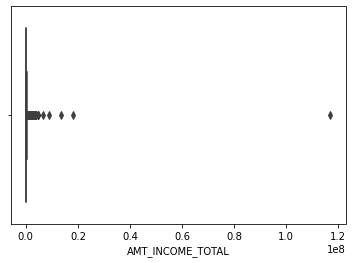

In [24]:
outlier_analysis(app0.AMT_INCOME_TOTAL)

In [25]:
#Only selecting rows whose values are less than or equal to 360000 or the 96th Percentile value
app0 = app0[app0.AMT_INCOME_TOTAL<=360000]

<AxesSubplot:>

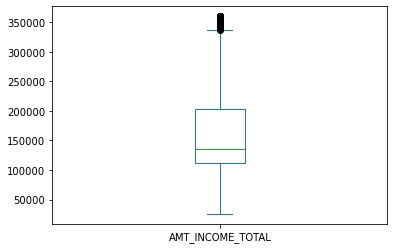

In [26]:
#Checking its boxplot
app0.AMT_INCOME_TOTAL.plot.box()

#### Outlier Analysis of AMT_CREDIT column

count    2.980050e+05
mean     5.850228e+05
std      3.887423e+05
min      4.500000e+04
25%      2.700000e+05
50%      5.084955e+05
75%      8.055360e+05
max      3.860019e+06
Name: AMT_CREDIT, dtype: float64
0.95    1324440.0
0.96    1354500.0
0.97    1506816.0
0.98    1575000.0
0.99    1800000.0
Name: AMT_CREDIT, dtype: float64
Values beyond the range of (-533304.0,1608840.0) can be considered as outlier


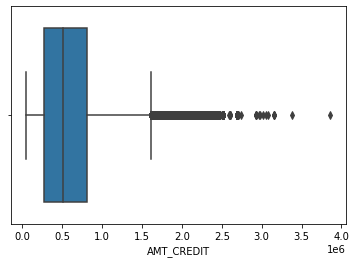

In [27]:
outlier_analysis(app0.AMT_CREDIT)

In [28]:
#Only selecting rows whose values are less than or equal to 1800000 or the 99th Percentile value
app0 = app0[app0.AMT_CREDIT<=1800000]

#### Outlier Analysis of AMT_ANNUITY column

count    295620.000000
mean      26183.584600
std       13215.764634
min        1615.500000
25%       16276.500000
50%       24412.500000
75%       33354.000000
max      173704.500000
Name: AMT_ANNUITY, dtype: float64
0.95    50503.50
0.96    52420.50
0.97    54436.50
0.98    58093.29
0.99    65065.50
Name: AMT_ANNUITY, dtype: float64
Values beyond the range of (-9339.75,58970.25) can be considered as outlier


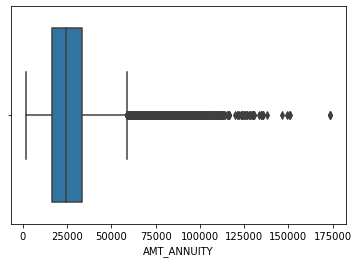

In [29]:
outlier_analysis(app0.AMT_ANNUITY)

In [30]:
#Only selecting rows whose values are less than or equal to 58970.25
app0 = app0[app0.AMT_ANNUITY<=58970.25]

#### Outlier Analysis of AMT_GOODS_PRICE column

count    2.901430e+05
mean     5.031799e+05
std      3.237491e+05
min      4.050000e+04
25%      2.295000e+05
50%      4.500000e+05
75%      6.750000e+05
max      1.800000e+06
Name: AMT_GOODS_PRICE, dtype: float64
0.95    1125000.0
0.96    1152000.0
0.97    1305000.0
0.98    1350000.0
0.99    1395000.0
Name: AMT_GOODS_PRICE, dtype: float64
Values beyond the range of (-438750.0,1343250.0) can be considered as outlier


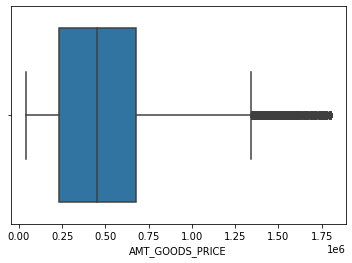

In [31]:
outlier_analysis(app0.AMT_GOODS_PRICE)

In [32]:
#Only selecting rows whose values are less than or equal to 1395000
app0 = app0[app0.AMT_GOODS_PRICE<=1395000.0]

#### Outlier Analysis of REGION_POPULATION_RELATIVE column

count    287419.000000
mean          0.020395
std           0.013139
min           0.000290
25%           0.010006
50%           0.018850
75%           0.026392
max           0.072508
Name: REGION_POPULATION_RELATIVE, dtype: float64
0.95    0.046220
0.96    0.046220
0.97    0.046220
0.98    0.072508
0.99    0.072508
Name: REGION_POPULATION_RELATIVE, dtype: float64
Values beyond the range of (-0.014572999999999997,0.050970999999999995) can be considered as outlier


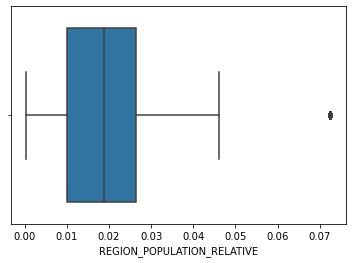

In [33]:
outlier_analysis(app0.REGION_POPULATION_RELATIVE)

Made no changes

#### Outlier Analysis of AGE column

count    287419.000000
mean         43.438082
std          12.062744
min          20.000000
25%          33.000000
50%          43.000000
75%          54.000000
max          69.000000
Name: AGE, dtype: float64
0.95    63.0
0.96    64.0
0.97    64.0
0.98    65.0
0.99    67.0
Name: AGE, dtype: float64
Values beyond the range of (1.5,85.5) can be considered as outlier


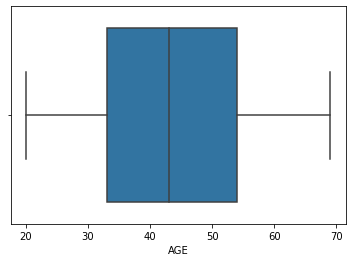

In [34]:
outlier_analysis(app0.AGE)

##### Made no changes

#### Outlier Analysis of YEARS_EMPLOYED column

count    287419.000000
mean        190.282807
std         386.356179
min           0.000000
25%           2.000000
50%           6.000000
75%          16.000000
max        1000.000000
Name: YEARS_EMPLOYED, dtype: float64
0.95    1000.0
0.96    1000.0
0.97    1000.0
0.98    1000.0
0.99    1000.0
Name: YEARS_EMPLOYED, dtype: float64
Values beyond the range of (-19.0,37.0) can be considered as outlier


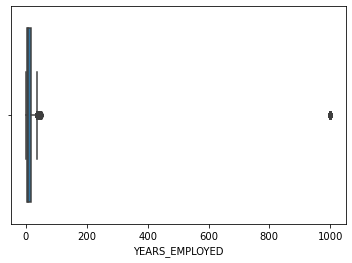

In [35]:
outlier_analysis(app0.YEARS_EMPLOYED)

In [36]:
#Replacing 1000 with np.nan as it is impossible for someone to be employed for 1000 years and also 1000 could be entered to show as the data is not present.
app0.YEARS_EMPLOYED = app0.YEARS_EMPLOYED.apply(lambda x: np.nan if x==1000 else x)

In [37]:
app0.YEARS_EMPLOYED.describe()

count    234127.000000
mean          5.974937
std           6.396283
min           0.000000
25%           2.000000
50%           4.000000
75%           8.000000
max          49.000000
Name: YEARS_EMPLOYED, dtype: float64

#### Outlier Analysis of YEARS_REGISTRATION column

count    287419.000000
mean         13.245005
std           9.663929
min           0.000000
25%           5.000000
50%          12.000000
75%          20.000000
max          67.000000
Name: YEARS_REGISTRATION, dtype: float64
0.95    31.0
0.96    32.0
0.97    34.0
0.98    35.0
0.99    38.0
Name: YEARS_REGISTRATION, dtype: float64
Values beyond the range of (-17.5,42.5) can be considered as outlier


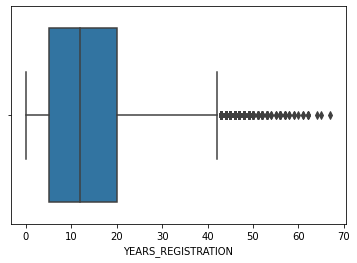

In [38]:
outlier_analysis(app0.YEARS_REGISTRATION)

##### No changes done as the data is very much valid, therefore no removal of rows are required

#### Outlier Analysis of YEARS_ID_PUBLISH column

count    287419.000000
mean          7.714299
std           4.129456
min           0.000000
25%           4.000000
50%           8.000000
75%          11.000000
max          19.000000
Name: YEARS_ID_PUBLISH, dtype: float64
0.95    13.0
0.96    13.0
0.97    13.0
0.98    14.0
0.99    14.0
Name: YEARS_ID_PUBLISH, dtype: float64
Values beyond the range of (-6.5,21.5) can be considered as outlier


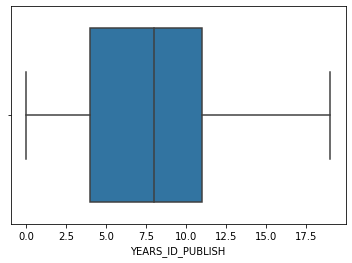

In [39]:
outlier_analysis(app0.YEARS_ID_PUBLISH)

##### No changes done as there are no outliers

#### Outlier Analysis of CNT_FAM_MEMBERS column

count    287419.000000
mean          2.145505
std           0.911995
min           1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max          20.000000
Name: CNT_FAM_MEMBERS, dtype: float64
0.95    4.0
0.96    4.0
0.97    4.0
0.98    4.0
0.99    5.0
Name: CNT_FAM_MEMBERS, dtype: float64
Values beyond the range of (0.5,4.5) can be considered as outlier


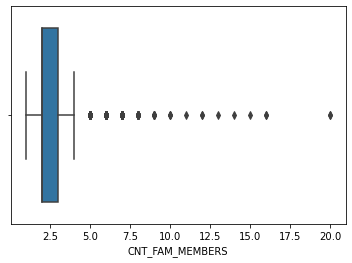

In [40]:
outlier_analysis(app0.CNT_FAM_MEMBERS)

##### No changes done right now. Will be binning it later.

#### Outlier Analysis of EXT_SOURCE_2 column

count    2.874190e+05
mean     5.093811e-01
std      1.914888e-01
min      8.173617e-08
25%      3.846284e-01
50%      5.608945e-01
75%      6.593816e-01
max      8.549997e-01
Name: EXT_SOURCE_2, dtype: float64
0.95    0.745343
0.96    0.752065
0.97    0.759753
0.98    0.768817
0.99    0.781260
Name: EXT_SOURCE_2, dtype: float64
Values beyond the range of (-0.027501453585619007,1.0715114646265413) can be considered as outlier


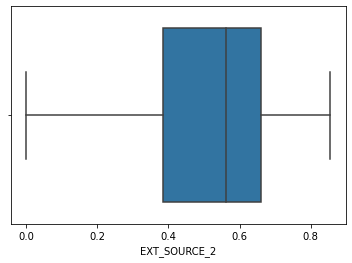

In [41]:
outlier_analysis(app0.EXT_SOURCE_2)

###### No changes is required

#### Outlier Analysis of EXT_SOURCE_3 column

count    287419.000000
mean          0.515283
std           0.174835
min           0.000527
25%           0.417100
50%           0.535276
75%           0.634706
max           0.896010
Name: EXT_SOURCE_3, dtype: float64
0.95    0.776410
0.96    0.786267
0.97    0.800451
0.98    0.812823
0.99    0.832785
Name: EXT_SOURCE_3, dtype: float64
Values beyond the range of (0.09069087416604454,0.961114325062485) can be considered as outlier


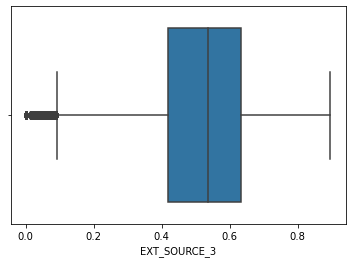

In [42]:
outlier_analysis(app0.EXT_SOURCE_3)

##### No changes required

### Checking the columns unique values and their count to see if there is any mistakes or outliers in the data

In [43]:
app0.NAME_CONTRACT_TYPE.value_counts()

Cash loans         259652
Revolving loans     27767
Name: NAME_CONTRACT_TYPE, dtype: int64

In [44]:
app0.CODE_GENDER.value_counts()

F      191489
M       95926
XNA         4
Name: CODE_GENDER, dtype: int64

In [45]:
#Removing the rows with Gender as XNA as the count is too small.
app0 = app0[app0.CODE_GENDER != 'XNA']

In [46]:
#Checking if the code worked
app0.CODE_GENDER.value_counts()

F    191489
M     95926
Name: CODE_GENDER, dtype: int64

In [47]:
app0.CNT_CHILDREN.value_counts()

0     201610
1      56946
2      24901
3       3452
4        386
5         79
6         21
7          7
14         3
8          2
9          2
10         2
19         2
11         1
12         1
Name: CNT_CHILDREN, dtype: int64

In [48]:
#Repalcing all the rows with 4 or above in 'CNT_CHILDREN' column to '4+' as the count is very low for the mentioned numbers.
app0.CNT_CHILDREN = app0.CNT_CHILDREN.apply(lambda x: '4+' if x >= 4 else x)

In [49]:
#Checking if the code worked
app0.CNT_CHILDREN.value_counts()

0     201610
1      56946
2      24901
3       3452
4+       506
Name: CNT_CHILDREN, dtype: int64

In [50]:
app0.NAME_TYPE_SUITE.value_counts()

Unaccompanied      233282
Family              37615
Spouse, partner     10652
Children             3125
Other_B              1677
Other_A               815
Group of people       249
Name: NAME_TYPE_SUITE, dtype: int64

In [51]:
#Repacing 'Other_A','Other_B','Group of people' with 'Other' as the count is small and names are ambiguous
app0.NAME_TYPE_SUITE = app0.NAME_TYPE_SUITE.apply(lambda x: 'Other' if x=='Other_B' else x)
app0.NAME_TYPE_SUITE = app0.NAME_TYPE_SUITE.apply(lambda x: 'Other' if x=='Other_A' else x)
app0.NAME_TYPE_SUITE = app0.NAME_TYPE_SUITE.apply(lambda x: 'Other' if x=='Group of people' else x)

In [52]:
#Checking if the code worked
app0.NAME_TYPE_SUITE.value_counts()

Unaccompanied      233282
Family              37615
Spouse, partner     10652
Children             3125
Other                2741
Name: NAME_TYPE_SUITE, dtype: int64

In [53]:
app0.NAME_INCOME_TYPE.value_counts()

Working                 150876
Commercial associate     63410
Pensioner                53282
State servant            19805
Unemployed                  20
Student                     16
Businessman                  3
Maternity leave              3
Name: NAME_INCOME_TYPE, dtype: int64

In [54]:
app0.NAME_INCOME_TYPE.unique()

array(['Working', 'State servant', 'Commercial associate', 'Pensioner',
       'Unemployed', 'Student', 'Businessman', 'Maternity leave'],
      dtype=object)

In [55]:
#Replacing 'Unemployed', 'Student', 'Businessman', 'Maternity leave' to 'Others' as the count is too low.
app0.NAME_INCOME_TYPE = app0.NAME_INCOME_TYPE.apply(lambda x: 'Others' if x in ['Unemployed', 'Student', 'Businessman', 'Maternity leave'] else x)

In [56]:
app0.NAME_INCOME_TYPE.value_counts()

Working                 150876
Commercial associate     63410
Pensioner                53282
State servant            19805
Others                      42
Name: NAME_INCOME_TYPE, dtype: int64

In [57]:
app0.NAME_EDUCATION_TYPE.value_counts()

Secondary / secondary special    209190
Higher education                  64820
Incomplete higher                  9524
Lower secondary                    3747
Academic degree                     134
Name: NAME_EDUCATION_TYPE, dtype: int64

In [58]:
app0.NAME_FAMILY_STATUS.value_counts()

Married                 181528
Single / not married     43207
Civil marriage           28329
Separated                18688
Widow                    15662
Unknown                      1
Name: NAME_FAMILY_STATUS, dtype: int64

In [59]:
#Replacing 'Unknown' with mode() of the column.
app0.NAME_FAMILY_STATUS = app0.NAME_FAMILY_STATUS.apply(lambda x: app0.NAME_FAMILY_STATUS.mode()[0] if x == 'Unknown' else x)

In [60]:
app0.NAME_FAMILY_STATUS.value_counts()

Married                 181529
Single / not married     43207
Civil marriage           28329
Separated                18688
Widow                    15662
Name: NAME_FAMILY_STATUS, dtype: int64

In [61]:
app0.NAME_HOUSING_TYPE.value_counts()

House / apartment      254568
With parents            14232
Municipal apartment     10533
Rented apartment         4643
Office apartment         2381
Co-op apartment          1058
Name: NAME_HOUSING_TYPE, dtype: int64

### Binning the numeric columns to make it easy for analysis and to improve readability 

<AxesSubplot:xlabel='AGE', ylabel='Count'>

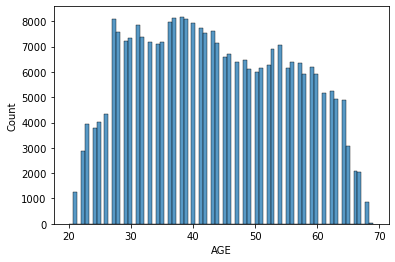

In [62]:
#Plotting histogram of 'AGE' column to get an idea on how to bin the values.
sns.histplot(app0.AGE)

In [63]:
#Binning the AGE column
app0['AGE']=pd.cut(app0['AGE'],[20,30,40,50,60,90],labels=['20-30','30-40','40-50','50-60','60+'])

In [64]:
app0['AGE'].value_counts()

30-40    77002
40-50    68319
50-60    63328
20-30    50466
60+      28299
Name: AGE, dtype: int64

In [65]:
#Binning the values and storing this in a different column to utilise it later for analysis
bins= ['Low3','Low2', 'Low1',"Low0","High0" ,"High1","High2", "High3"]
app0['Income Group'] = pd.qcut(app0['AMT_INCOME_TOTAL'],q=[0, .125, .25, .375 ,.5 , .625, .75, .875, 1],
                                  labels=bins)

In [66]:
#Checking if the code worked
app0['Income Group'].value_counts()

Low3     57807
Low2     42428
High2    38659
Low0     36840
High1    34634
High0    32846
High3    32773
Low1     11428
Name: Income Group, dtype: int64

1.0     30031
2.0     27873
0.0     26327
3.0     23452
4.0     20203
5.0     15013
6.0     13899
7.0     12086
8.0     10486
9.0      8193
10.0     6749
11.0     5391
12.0     4849
14.0     4232
13.0     3955
15.0     2447
16.0     2131
17.0     1808
18.0     1713
19.0     1708
20.0     1487
21.0     1316
22.0     1153
23.0      932
24.0      850
25.0      773
27.0      617
26.0      603
28.0      567
29.0      533
30.0      427
31.0      402
34.0      332
32.0      310
33.0      306
35.0      234
36.0      175
37.0      126
39.0      118
38.0      106
41.0       55
40.0       51
42.0       36
44.0       28
43.0       19
45.0       12
48.0        4
46.0        3
47.0        1
49.0        1
Name: YEARS_EMPLOYED, dtype: int64


<AxesSubplot:xlabel='YEARS_EMPLOYED', ylabel='Count'>

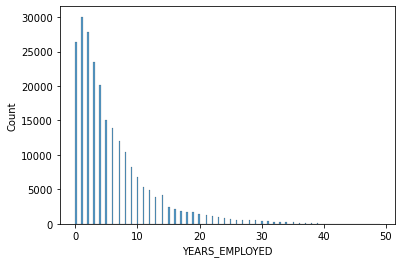

In [67]:
#Plotting histogram of 'YEARS_EMPLOYED' column to get an idea on how to bin the values.
print(app0.YEARS_EMPLOYED.value_counts())
sns.histplot(app0.YEARS_EMPLOYED)

In [68]:
#Binning the YEARS_EMPLOYED column
app0['YEARS_EMPLOYED']=pd.cut(app0['YEARS_EMPLOYED'],[0,10,20,30,50],labels=['0-10','10-20','20-30','30-50'])

In [69]:
#Checking if the code worked
app0.YEARS_EMPLOYED.value_counts()

0-10     167985
10-20     29721
20-30      7771
30-50      2319
Name: YEARS_EMPLOYED, dtype: int64

<AxesSubplot:xlabel='YEARS_REGISTRATION', ylabel='Count'>

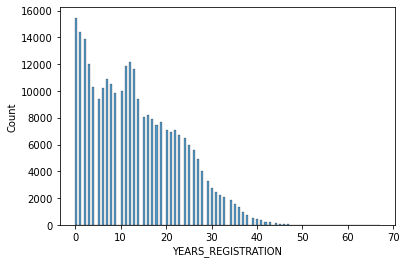

In [70]:
#Plotting histogram of 'YEARS_REGISTRATION' column to get an idea on how to bin the values.
sns.histplot(app0.YEARS_REGISTRATION)

In [71]:
#Binning the YEARS_REGISTRATION column
app0['YEARS_REGISTRATION']=pd.cut(app0['YEARS_REGISTRATION'],[0,10,20,30,50,500],labels=['0-10','10-20','20-30','30-50','50+'])

In [72]:
#Checking if the code worked
app0['YEARS_REGISTRATION'].value_counts()

0-10     111534
10-20     91393
20-30     53642
30-50     15327
50+          62
Name: YEARS_REGISTRATION, dtype: int64

<AxesSubplot:xlabel='YEARS_ID_PUBLISH', ylabel='Count'>

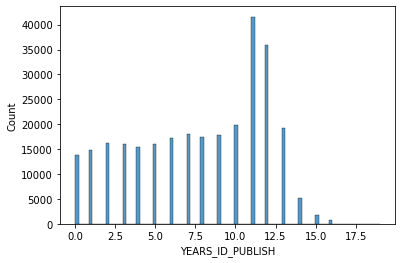

In [73]:
#Plotting histogram of 'YEARS_ID_PUBLISH' column to get an idea on how to bin the values.
sns.histplot(app0.YEARS_ID_PUBLISH)

In [74]:
#Binning the YEARS_ID_PUBLISH column
app0['YEARS_ID_PUBLISH']=pd.cut(app0['YEARS_ID_PUBLISH'],[0,5,10,15,20],labels=['0-5','5-10','10-15','15-20'])

In [75]:
app0['YEARS_ID_PUBLISH'].value_counts()

10-15    103633
5-10      90533
0-5       78625
15-20       819
Name: YEARS_ID_PUBLISH, dtype: int64

<AxesSubplot:xlabel='REGION_POPULATION_RELATIVE', ylabel='Count'>

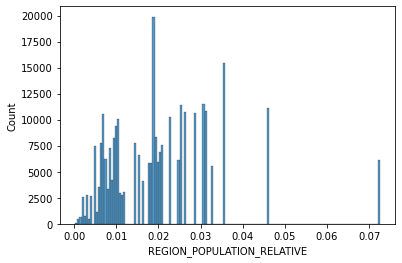

In [76]:
#Plotting histogram of 'REGION_POPULATION_RELATIVE' column to get an idea on how to bin the values.
sns.histplot(app0.REGION_POPULATION_RELATIVE)

In [77]:
#Binning the REGION_POPULATION_RELATIVE column
app0['REGION_POPULATION_RELATIVE']=pd.qcut(app0['REGION_POPULATION_RELATIVE'],[0,.25,.5,.75, 1.],labels=['Low','Medium','High','Very High'])

In [78]:
#Checking if the code worked
app0['REGION_POPULATION_RELATIVE'].value_counts()

Medium       75162
Low          73558
Very High    71372
High         67323
Name: REGION_POPULATION_RELATIVE, dtype: int64

In [79]:
#Checking the unique values and their count of OWN_CAR_AGE column.
app0.OWN_CAR_AGE.value_counts()

7.0     6528
6.0     5474
8.0     5310
3.0     5258
2.0     4844
4.0     4708
9.0     4544
1.0     4438
10.0    4385
14.0    4292
13.0    4229
12.0    3986
11.0    3832
15.0    3306
16.0    3145
5.0     3056
17.0    2738
64.0    2323
18.0    2291
0.0     1846
19.0    1761
20.0    1434
21.0    1381
22.0    1179
24.0    1096
23.0    1012
65.0     827
25.0     811
26.0     558
28.0     529
27.0     466
29.0     387
30.0     317
31.0     257
32.0     202
34.0     176
35.0     147
33.0     124
36.0     123
38.0      96
40.0      83
39.0      74
37.0      72
41.0      56
42.0      42
44.0      20
43.0      19
54.0      12
45.0      11
49.0       6
46.0       5
55.0       4
51.0       3
91.0       2
63.0       2
56.0       1
57.0       1
69.0       1
50.0       1
47.0       1
48.0       1
52.0       1
Name: OWN_CAR_AGE, dtype: int64

In [80]:
#Creating a function to bin the values to improve the readability and make it easy to analyse.
def car_age_in_char(x):
    if x < 3:
        return '0-3'
    elif x>=3 and x<6:
        return '3-6'
    elif x>=6 and x<9:
        return '6-9'
    elif x>=9 and x<12:
        return '9-12'
    elif x>=12 and x<15:
        return '12-15'
    elif x>=15:
        return '15+'

In [81]:
app0.OWN_CAR_AGE = app0.OWN_CAR_AGE.apply(car_age_in_char)

In [82]:
#Checking if the function worked
app0.OWN_CAR_AGE.value_counts()

15+      27104
6-9      17312
3-6      13022
9-12     12761
12-15    12507
0-3      11128
Name: OWN_CAR_AGE, dtype: int64

In [83]:
#Replacing the null values with "Doesn't own Car". Already checked beforehand if they really don't own a car using 'FLAG_OWN_CAR' column.
app0.OWN_CAR_AGE.fillna("Doesn't own Car",inplace=True)

In [84]:
#Checking if it worked
app0.OWN_CAR_AGE.value_counts()

Doesn't own Car    193581
15+                 27104
6-9                 17312
3-6                 13022
9-12                12761
12-15               12507
0-3                 11128
Name: OWN_CAR_AGE, dtype: int64

<AxesSubplot:xlabel='AMT_CREDIT', ylabel='Count'>

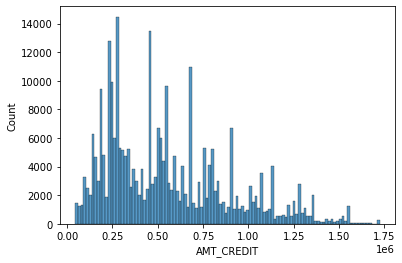

In [85]:
#Plotting histogram of 'AMT_CREDIT' column to get an idea on how to bin the values.
sns.histplot(app0.AMT_CREDIT)

In [86]:
#Binning the values and storing it into a new column
bins = [0,200000,400000,600000,800000,1000000000]
slots = ['0-200000','200000-400000','400000-600000','600000-800000','800000 and above']

app0['AMT_CREDIT_RANGE']=pd.cut(app0['AMT_CREDIT'],bins=bins,labels=slots)

In [87]:
app0['AMT_CREDIT_RANGE'].value_counts()

200000-400000       80440
800000 and above    65797
400000-600000       64757
600000-800000       40427
0-200000            35994
Name: AMT_CREDIT_RANGE, dtype: int64

In [88]:
app0.OCCUPATION_TYPE.value_counts()

Missing                  91249
Laborers                 52910
Sales staff              30735
Core staff               25463
Drivers                  17456
Managers                 16706
High skill tech staff    10450
Accountants               8678
Medicine staff            8192
Security staff            6510
Cooking staff             5797
Cleaning staff            4568
Private service staff     2450
Low-skill Laborers        2068
Waiters/barmen staff      1319
Secretaries               1227
Realty agents              699
HR staff                   493
IT staff                   445
Name: OCCUPATION_TYPE, dtype: int64

In [89]:
app0.CNT_FAM_MEMBERS.value_counts()

2.0     147147
1.0      64761
3.0      48857
4.0      22944
5.0       3225
6.0        366
7.0         76
8.0         20
9.0          6
10.0         3
12.0         2
20.0         2
16.0         2
13.0         1
14.0         1
15.0         1
11.0         1
Name: CNT_FAM_MEMBERS, dtype: int64

In [90]:
#Repalcing all the rows with 5 or above in 'CNT_CHILDREN' column to '5+' as the count is very low for the mentioned numbers.
app0.CNT_FAM_MEMBERS = app0.CNT_FAM_MEMBERS.apply(lambda x: '5+' if x>=5 else x)

In [91]:
#Checking if the code worked
app0.CNT_FAM_MEMBERS.value_counts()

2.0    147147
1.0     64761
3.0     48857
4.0     22944
5+       3706
Name: CNT_FAM_MEMBERS, dtype: int64

In [92]:
app0.ORGANIZATION_TYPE.value_counts()

Business Entity Type 3    61964
XNA                       53292
Self-employed             36201
Other                     15499
Medicine                  10573
Business Entity Type 2     9897
Government                 9821
School                     8415
Trade: type 7              7340
Kindergarten               6652
Construction               6117
Business Entity Type 1     5488
Transport: type 4          4971
Trade: type 3              3316
Industry: type 3           3163
Security                   3073
Industry: type 9           3024
Housing                    2793
Industry: type 11          2581
Agriculture                2368
Military                   2263
Bank                       2224
Postal                     2094
Police                     2078
Transport: type 2          2076
Security Ministries        1736
Trade: type 2              1729
Restaurant                 1724
Services                   1450
Industry: type 7           1244
University                 1178
Transpor

In [93]:
#Replacing 'XNA' with 'Missing'
app0.ORGANIZATION_TYPE = app0.ORGANIZATION_TYPE.apply(lambda x: 'Missing' if x=='XNA' else x)

In [94]:
app0.ORGANIZATION_TYPE.value_counts()

Business Entity Type 3    61964
Missing                   53292
Self-employed             36201
Other                     15499
Medicine                  10573
Business Entity Type 2     9897
Government                 9821
School                     8415
Trade: type 7              7340
Kindergarten               6652
Construction               6117
Business Entity Type 1     5488
Transport: type 4          4971
Trade: type 3              3316
Industry: type 3           3163
Security                   3073
Industry: type 9           3024
Housing                    2793
Industry: type 11          2581
Agriculture                2368
Military                   2263
Bank                       2224
Postal                     2094
Police                     2078
Transport: type 2          2076
Security Ministries        1736
Trade: type 2              1729
Restaurant                 1724
Services                   1450
Industry: type 7           1244
University                 1178
Transpor

In [95]:
app0.OBS_30_CNT_SOCIAL_CIRCLE.value_counts()

0.0      153204
1.0       45752
2.0       27985
3.0       19138
4.0       13420
5.0        9039
6.0        6043
7.0        4183
8.0        2799
9.0        1896
10.0       1317
11.0        805
12.0        624
13.0        395
14.0        243
15.0        156
16.0        128
17.0         78
18.0         45
19.0         41
20.0         29
21.0         28
22.0         21
23.0         12
25.0         10
24.0         10
27.0          5
26.0          3
30.0          2
28.0          1
29.0          1
47.0          1
348.0         1
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: int64

In [96]:
#Repalcing all the rows with 10 or above in 'OBS_30_CNT_SOCIAL_CIRCLE' column to '10+' as the count is very low for the mentioned numbers.
app0.OBS_30_CNT_SOCIAL_CIRCLE = app0.OBS_30_CNT_SOCIAL_CIRCLE.apply(lambda x: '10+' if x>=10 else x)

In [97]:
#Checking if the code worked
app0.OBS_30_CNT_SOCIAL_CIRCLE.value_counts()

0.0    153204
1.0     45752
2.0     27985
3.0     19138
4.0     13420
5.0      9039
6.0      6043
7.0      4183
10+      3956
8.0      2799
9.0      1896
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: int64

In [98]:
app0.DEF_30_CNT_SOCIAL_CIRCLE.value_counts()

0.0     253966
1.0      26891
2.0       5100
3.0       1146
4.0        244
5.0         54
6.0         11
7.0          1
34.0         1
8.0          1
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: int64

In [99]:
#Repalcing all the rows with 5 or above in 'DEF_30_CNT_SOCIAL_CIRCLE' column to '5+' as the count is very low for the mentioned numbers.
app0.DEF_30_CNT_SOCIAL_CIRCLE = app0.DEF_30_CNT_SOCIAL_CIRCLE.apply(lambda x: '5+' if x>=5 else x)

In [100]:
#Checking if the code worked
app0.DEF_30_CNT_SOCIAL_CIRCLE.value_counts()

0.0    253966
1.0     26891
2.0      5100
3.0      1146
4.0       244
5+         68
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: int64

In [101]:
app0.OBS_60_CNT_SOCIAL_CIRCLE.value_counts()

0.0      153917
1.0       45833
2.0       27958
3.0       19019
4.0       13243
5.0        8947
6.0        5956
7.0        4130
8.0        2728
9.0        1855
10.0       1273
11.0        795
12.0        593
13.0        387
14.0        221
15.0        158
16.0        130
17.0         65
18.0         48
19.0         41
20.0         29
21.0         26
22.0         19
24.0         11
23.0         11
25.0         10
27.0          5
29.0          2
28.0          1
47.0          1
344.0         1
30.0          1
26.0          1
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: int64

In [102]:
#Repalcing all the rows with 10 or above in 'OBS_60_CNT_SOCIAL_CIRCLE' column to '10+' as the count is very low for the mentioned numbers.
app0.OBS_60_CNT_SOCIAL_CIRCLE = app0.OBS_60_CNT_SOCIAL_CIRCLE.apply(lambda x: '10+' if x>=10 else x)

In [103]:
#Checking if the code worked
app0.OBS_60_CNT_SOCIAL_CIRCLE.value_counts()

0.0    153917
1.0     45833
2.0     27958
3.0     19019
4.0     13243
5.0      8947
6.0      5956
7.0      4130
10+      3829
8.0      2728
9.0      1855
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: int64

In [104]:
app0.DEF_60_CNT_SOCIAL_CIRCLE.value_counts()

0.0     262841
1.0      20781
2.0       3059
3.0        579
4.0        131
5.0         19
6.0          3
7.0          1
24.0         1
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: int64

In [105]:
#Repalcing all the rows with 4 or above in 'DEF_60_CNT_SOCIAL_CIRCLE' column to '4+' as the count is very low for the mentioned numbers.
app0.DEF_60_CNT_SOCIAL_CIRCLE = app0.DEF_60_CNT_SOCIAL_CIRCLE.apply(lambda x: '4+' if x>=4 else x)

In [106]:
#Checking if the code worked
app0.DEF_60_CNT_SOCIAL_CIRCLE.value_counts()

0.0    262841
1.0     20781
2.0      3059
3.0       579
4+        155
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: int64

In [107]:
app0.YEARS_LAST_PHONE_CHANGE.value_counts()

0.0     87045
1.0     53929
4.0     35463
2.0     35389
3.0     28058
5.0     20554
6.0     14117
7.0      7665
8.0      3784
9.0      1222
10.0      166
11.0       23
Name: YEARS_LAST_PHONE_CHANGE, dtype: int64

In [108]:
#Repalcing all the rows with 8 or above in 'YEARS_LAST_PHONE_CHANGE' column to '8+' as the count is very low for the mentioned numbers.
app0.YEARS_LAST_PHONE_CHANGE = app0.YEARS_LAST_PHONE_CHANGE.apply(lambda x: '8+' if x>=8 else x)

In [109]:
#Checking if the code worked
app0.YEARS_LAST_PHONE_CHANGE.value_counts()

0.0    87045
1.0    53929
4.0    35463
2.0    35389
3.0    28058
5.0    20554
6.0    14117
7.0     7665
8+      5195
Name: YEARS_LAST_PHONE_CHANGE, dtype: int64

In [110]:
app0.Total_documents.value_counts()

1    253001
0     27887
2      6403
3       123
4         1
Name: Total_documents, dtype: int64

In [111]:
#Replacing 4 with the mode of the column.
app0.Total_documents = app0.Total_documents.apply(lambda x: 1 if x==4 else x)

In [112]:
#Checking if the code worked
app0.Total_documents.value_counts()

1    253002
0     27887
2      6403
3       123
Name: Total_documents, dtype: int64

In [113]:
app0.Total_enquiries.value_counts()

0.0      86384
1.0      50508
2.0      48126
3.0      36766
4.0      25423
5.0      16109
6.0      10119
7.0       6041
8.0       3589
9.0       2124
10.0       993
11.0       445
12.0       259
13.0       154
14.0       120
15.0        83
16.0        52
17.0        35
18.0        27
19.0        21
20.0        15
21.0         9
22.0         4
23.0         3
28.0         1
27.0         1
30.0         1
24.0         1
262.0        1
31.0         1
Name: Total_enquiries, dtype: int64

In [114]:
#Repalcing all the rows with 10 or above in 'Total_enquiries' column to '10+' as the count is very low for the mentioned numbers.
app0.Total_enquiries = app0.Total_enquiries.apply(lambda x: '10+' if x>=10 else x)

In [115]:
#Checking if the code worked
app0.Total_enquiries.value_counts()

0.0    86384
1.0    50508
2.0    48126
3.0    36766
4.0    25423
5.0    16109
6.0    10119
7.0     6041
8.0     3589
10+     2226
9.0     2124
Name: Total_enquiries, dtype: int64

# Univariate Analysis

In [116]:
plt.style.use("ggplot")

#### Creating a function to do Univariate Analysis to Categorical columns to understand the data and its distribution to various different categories

In [123]:
def cat_uni_analysis(x):
    print('Categorical Univariate Analysis of {}'.format(x))
    
    plt.figure(figsize=[15,5])
    plt.subplot(1,2,1)
    plots = sns.countplot(app0[x],order = app0[x].value_counts().index)
    plt.xticks(rotation = 90)
    plt.title('Count of {}'.format(x), fontdict={'fontsize':15})
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')
    
    plt.subplot(1,2,2)
    plt.title('% distribution of {}'.format(x), fontdict={'fontsize':18})
    plt.xlabel(x)
    plt.ylabel('Percentage')
    plots = (app0[x].value_counts()*100/len(app0[x])).plot.bar()
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')
    
    plt.show()
    print('---------------------------------------------------------------------------------------------------------------------')

#### Creating a function to do Univariate Analysis to Numerical columns

In [121]:
def num_uni_analysis(x):
    print('Numerical Univariate Analysis of {}'.format(x))
    print(app0[x].describe())
    plt.figure(figsize=[15,7])
    plt.subplot(1,2,1)
    sns.boxplot(app0[x])
    plt.title('Box Plot of {}:'.format(x),fontdict={'fontsize':18})
    
    plt.subplot(1,2,2)
    sns.distplot(app0[x],hist=False)
    plt.title('Distplot of {}:'.format(x),fontdict={'fontsize':18})
    

    plt.show()
    print('----------------------------------------------------------------------------------------------------------------------')

### Listing out the Categorical columns and applying it to the function created  by using for loop

Categorical Univariate Analysis of TARGET


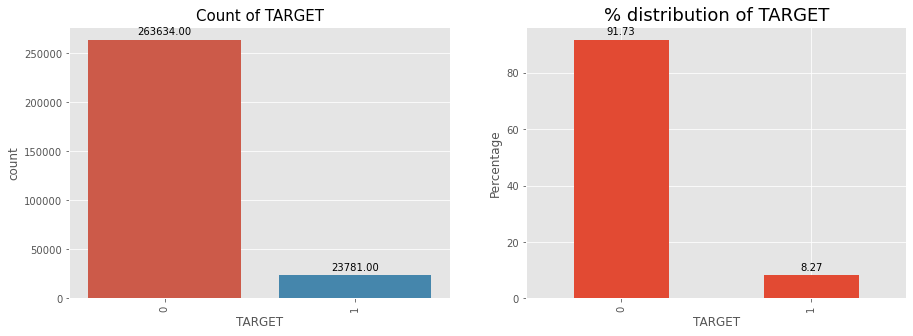

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_CONTRACT_TYPE


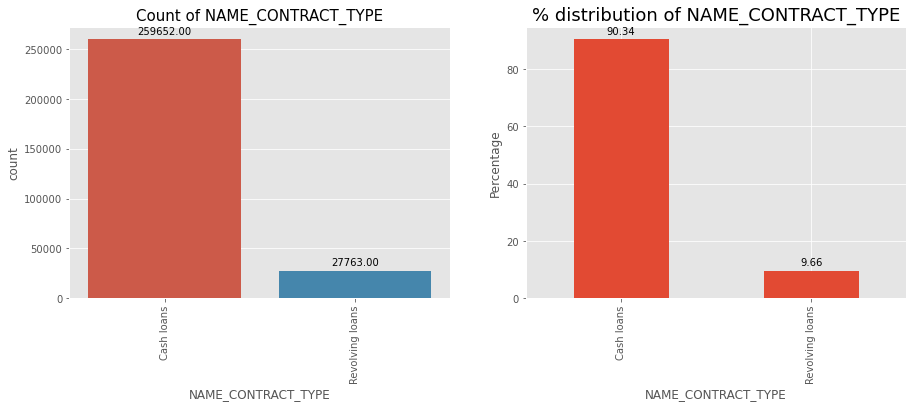

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of CODE_GENDER


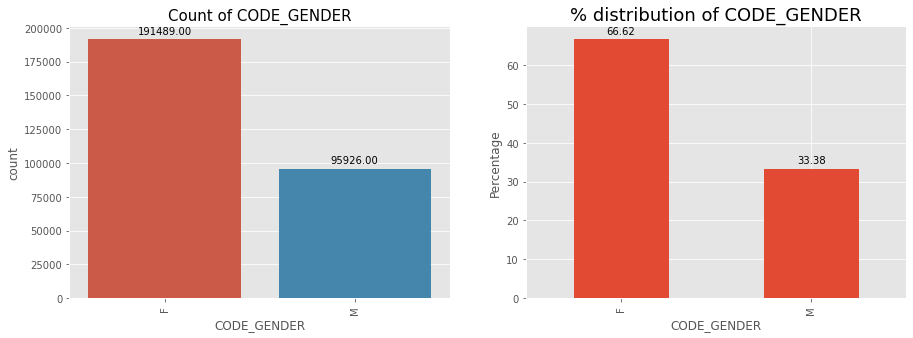

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of CNT_CHILDREN


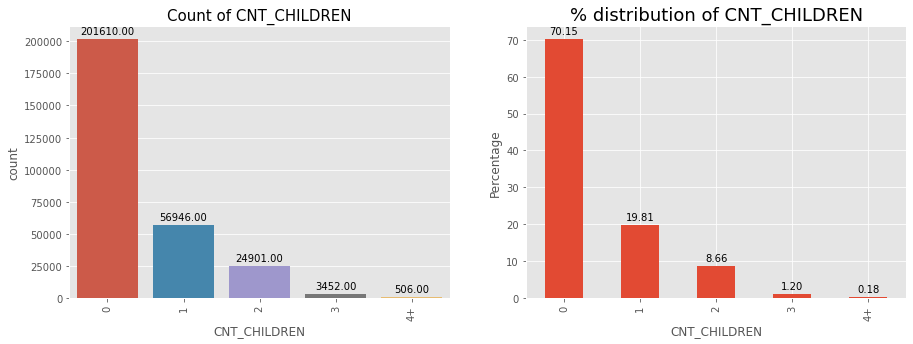

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_TYPE_SUITE


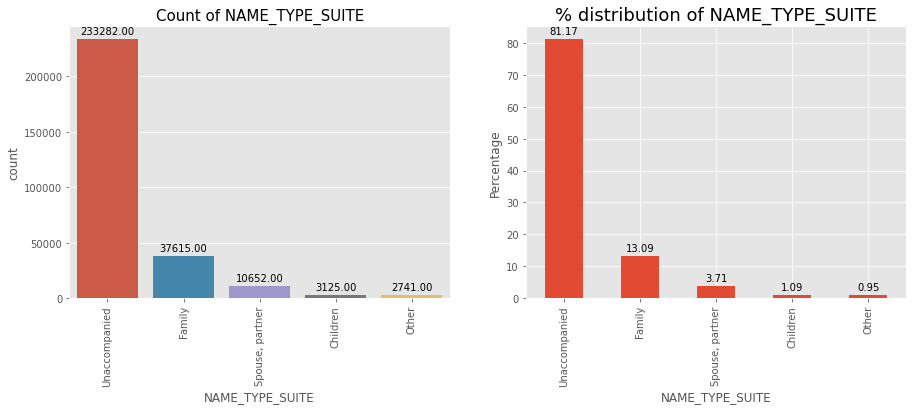

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_INCOME_TYPE


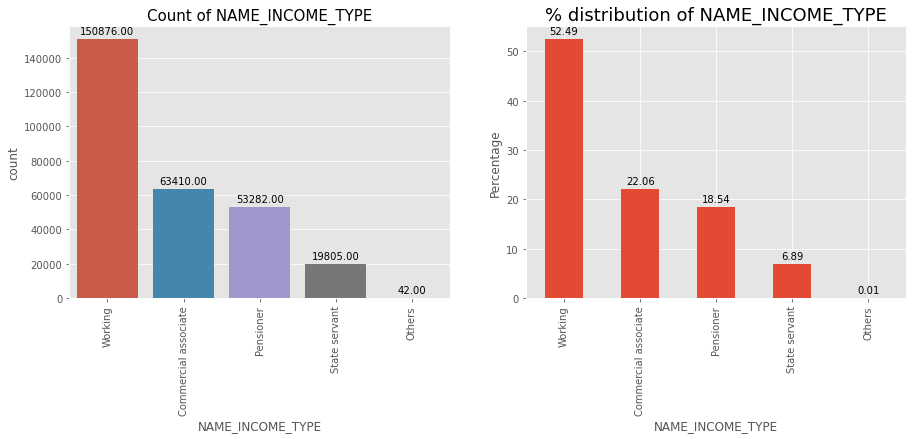

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_EDUCATION_TYPE


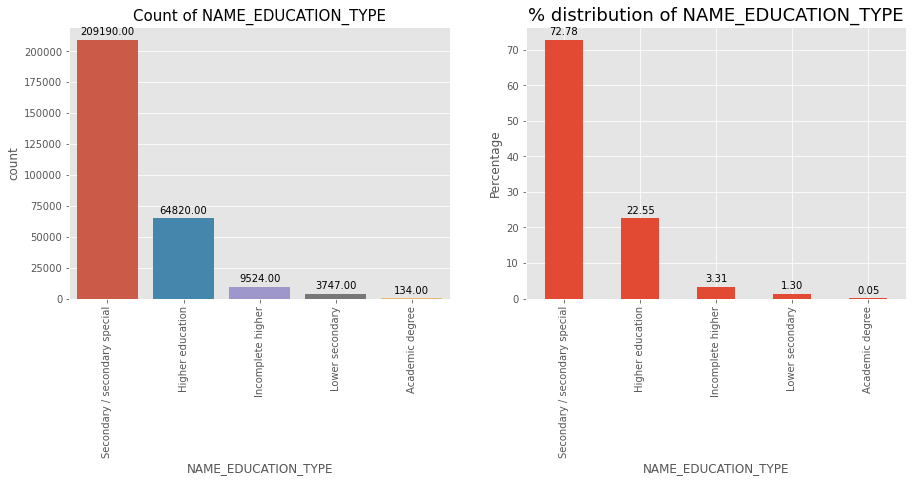

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_FAMILY_STATUS


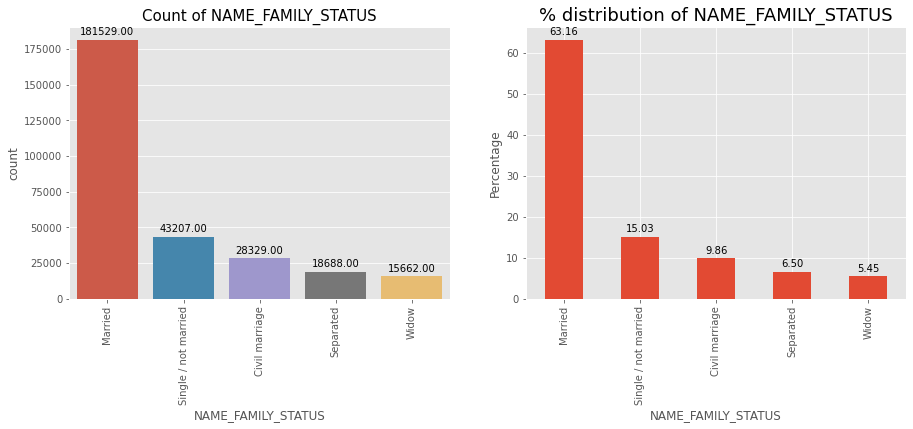

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_HOUSING_TYPE


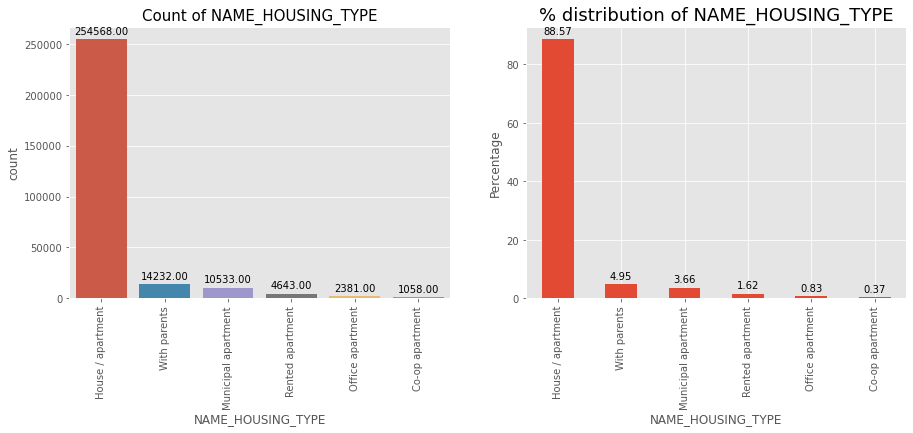

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of REGION_POPULATION_RELATIVE


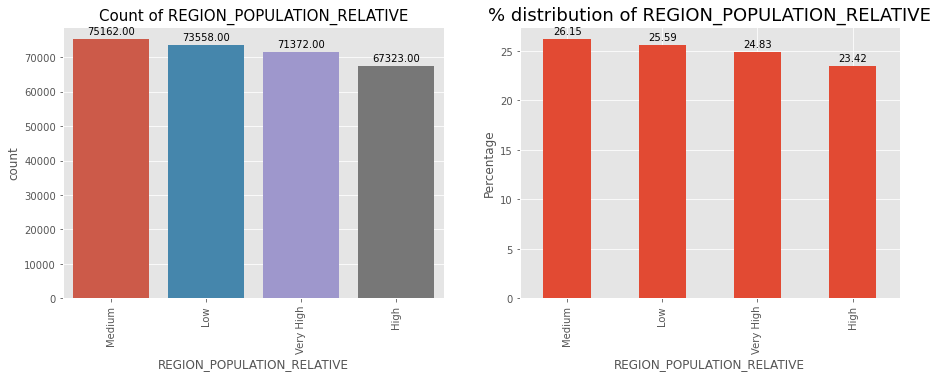

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of AGE


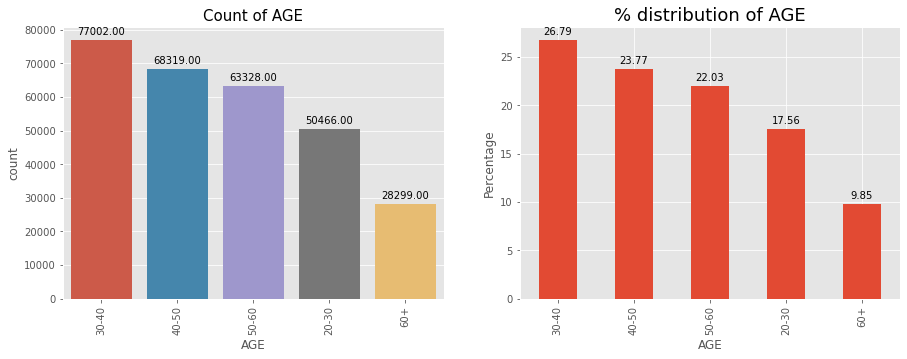

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of YEARS_EMPLOYED


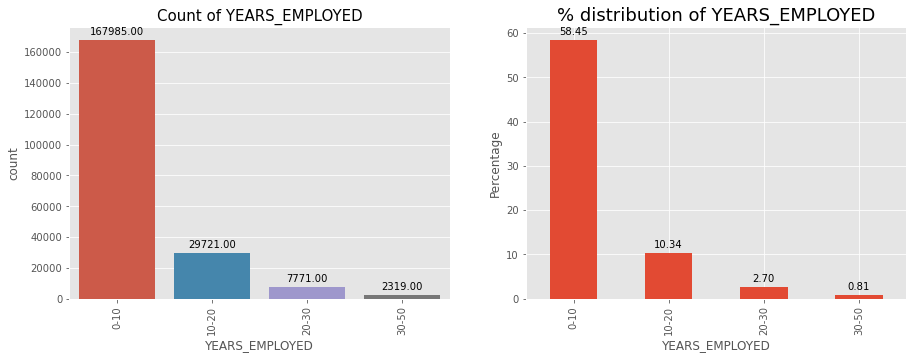

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of YEARS_REGISTRATION


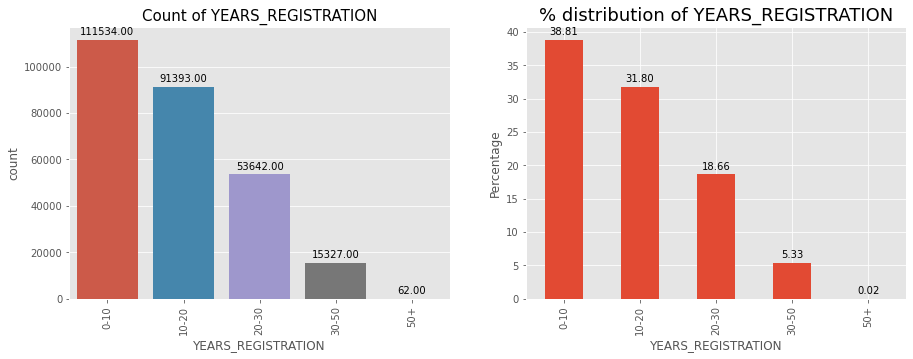

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of YEARS_ID_PUBLISH


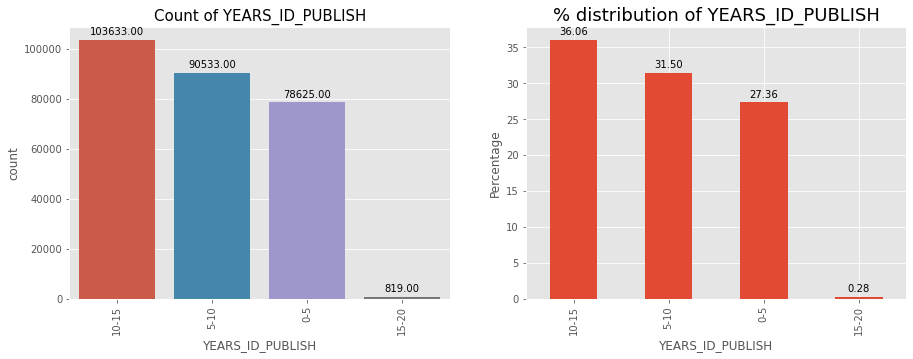

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of OWN_CAR_AGE


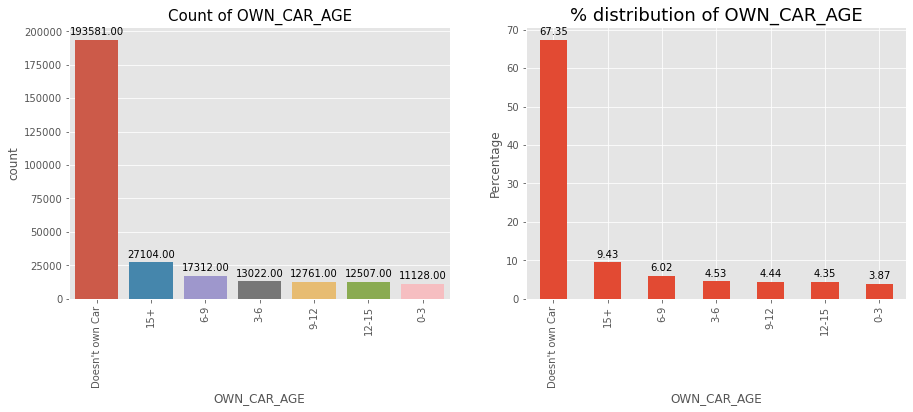

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of OCCUPATION_TYPE


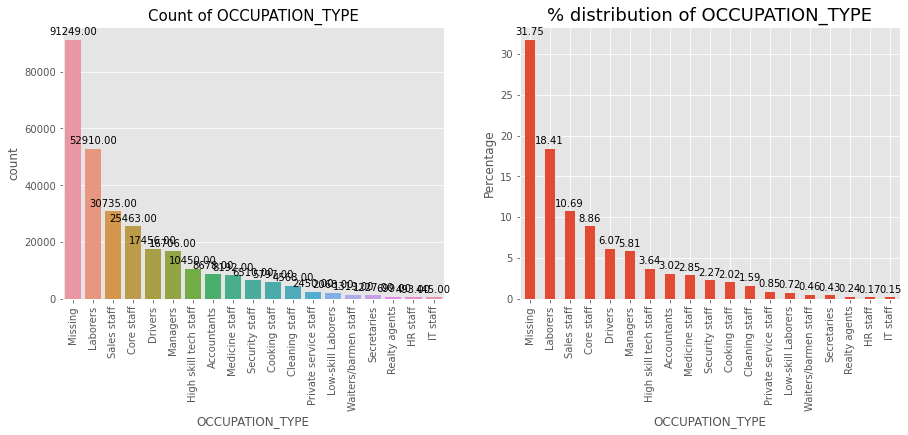

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of Own_car_or_realty


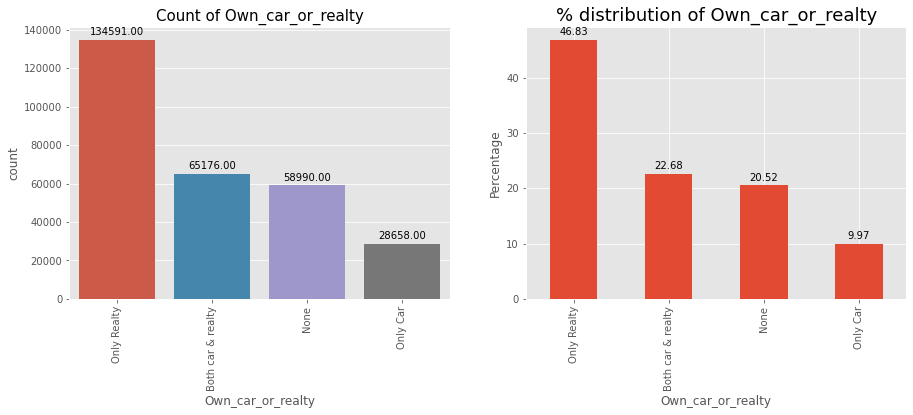

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of Total_enquiries


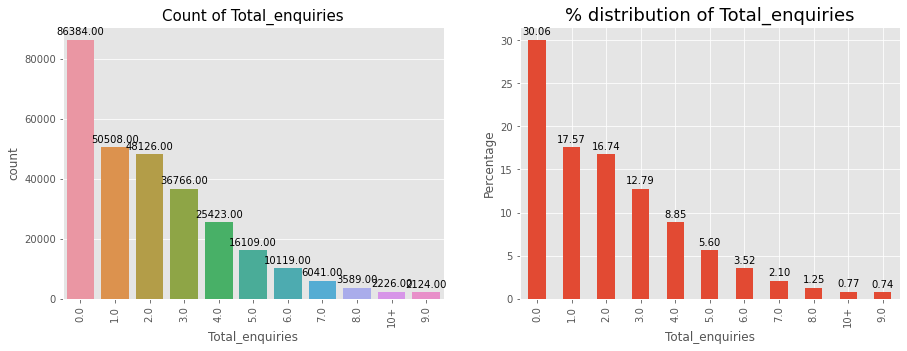

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of Total_documents


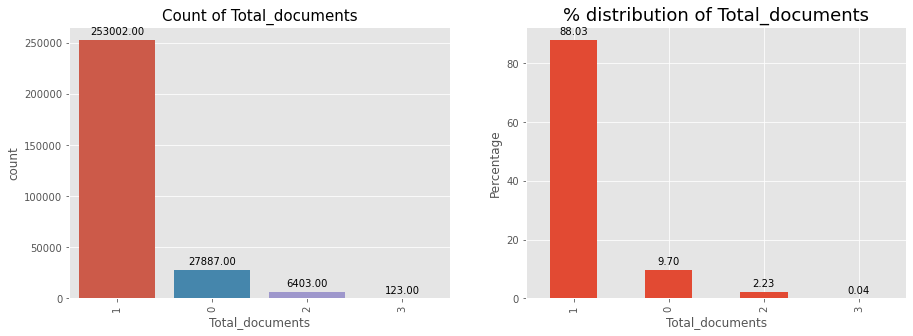

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of Income Group


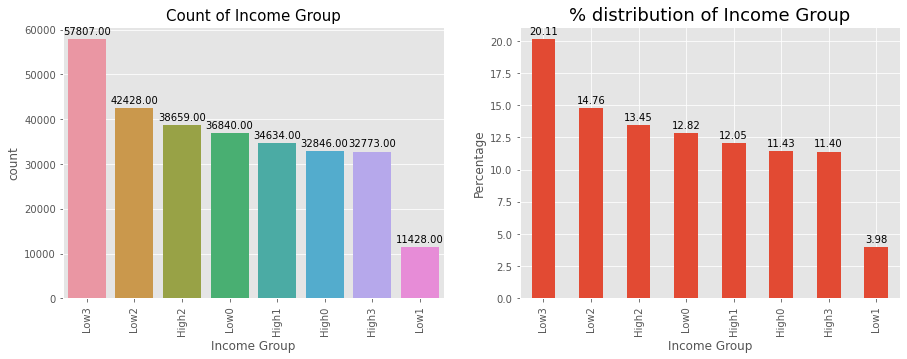

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of AMT_CREDIT_RANGE


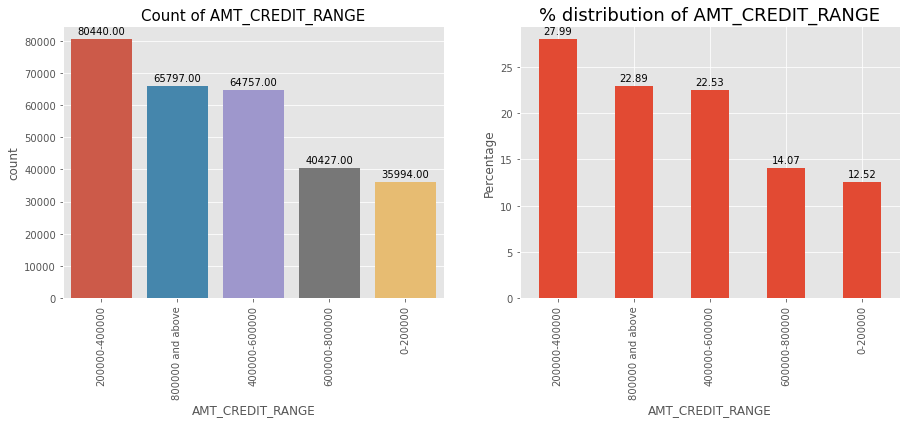

---------------------------------------------------------------------------------------------------------------------


In [125]:
cat_columns = ['TARGET','NAME_CONTRACT_TYPE', 'CODE_GENDER','CNT_CHILDREN','NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'AGE',
       'YEARS_EMPLOYED', 'YEARS_REGISTRATION', 'YEARS_ID_PUBLISH',
       'OWN_CAR_AGE','OCCUPATION_TYPE','Own_car_or_realty','Total_enquiries','Total_documents','Income Group','AMT_CREDIT_RANGE']

for i in cat_columns:
    cat_uni_analysis(i)

Using these plots we can clearly identify the distribution of data across different categories for different columns.

### Listing out the Numerical columns and applying it to the function created by using for loop

Numerical Univariate Analysis of AMT_INCOME_TOTAL
count    287415.000000
mean     154470.901144
std       66518.029770
min       25650.000000
25%      112500.000000
50%      135000.000000
75%      193500.000000
max      360000.000000
Name: AMT_INCOME_TOTAL, dtype: float64


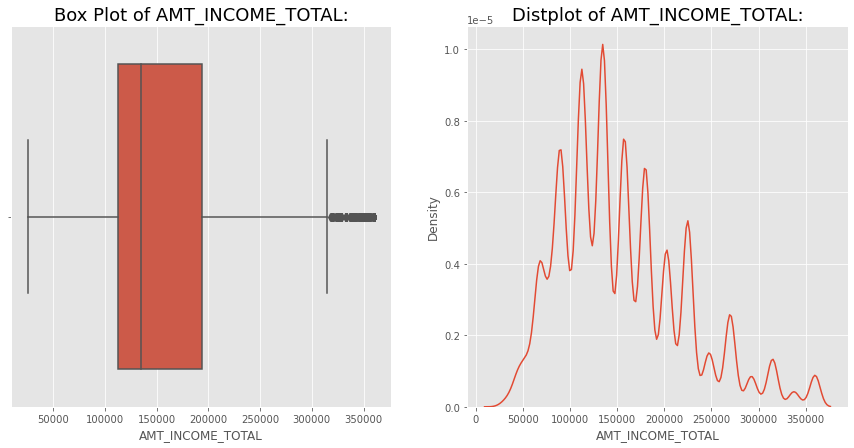

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis of AMT_CREDIT
count    2.874150e+05
mean     5.518602e+05
std      3.418603e+05
min      4.500000e+04
25%      2.700000e+05
50%      4.905360e+05
75%      7.650000e+05
max      1.724220e+06
Name: AMT_CREDIT, dtype: float64


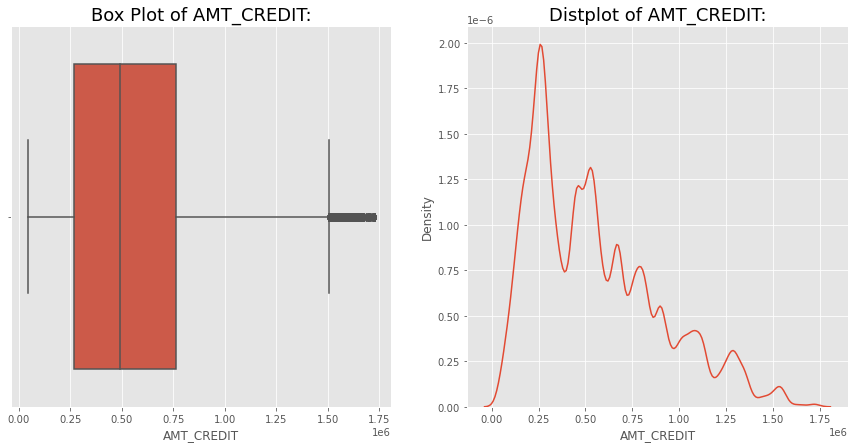

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis of AMT_ANNUITY
count    287415.000000
mean      25152.636621
std       11619.508960
min        1615.500000
25%       16092.000000
50%       23944.500000
75%       32386.500000
max       58963.500000
Name: AMT_ANNUITY, dtype: float64


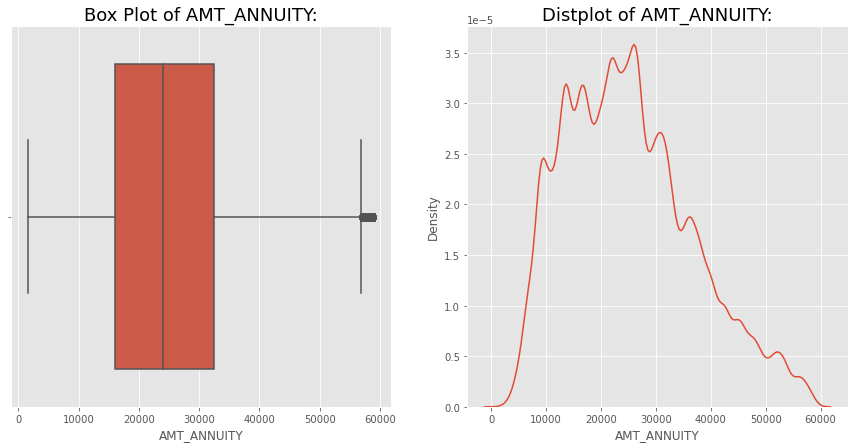

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis of AMT_GOODS_PRICE
count    2.874150e+05
mean     4.929022e+05
std      3.073241e+05
min      4.050000e+04
25%      2.295000e+05
50%      4.500000e+05
75%      6.750000e+05
max      1.395000e+06
Name: AMT_GOODS_PRICE, dtype: float64


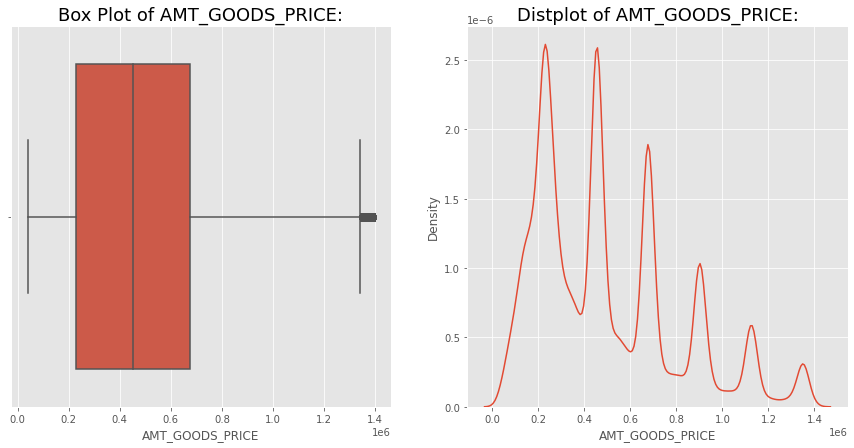

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis of EXT_SOURCE_2
count    2.874150e+05
mean     5.093801e-01
std      1.914889e-01
min      8.173617e-08
25%      3.846284e-01
50%      5.608945e-01
75%      6.593816e-01
max      8.549997e-01
Name: EXT_SOURCE_2, dtype: float64


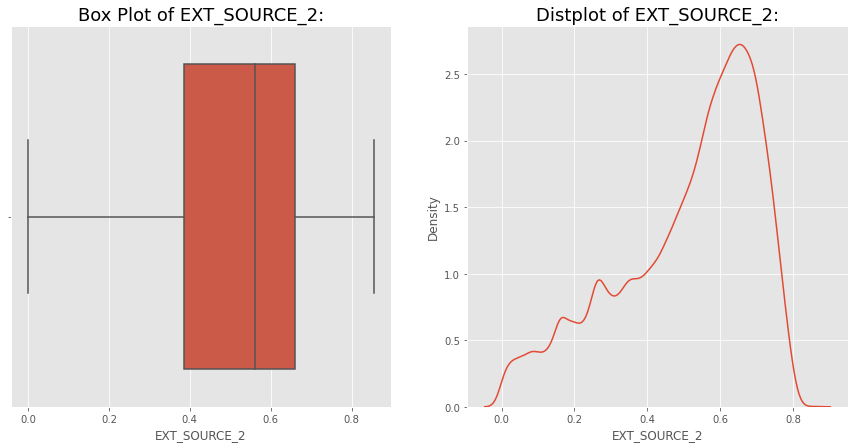

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis of EXT_SOURCE_3
count    287415.000000
mean          0.515286
std           0.174833
min           0.000527
25%           0.417100
50%           0.535276
75%           0.634706
max           0.896010
Name: EXT_SOURCE_3, dtype: float64


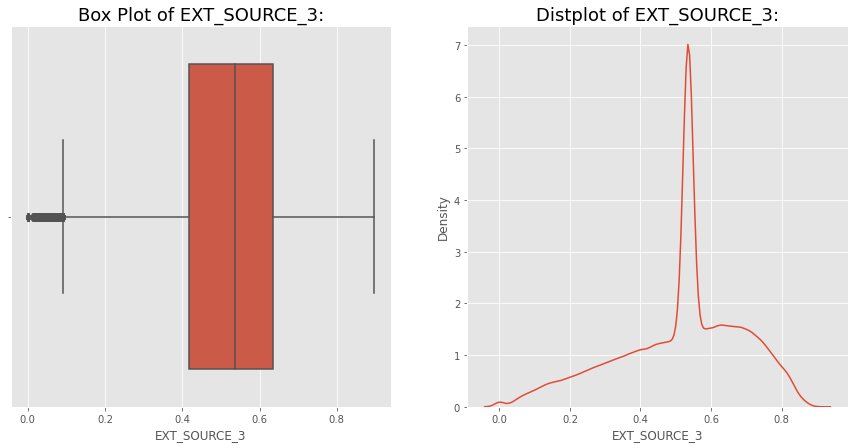

----------------------------------------------------------------------------------------------------------------------


In [126]:
num_columns = ['AMT_INCOME_TOTAL','AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE','EXT_SOURCE_2','EXT_SOURCE_3']
for i in num_columns:
    num_uni_analysis(i)

##### Using this function we are applying describe function on numerical columns and also plotting its boxplot and distplot.

## Segmented Univariate Analysis and Bivariate Analysis

#### Assigning the Defaulters and Non-Defaulters to different variables

In [136]:
df0 = app0[app0.TARGET==0]
df1 = app0[app0.TARGET==1]

### Creating a function to do Segmented Univariate Analysis to Categorical columns to understand the data and its distribution to various different categories and to do Bivariate Analysis vs TARGET to find their defaulting percentage

In [137]:
def seg_cat_uni_analysis(x):
    print('Segmented Categorical Univariate Analysis of {}'.format(x))
    print('')
    
    plt.figure(figsize=[25,8])
    
    plt.subplot(1,2,1)
    plots = sns.countplot(x,hue='TARGET',data=app0)
    plt.xticks(rotation = 90)
    plt.title('Count of {} wrt TARGET'.format(x), fontdict={'fontsize':15})
    plt.xlabel(x,fontdict={'fontsize':14})
    plt.ylabel('Count',fontdict={'fontsize':15})
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')
    
    plt.subplot(1,2,2)
    plots = (app0[x][app0['TARGET']==1].value_counts()*100/app0[x].value_counts()).plot.bar()
    plt.xticks(rotation = 90)
    plt.title('% of Total Def by Total count wrt {}'.format(x), fontdict={'fontsize':15})
    plt.xlabel(x,fontdict={'fontsize':14})
    plt.ylabel('Percentage',fontdict={'fontsize':15})
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')

    plt.show()
    print('---------------------------------------------------------------------------------------------------------------------')

## Creating a function to do Segmented Univariate Analysis and Bivariate Analysis to Numerical columns

In [138]:
def seg_num_uni_analysis(x):
    print('Numerical Univariate Analysis of Defaulters wrt {}'.format(x))
    print(round(df1[x].describe(),2))
    print('')
    print('Numerical Univariate Analysis of Non-Defaulters wrt {}'.format(x))
    print(round(df0[x].describe(),2))    
    
    plt.figure(figsize=[25,8])
    
    plt.subplot(1,2,1)
    sns.boxplot(x=app0.TARGET,y=app0[x])
    plt.title('Box Plot of Non-Def vs Def wrt {}:'.format(x),fontdict={'fontsize':18})
    
    plt.subplot(1,2,2)
    sns.distplot(df0[x],hist=False,label='Non-Defaulter')
    sns.distplot(df1[x],hist=False,label='Defaulter')
    plt.title('Distplot of Non-Def vs Def wrt {}:'.format(x),fontdict={'fontsize':18})
    

    plt.legend()
    plt.show()
    print('----------------------------------------------------------------------------------------------------------------------')


### Listing out the Categorical columns and applying it to the function created by using for loop

Segmented Categorical Univariate Analysis of NAME_CONTRACT_TYPE



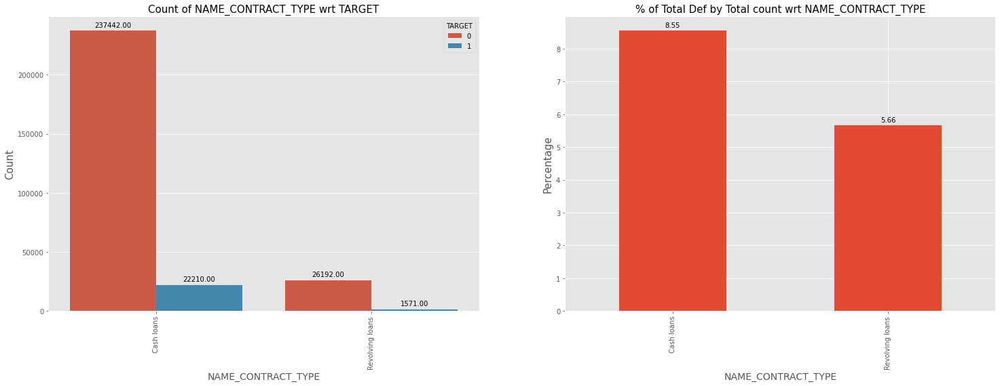

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of CODE_GENDER



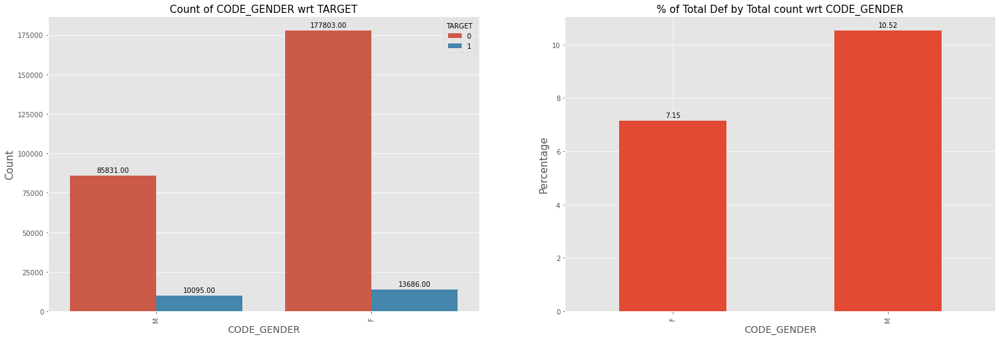

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of CNT_CHILDREN



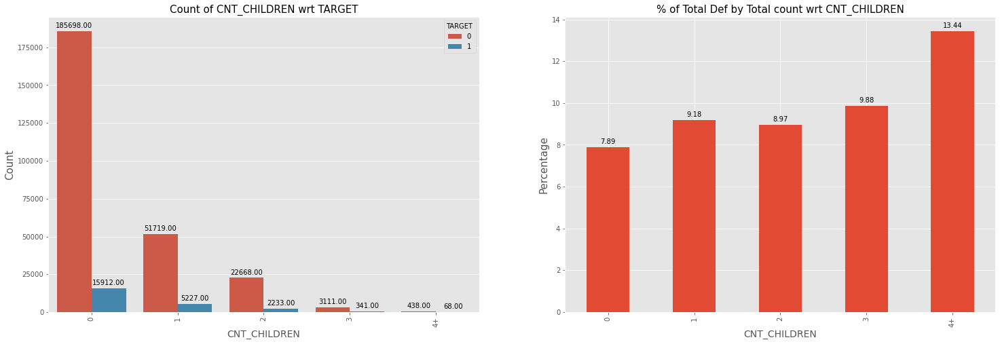

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_TYPE_SUITE



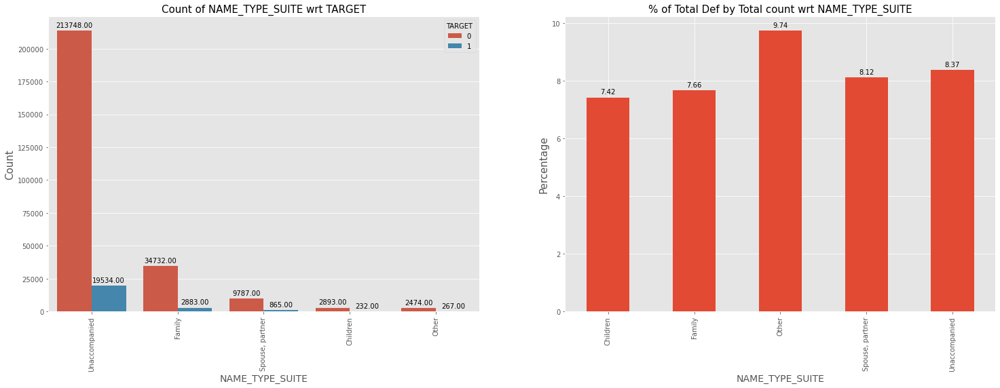

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_INCOME_TYPE



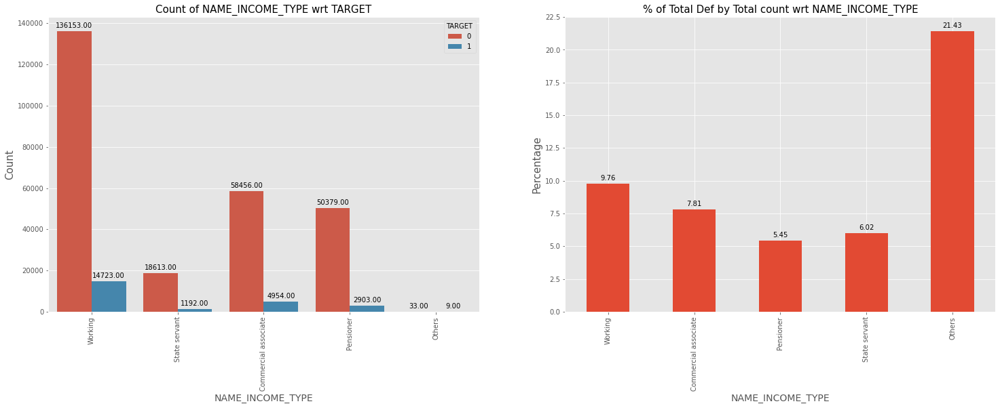

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_EDUCATION_TYPE



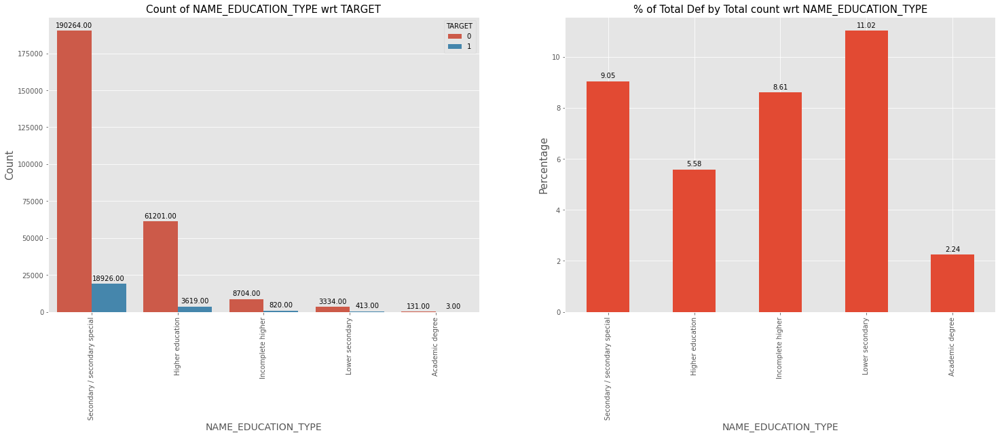

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_FAMILY_STATUS



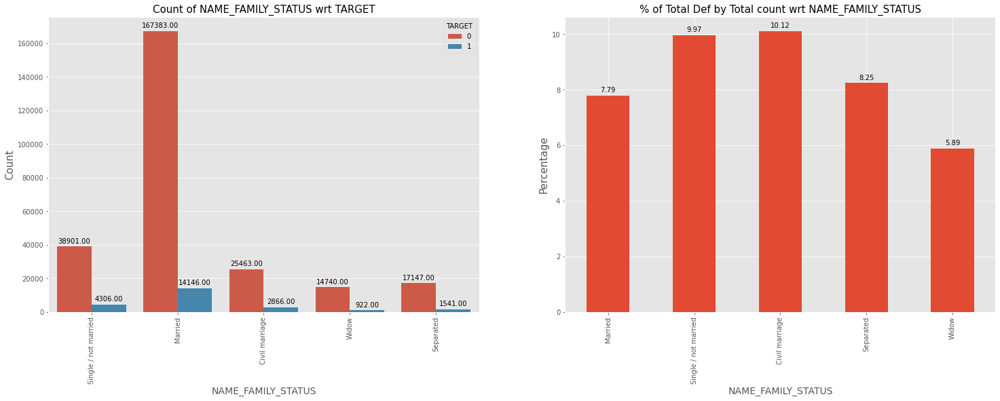

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_HOUSING_TYPE



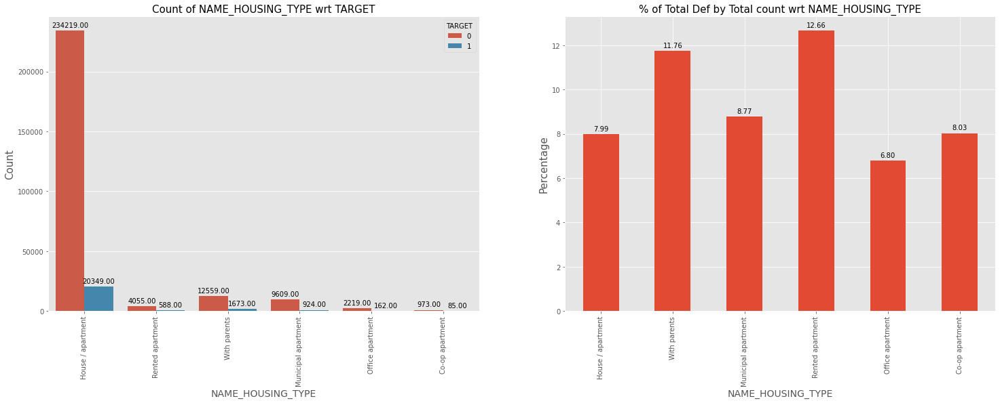

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of REGION_POPULATION_RELATIVE



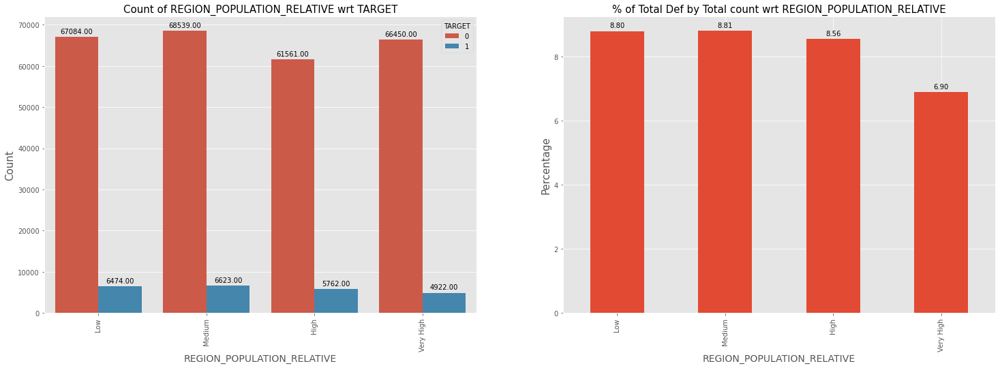

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of AGE



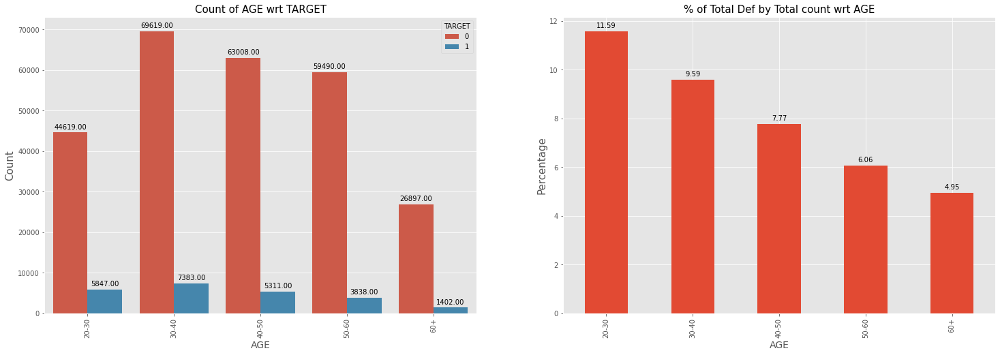

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of YEARS_EMPLOYED



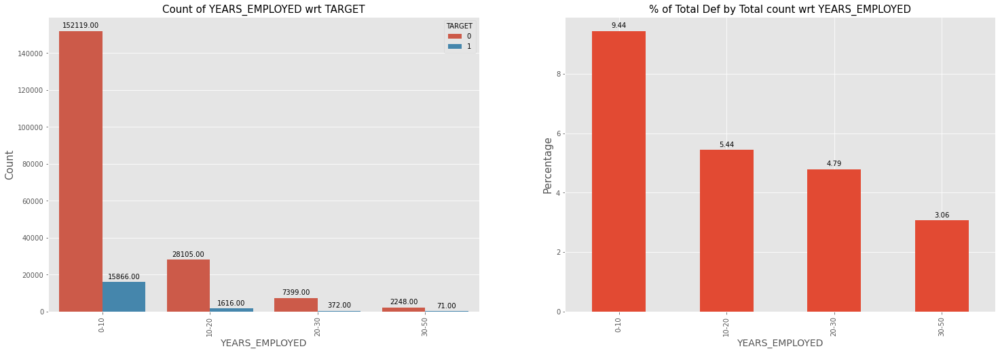

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of YEARS_REGISTRATION



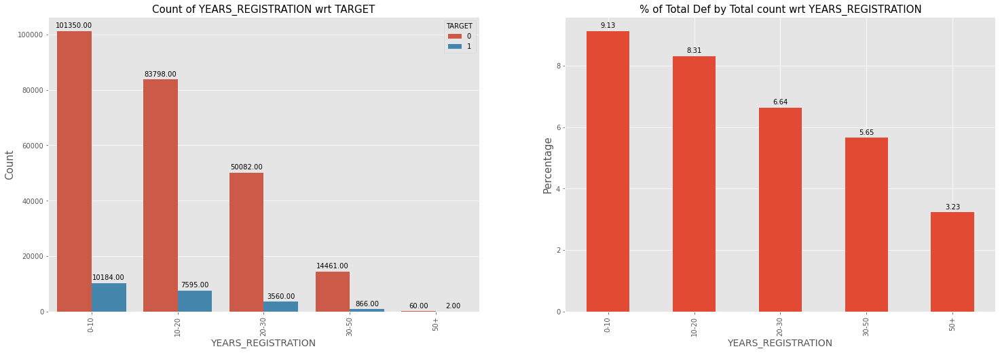

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of YEARS_ID_PUBLISH



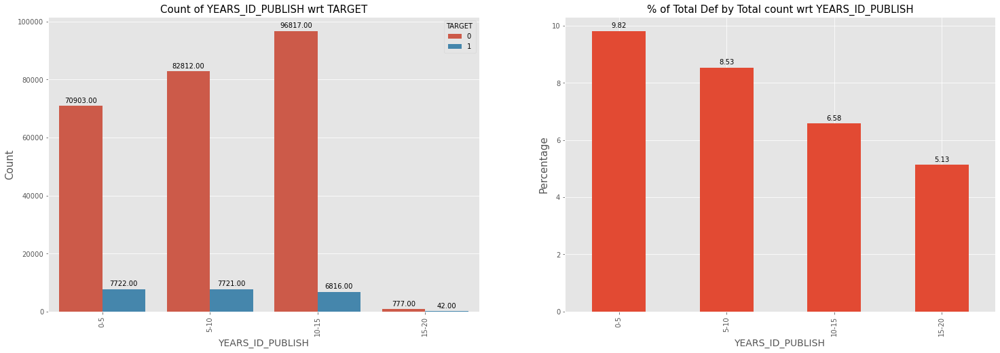

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of OWN_CAR_AGE



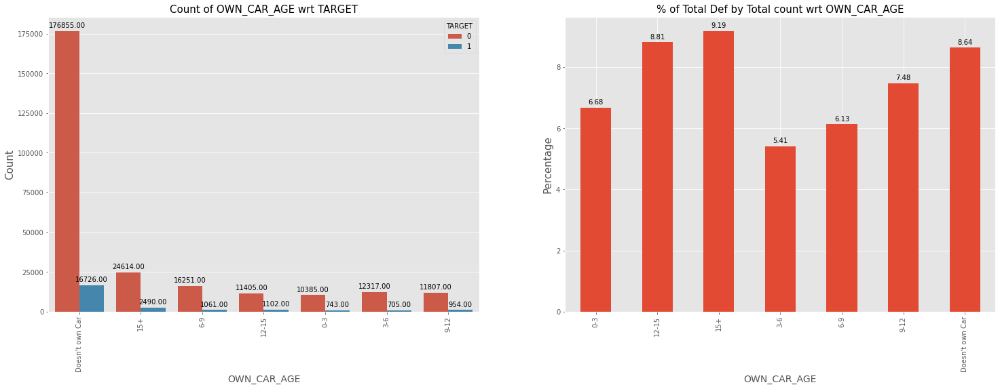

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of OCCUPATION_TYPE



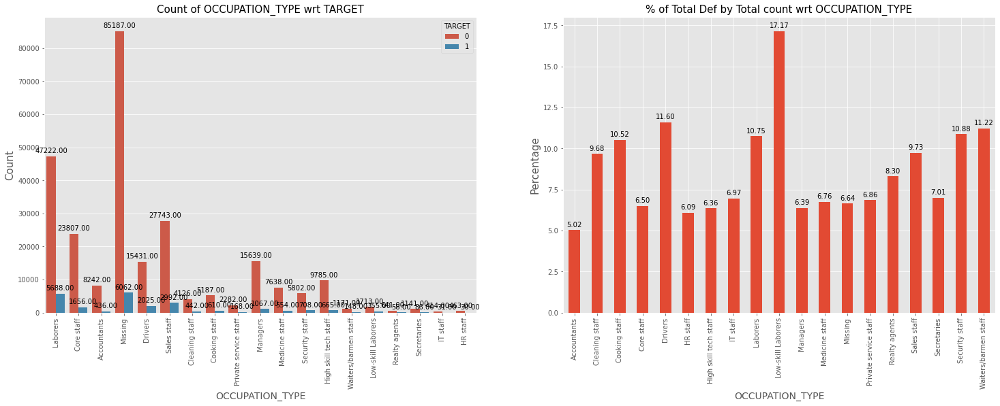

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of Own_car_or_realty



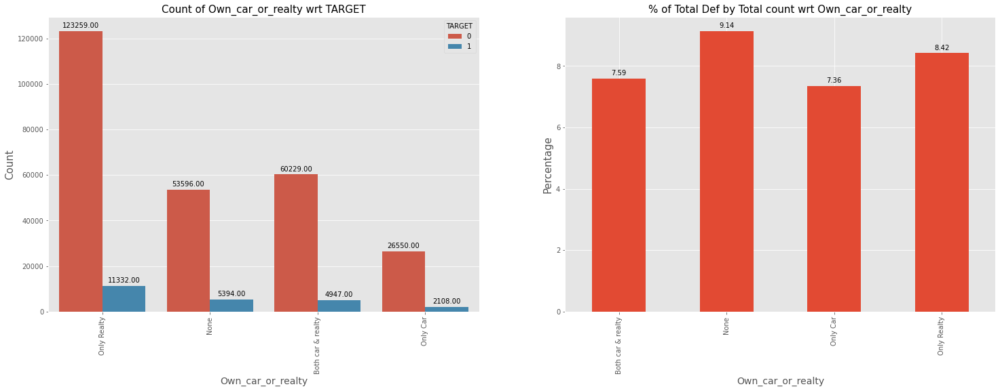

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of Total_enquiries



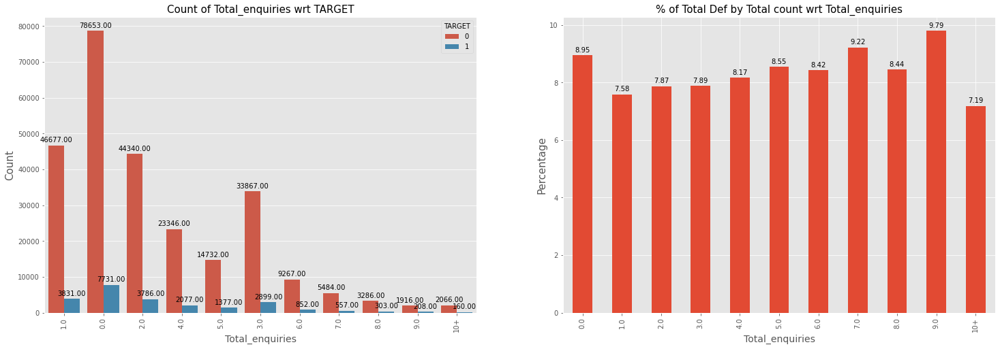

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of Total_documents



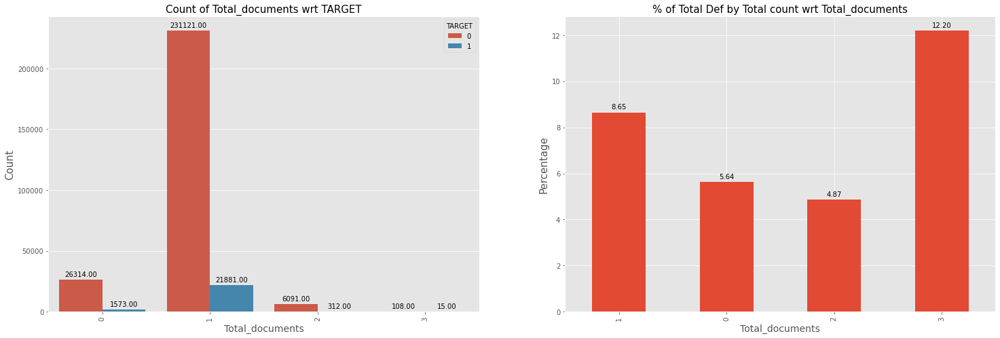

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of Income Group



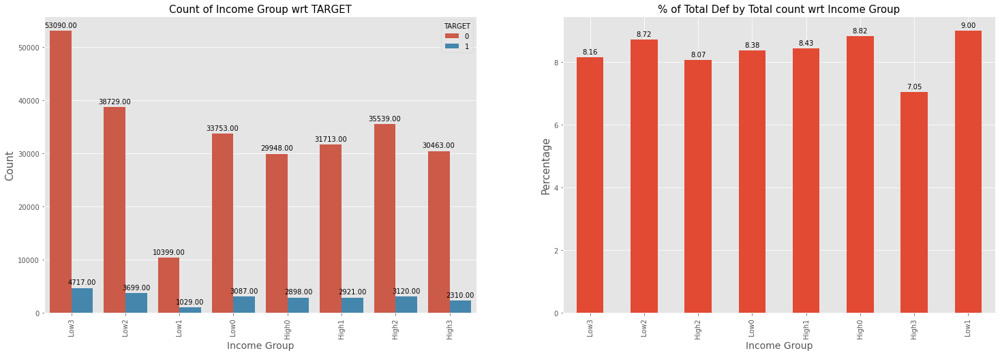

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of AMT_CREDIT_RANGE



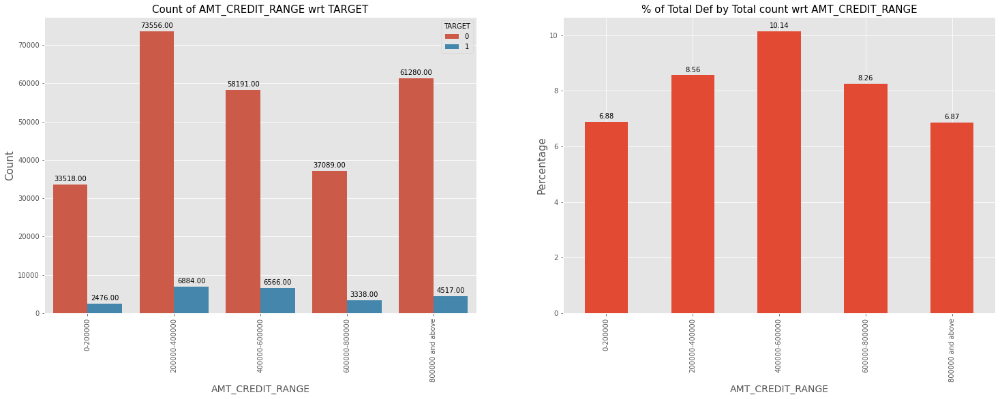

---------------------------------------------------------------------------------------------------------------------


In [139]:
cat_columns = ['NAME_CONTRACT_TYPE', 'CODE_GENDER','CNT_CHILDREN','NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'AGE',
       'YEARS_EMPLOYED', 'YEARS_REGISTRATION', 'YEARS_ID_PUBLISH',
       'OWN_CAR_AGE','OCCUPATION_TYPE','Own_car_or_realty','Total_enquiries','Total_documents','Income Group','AMT_CREDIT_RANGE']

for i in cat_columns:
    seg_cat_uni_analysis(i)

### Inference:

1. Male are high Defaulters compared to Female
2. As the number of children increase, the percentage of defaulters also increases.
3. In the NAME_INCOME_TYPE, Others are the high defaulter. This others contain ['Unemployed', 'Student', 'Businessman', 'Maternity leave'].
   This is followed by Working and Commercial Associate as high defaulters. Pensioners and State servant are the least defaulters.
4. Under NAME_EDUCATION_TYPE we see that Lower Secondary and Secondary special are the group of people who are high defaulters.
   People with Academic degree amount to the least amount of defaulters.
5. For NAME_FAMILY_STATUS we see that Civil Marriage and Single/ not married have higher defaulting rates.
   Widows are the least amount of defaulters.
6. For NAME_HOUSING_TYPE we see that people living in rented apartmets or people living with their parents have higher defaulting rates. Whereas people living in Office Apartments and House have lesser defaulting rates.
7. For REGION_POPULATION_RELATIVE there is a clear trend which shows that as the population of the place increase, the defaulting percentage decrease. This could be because since there are more people there is a possibility to have more jobs available and more oppurtunity to earn money.
8. For AGE column there is a clear trend which shows that young people have difficulties to pay back the loans compared to the old people. Therefore the rate of defaulting decreases as the age increases.
9. For YEARS_EMPLOYED column there is a clear trend which shows that people with less experience have difficulties to pay back the loans compared to the highly experienced people. Therefore the rate of defaulting decreases as the amount of experience increases. This could be possible as people who are more experienced could be paid higher compared to a fresher.
10. YEARS_REGISTRATION also follows the trend of AGE and YEARS_EMPLOYED.
11. For OWN_CAR_AGE we see that people who have very old cars, that is over 12 years have higher defaulting rates compared to people who have cars of age 0 to 9. We also see that people who don't own cars also have higher defaulting rates.
12. For OCCUPATION_TYPE we see that people who are low skilled like- Low skilled labours, Drivers, Waitress have higher defaulting percentage. Whereas people who are in jobs that require high educations like- Accountants, HR staff, IT staff, Managers have the least defaulting percentage.
13. From Total_documents we see that people who have submitted 3 documents to have high defaulting percentage.(Can't really tell the reason for it).
14. From Income Group we see that people having the least amount of income are finding it hard to pay back compared to people who have highest income. It is expected, so need to be careful while giving loans to the people who have low income.
15. AMT_CREDIT_RANGE follows trend of a normal distribution curve where the extremes that is 0-200000 and 800000 and above have the least defaulting percentage and the middle 400000-600000 has highest defaulting rates.

## Listing out the Numerical columns and applying it to the function created by using for loop to understand the difference between Defaulters and Non-Defaulters

Numerical Univariate Analysis of Defaulters wrt AMT_INCOME_TOTAL
count     23781.00
mean     151629.59
std       63240.28
min       27000.00
25%      112500.00
50%      135000.00
75%      180000.00
max      360000.00
Name: AMT_INCOME_TOTAL, dtype: float64

Numerical Univariate Analysis of Non-Defaulters wrt AMT_INCOME_TOTAL
count    263634.00
mean     154727.20
std       66799.96
min       25650.00
25%      112500.00
50%      135000.00
75%      198000.00
max      360000.00
Name: AMT_INCOME_TOTAL, dtype: float64


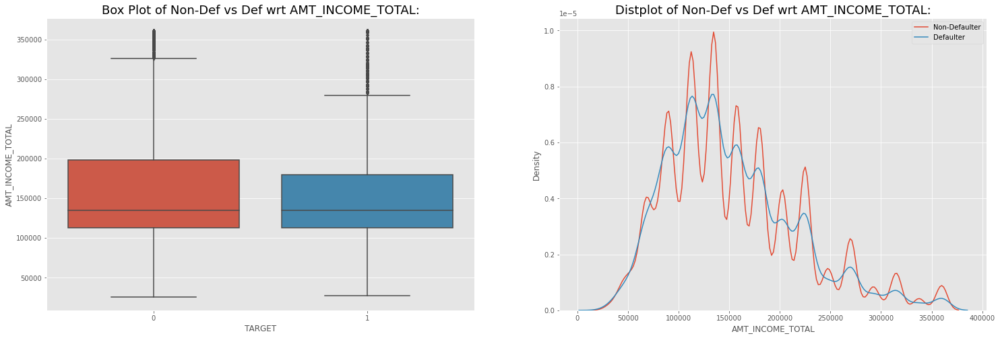

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis of Defaulters wrt AMT_CREDIT
count      23781.00
mean      532938.54
std       309893.91
min        45000.00
25%       283500.00
50%       479637.00
75%       684706.50
max      1724220.00
Name: AMT_CREDIT, dtype: float64

Numerical Univariate Analysis of Non-Defaulters wrt AMT_CREDIT
count     263634.00
mean      553566.99
std       344547.46
min        45000.00
25%       270000.00
50%       490536.00
75%       772686.00
max      1724220.00
Name: AMT_CREDIT, dtype: float64


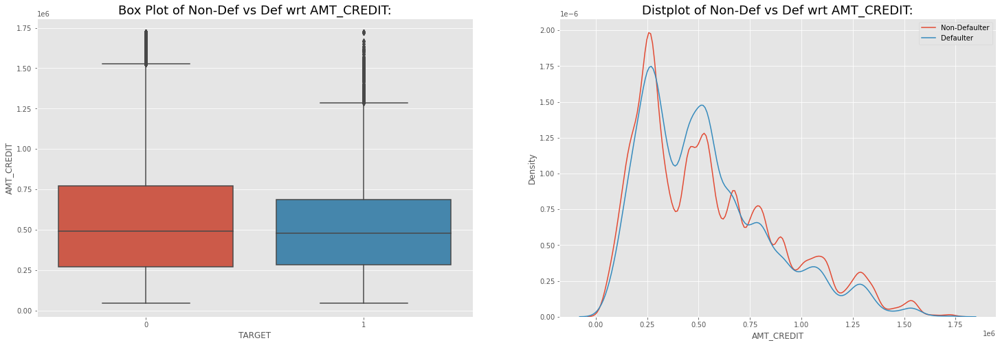

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis of Defaulters wrt AMT_ANNUITY
count    23781.00
mean     25449.76
std      11005.51
min       2722.50
25%      17095.50
50%      24714.00
75%      31932.00
max      58963.50
Name: AMT_ANNUITY, dtype: float64

Numerical Univariate Analysis of Non-Defaulters wrt AMT_ANNUITY
count    263634.00
mean      25125.83
std       11672.95
min        1615.50
25%       16011.00
50%       23895.00
75%       32458.50
max       58963.50
Name: AMT_ANNUITY, dtype: float64


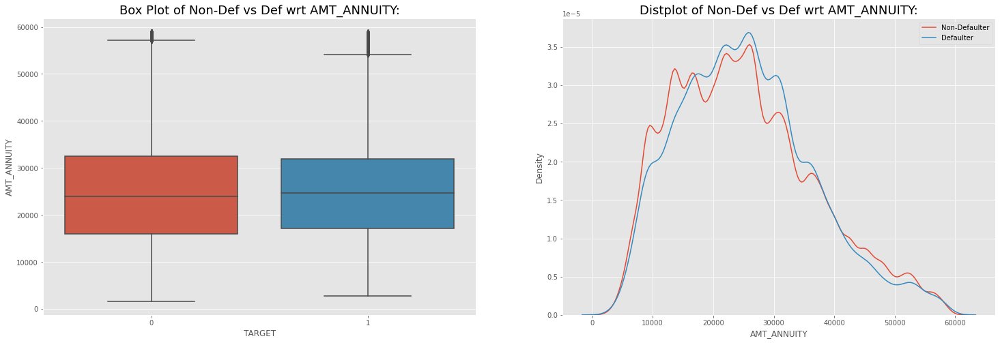

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis of Defaulters wrt AMT_GOODS_PRICE
count      23781.00
mean      465276.18
std       274183.15
min        45000.00
25%       234000.00
50%       450000.00
75%       675000.00
max      1395000.00
Name: AMT_GOODS_PRICE, dtype: float64

Numerical Univariate Analysis of Non-Defaulters wrt AMT_GOODS_PRICE
count     263634.00
mean      495394.17
std       310018.94
min        40500.00
25%       229500.00
50%       450000.00
75%       675000.00
max      1395000.00
Name: AMT_GOODS_PRICE, dtype: float64


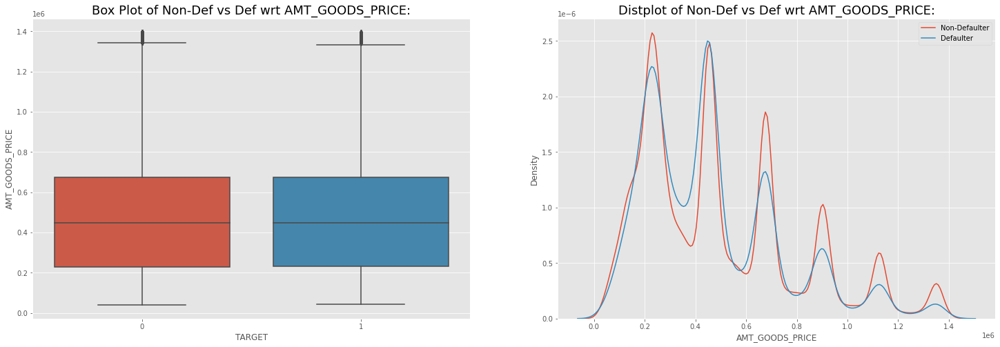

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis of Defaulters wrt EXT_SOURCE_2
count    23781.00
mean         0.41
std          0.21
min          0.00
25%          0.23
50%          0.43
75%          0.59
max          0.81
Name: EXT_SOURCE_2, dtype: float64

Numerical Univariate Analysis of Non-Defaulters wrt EXT_SOURCE_2
count    263634.00
mean          0.52
std           0.19
min           0.00
25%           0.40
50%           0.57
75%           0.66
max           0.85
Name: EXT_SOURCE_2, dtype: float64


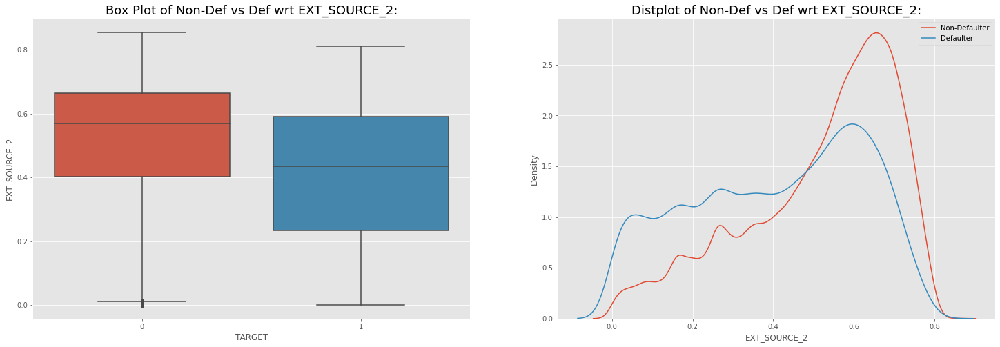

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis of Defaulters wrt EXT_SOURCE_3
count    23781.00
mean         0.42
std          0.19
min          0.00
25%          0.27
50%          0.48
75%          0.54
max          0.90
Name: EXT_SOURCE_3, dtype: float64

Numerical Univariate Analysis of Non-Defaulters wrt EXT_SOURCE_3
count    263634.00
mean          0.52
std           0.17
min           0.00
25%           0.43
50%           0.54
75%           0.64
max           0.89
Name: EXT_SOURCE_3, dtype: float64


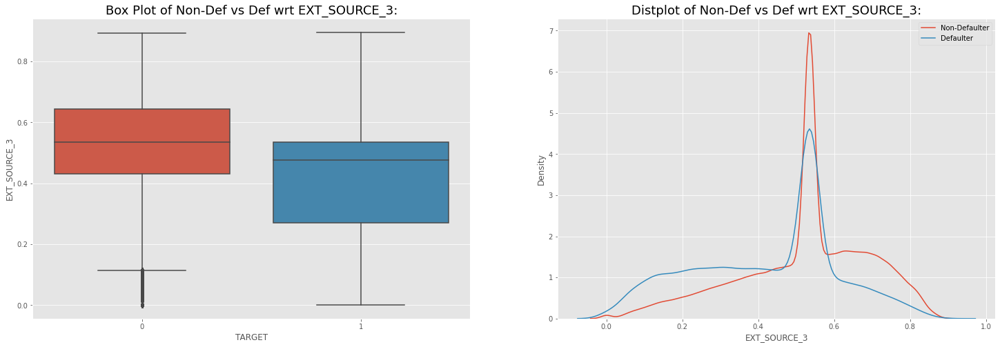

----------------------------------------------------------------------------------------------------------------------


In [140]:
num_columns = ['AMT_INCOME_TOTAL','AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE','EXT_SOURCE_2','EXT_SOURCE_3']
for i in num_columns:
    seg_num_uni_analysis(i)

## Plotting a Heatmap for the visual representation of correlation between different numerical columns 

<AxesSubplot:>

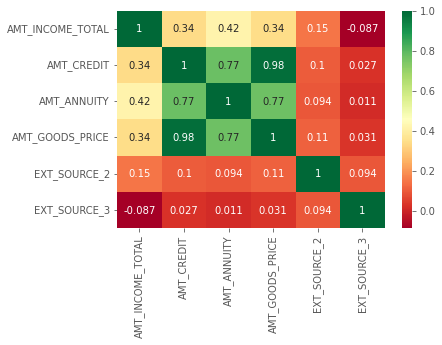

In [141]:
sns.heatmap(app0[['AMT_INCOME_TOTAL','AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE','EXT_SOURCE_2','EXT_SOURCE_3']].corr(),annot=True,cmap='RdYlGn')

### Inference:

We can see that AMT_CREDIT, AMT_ANNUITY, AMT_GOODS_PRICE have high correlation with each other. This is expected. So, we can confirm that the data provided is correct.

We also see that people tend to take more credit as their income increases.


# Bivariate Analysis

## Plotting Boxplot for Income Groups against other Numerical columns

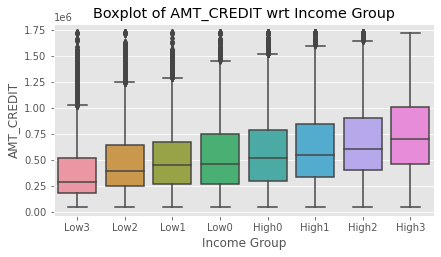

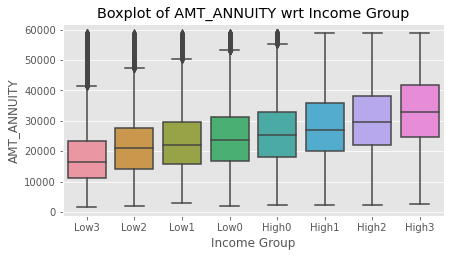

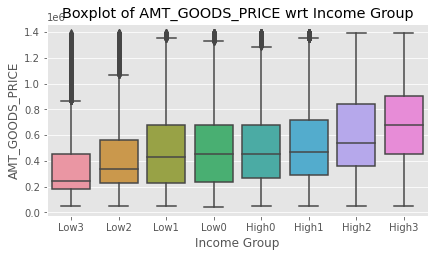

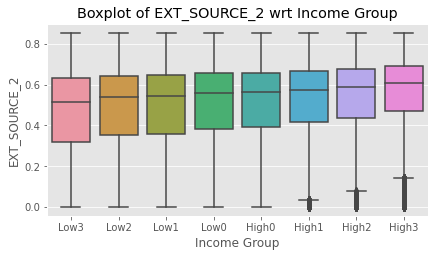

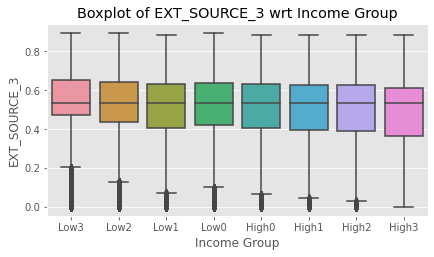

In [142]:
a=3
b=2
c=0
categories = ['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE','EXT_SOURCE_2','EXT_SOURCE_3']
for i in categories:
    c = c + 1
    fig = plt.figure(figsize=(15,12))
    plt.subplot(a, b, c)
    plt.title('Boxplot of {} wrt Income Group'.format(i))
    plt.xlabel(i)
    sns.boxplot(x='Income Group',y=i,data=app0)


plt.show()

### Inference:

1. As people start earning more, people take higher amount of credit.
2. As people start earning more, people pay higher amount of annuity. This is because Credit and Annuity have high corelation.
3. As people start earning more, people take credit for higher amount of goods price. This is because Credit and goods price have very high corelation as expected.
4. As Income increses, EXT_SOURCE_2 also increases slightly.
5. As Income increses, EXT_SOURCE_3 decreases slightly. That is, they are inversely proportional.

## Plotting Boxplot for Income Groups against other Numerical columns to understand the difference in Income between Men & Women

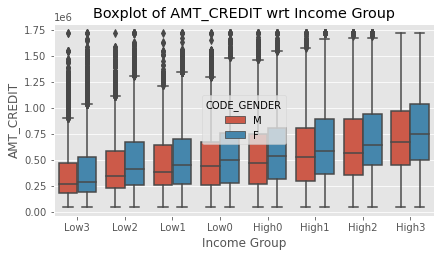

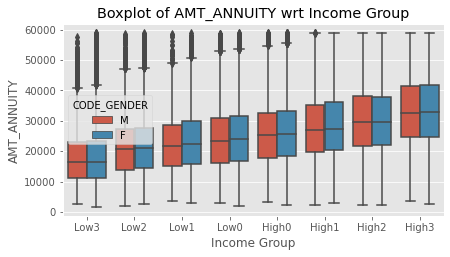

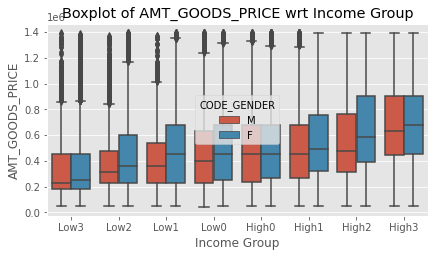

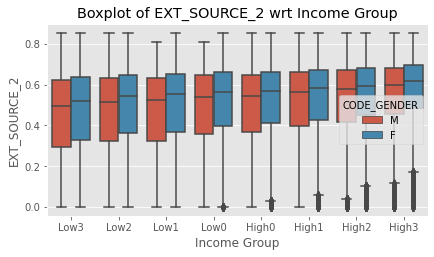

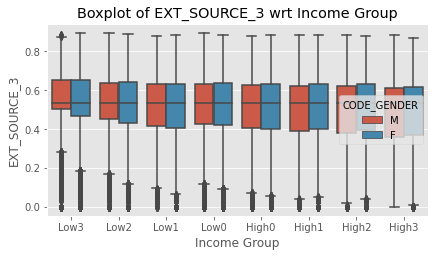

In [143]:
a=3
b=2
c=0
categories = ['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE','EXT_SOURCE_2','EXT_SOURCE_3']
for i in categories:
    c = c + 1
    fig = plt.figure(figsize=(15,12))
    plt.subplot(a, b, c)
    plt.title('Boxplot of {} wrt Income Group'.format(i))
    plt.xlabel(i)
    sns.boxplot(x='Income Group',y=i,data=app0,hue='CODE_GENDER')

plt.show()

### Inference:

These boxplots clearly indicate that women are taking making more amount of credit than men accross all the different ranges. This can also indicate that women are making more money than Men as Income and AMT_CREDIT are highly corelated.

## Plotting Boxplot for Income Groups against other Numerical columns to understand the difference in Income between Defaulters & Non-Defaulters

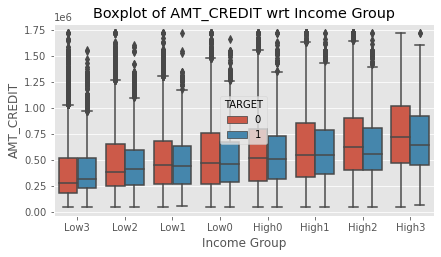

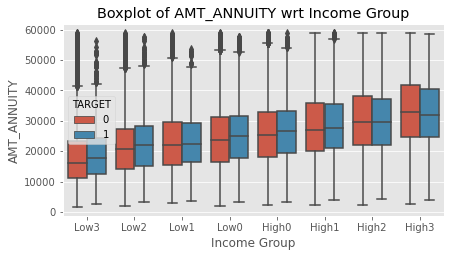

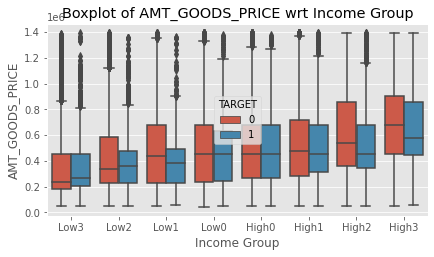

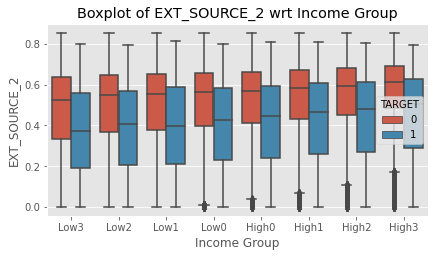

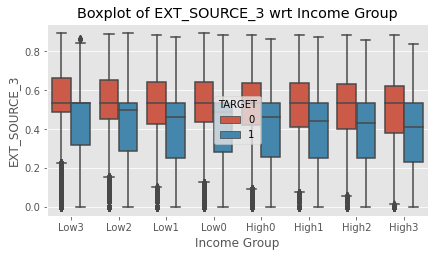

In [144]:
a=3
b=2
c=0
categories = ['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE','EXT_SOURCE_2','EXT_SOURCE_3']
for i in categories:
    c = c + 1
    fig = plt.figure(figsize=(15,12))
    plt.subplot(a, b, c)
    plt.title('Boxplot of {} wrt Income Group'.format(i))
    plt.xlabel(i)
    sns.boxplot(x='Income Group',y=i,data=app0,hue='TARGET')


plt.show()


### Inference:

We can see that the defaulters inspite of taking lesser credit and having to pay less amount of annuity for similar Income group range, they are struggling to pay back the loan on time.

## Plotting a box plot for 'AMT_INCOME_TOTAL' wrt 'AMT_CREDIT_RANGE' to understand why defaulters are struggling to pay back the loan.

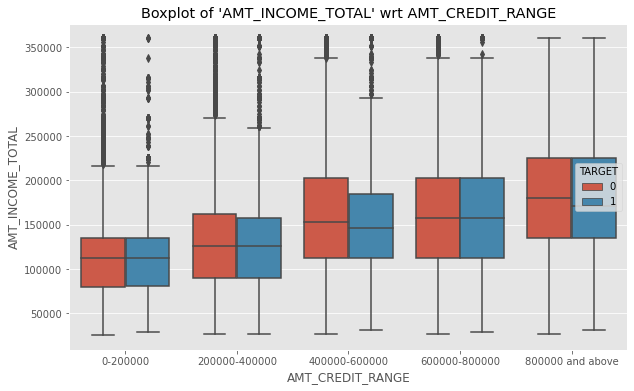

In [145]:
fig = plt.figure(figsize=(10,6))
plt.title("Boxplot of 'AMT_INCOME_TOTAL' wrt AMT_CREDIT_RANGE")
plt.xlabel(i)
sns.boxplot(x='AMT_CREDIT_RANGE',y='AMT_INCOME_TOTAL',data=app0,hue='TARGET')

    

plt.show()


### Inference:

From the above plot we can clearly understand that from the high defaulting range that is 200000-400000 and 400000-600000, the defaulters have less amount of income compared to non-defaulters and they have taken loans which are slightly above their range to pay it back on time. Therefore they are defaulting. To stop this we can increase the interest rates for people having lesser income but wanting higher credit. This way we can make sure that people who really believe they can pay on time will take the loan at those rates and also bank can minimize the loss in case of defaulting.

## Plotting Boxplot for Income Groups against other Numerical columns to understand the difference in Income between Men & Women Defaulters

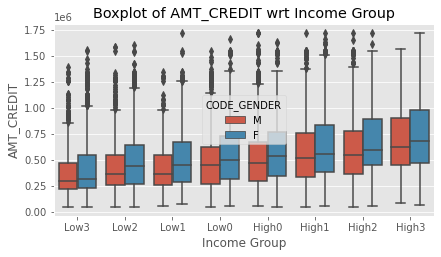

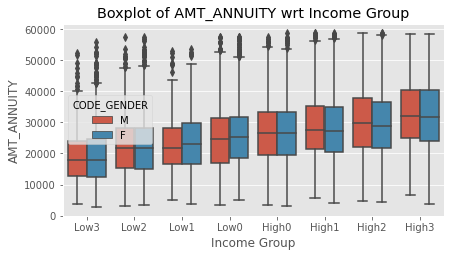

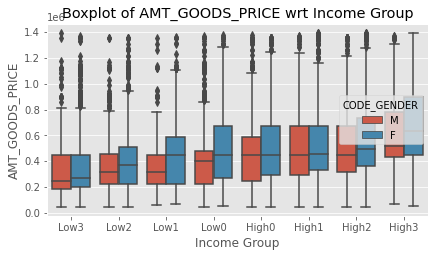

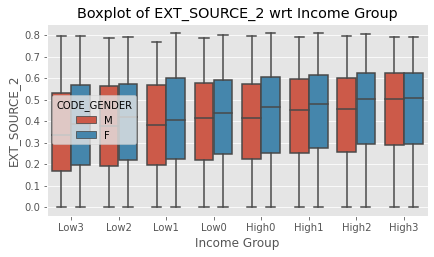

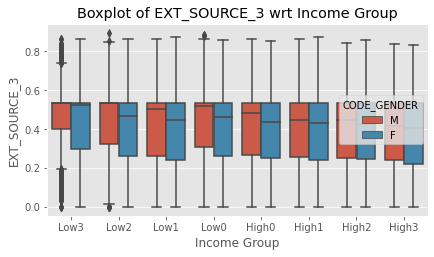

In [146]:
a=3
b=2
c=0
categories = ['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE','EXT_SOURCE_2','EXT_SOURCE_3']
for i in categories:
    c = c + 1
    fig = plt.figure(figsize=(15,12))
    plt.subplot(a, b, c)
    plt.title('Boxplot of {} wrt Income Group'.format(i))
    plt.xlabel(i)
    sns.boxplot(x='Income Group',y=i,data=df1,hue='CODE_GENDER')


### Inference:

From these plots we see that Men in spite of taking lower credit compared to women for same income range are struggling to pay back the loan on time.

## Plotting Heatmap to understand why Men are higher Defaulters than Women

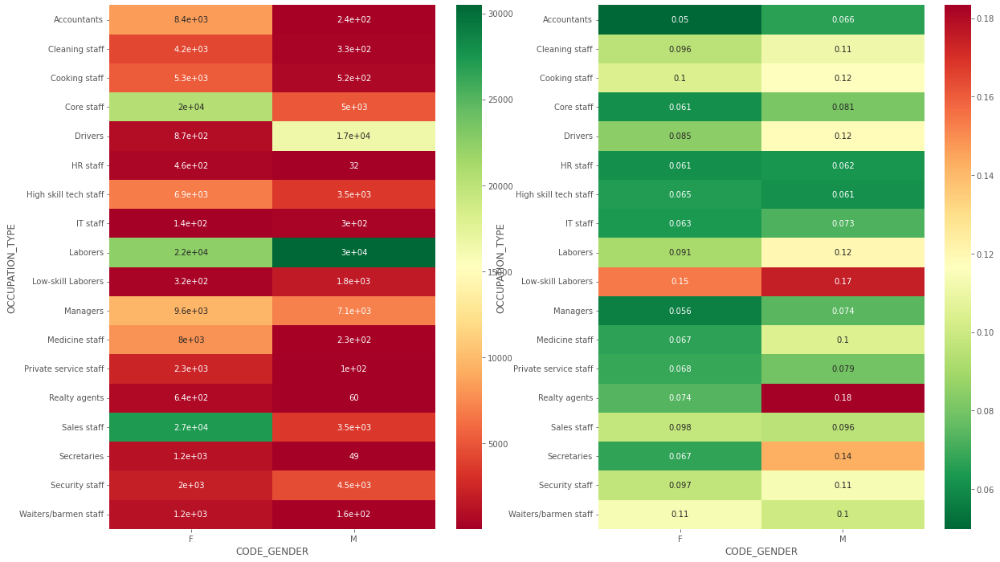

In [147]:
plt.figure(figsize=[20,12])
plt.subplot(1, 2, 1)
sns.heatmap(pd.pivot_table(data=app0[app0.OCCUPATION_TYPE!='Missing'],index='OCCUPATION_TYPE',columns='CODE_GENDER',values='TARGET',aggfunc='count'),annot=True,cmap='RdYlGn')
plt.subplot(1, 2, 2)
sns.heatmap(pd.pivot_table(data=app0[app0.OCCUPATION_TYPE!='Missing'],index='OCCUPATION_TYPE',columns='CODE_GENDER',values='TARGET',aggfunc='mean'),annot=True,cmap='RdYlGn_r')

plt.show()

### Inference:

1. As we can see here, there are more men in the job roles like "Laborers, Low-skill Laborers and Driver" categories compared to women. These categories make up the highest default making categories. Therefore, men have more default rates than women.
2. We also see that the count of women in high paying jobs like "Accountants, HR Staff, Managers, Medicine Staff" are higher than Men in these categories.
3. Most loans were provided to Men Laborers who are high defaulters. Thus, increasing the default rate for Men.
4. Banks need to be careful while providing loans to these high defaulting categories of people.

## Plotting Heatmap to find the relation between 'NAME_EDUCATION_TYPE' vs 'CODE_GENDER' vs 'TARGET'

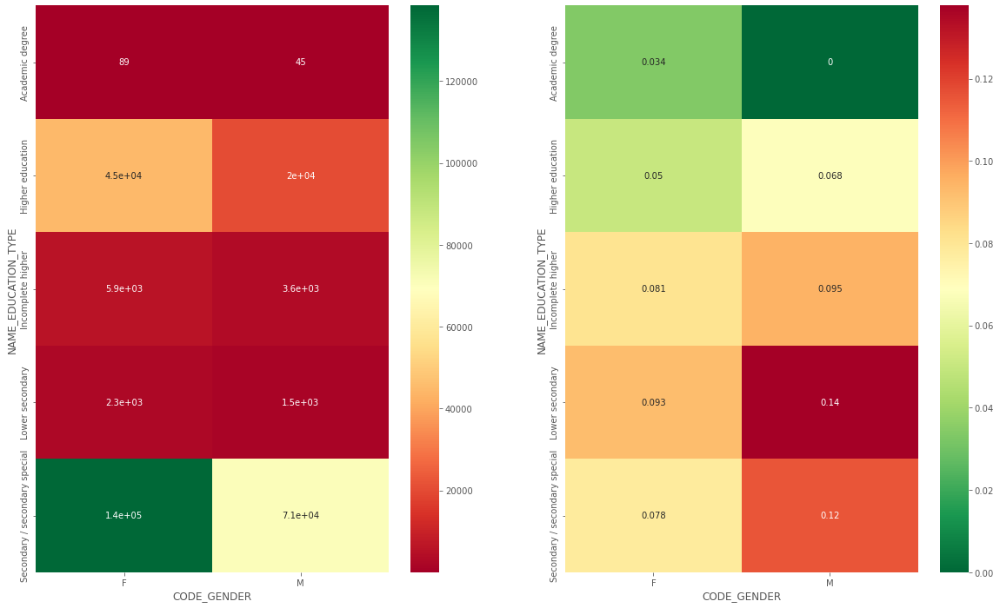

In [148]:
plt.figure(figsize=[20,12])
plt.subplot(1, 2, 1)
sns.heatmap(pd.pivot_table(data=app0,index='NAME_EDUCATION_TYPE',columns='CODE_GENDER',values='TARGET',aggfunc='count'),annot=True,cmap='RdYlGn')
plt.subplot(1, 2, 2)
sns.heatmap(pd.pivot_table(data=app0,index='NAME_EDUCATION_TYPE',columns='CODE_GENDER',values='TARGET',aggfunc='mean'),annot=True,cmap='RdYlGn_r')

plt.show()

### Inference:

1. From the above heatmap, we understand that the Women are comparatively more educated than Men. Therefore we see more Women working in jobs that require high amount of education.
2. We also see that people who are well educated tend to default less than people who are not very well educated.

## Plotting Heatmap to find the relation between Categorical columns vs 'Income Group' vs 'TARGET'

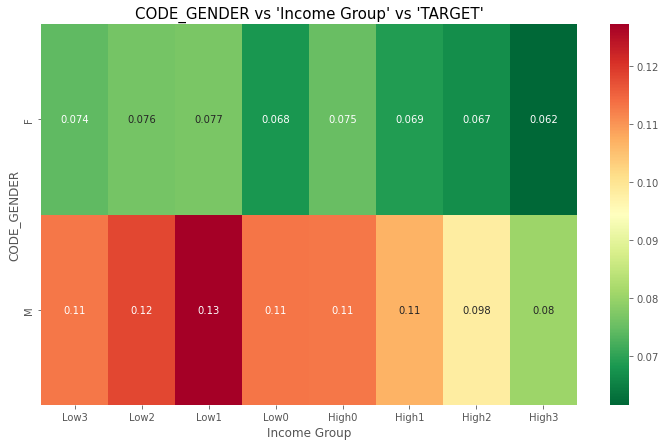

-----------------------------------------------------------------------------------------------------------------------------


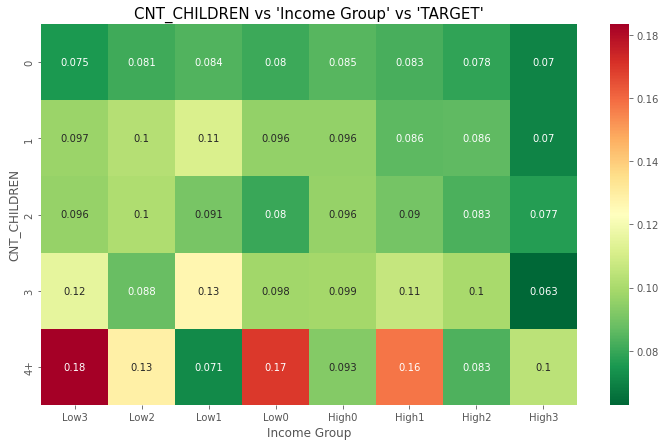

-----------------------------------------------------------------------------------------------------------------------------


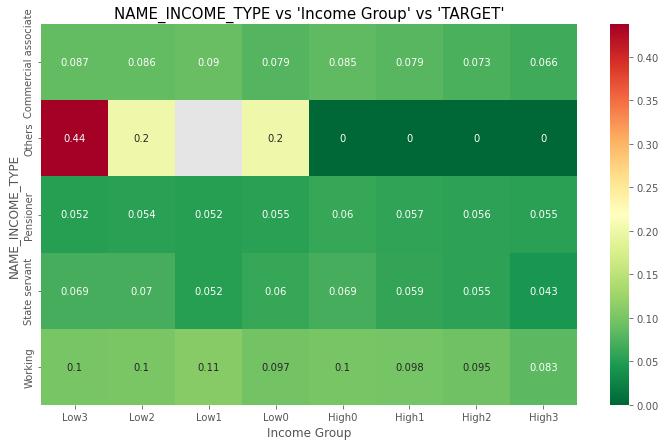

-----------------------------------------------------------------------------------------------------------------------------


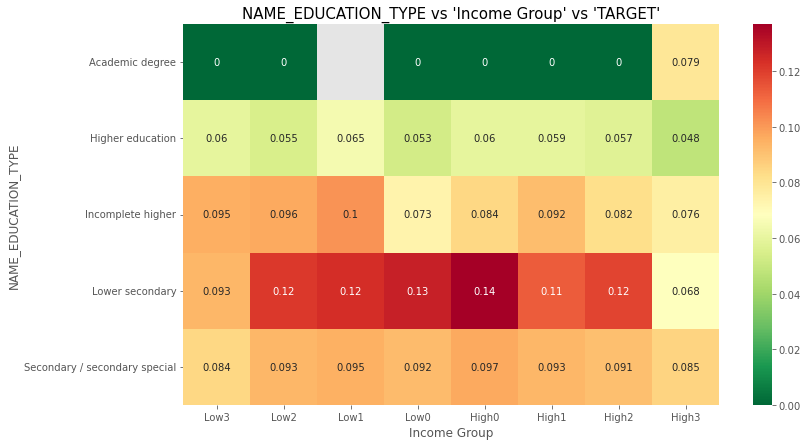

-----------------------------------------------------------------------------------------------------------------------------


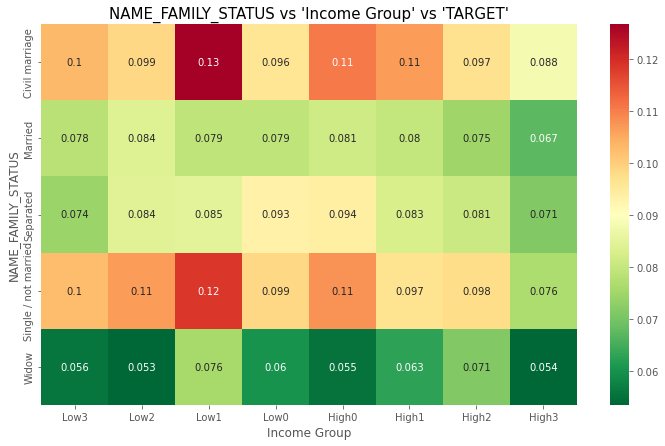

-----------------------------------------------------------------------------------------------------------------------------


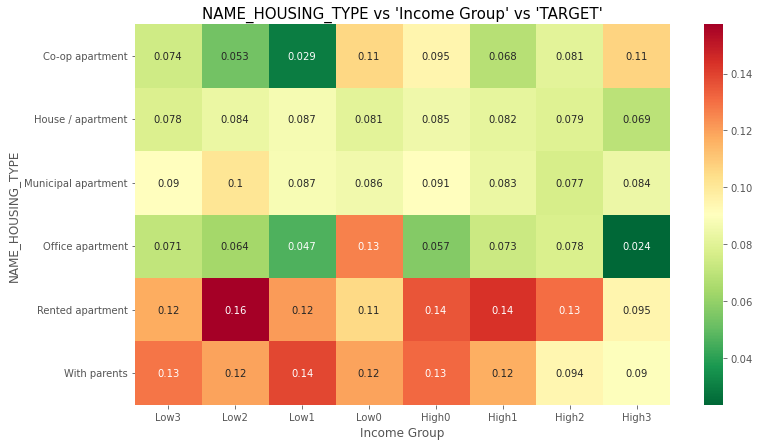

-----------------------------------------------------------------------------------------------------------------------------


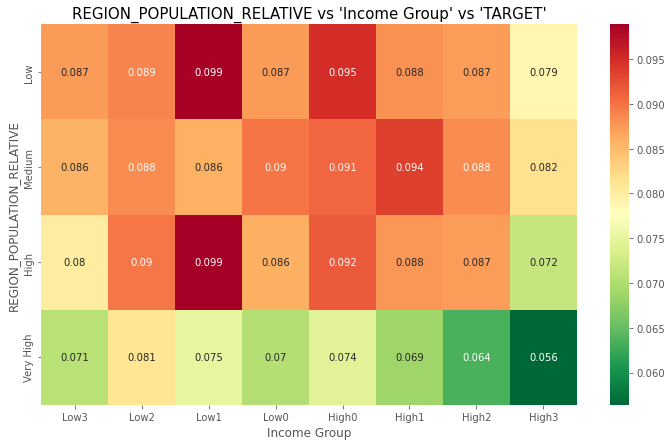

-----------------------------------------------------------------------------------------------------------------------------


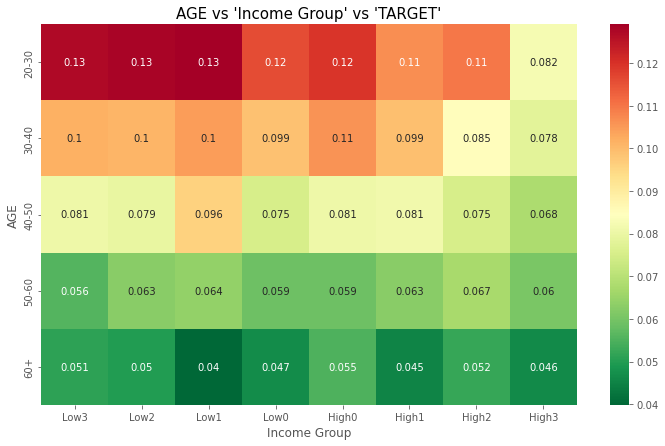

-----------------------------------------------------------------------------------------------------------------------------


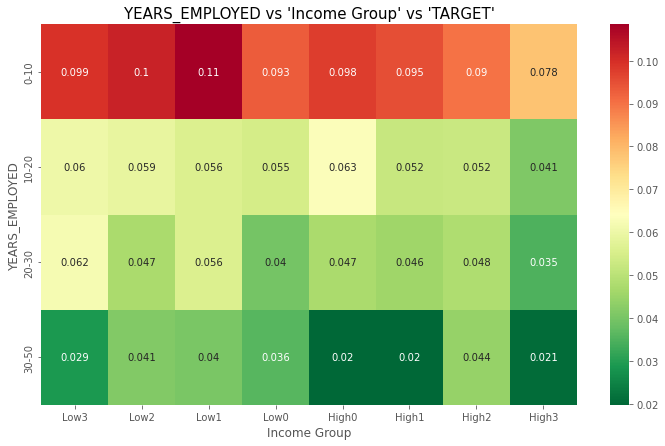

-----------------------------------------------------------------------------------------------------------------------------


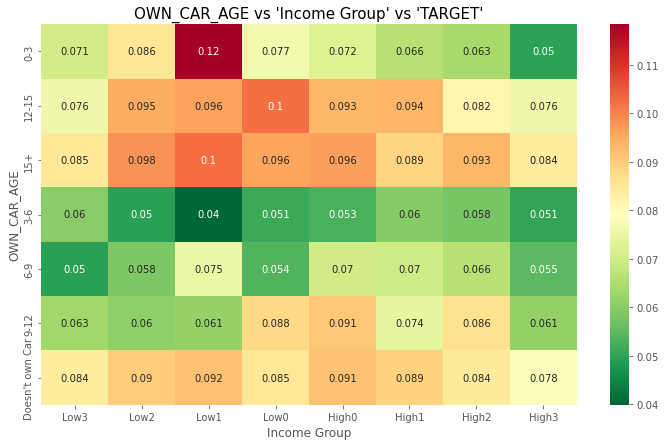

-----------------------------------------------------------------------------------------------------------------------------


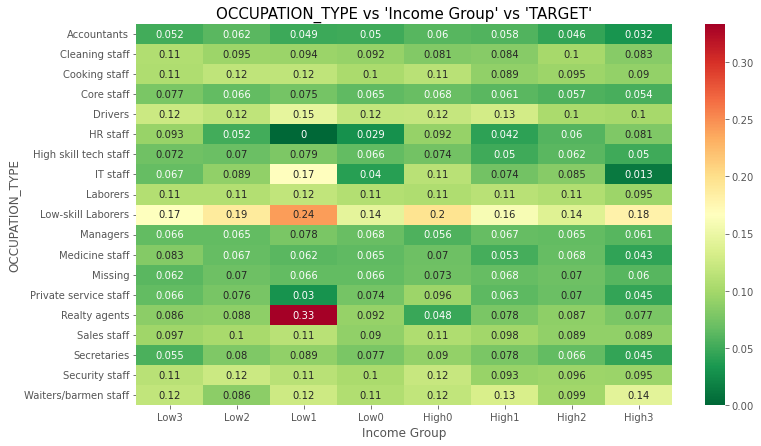

-----------------------------------------------------------------------------------------------------------------------------


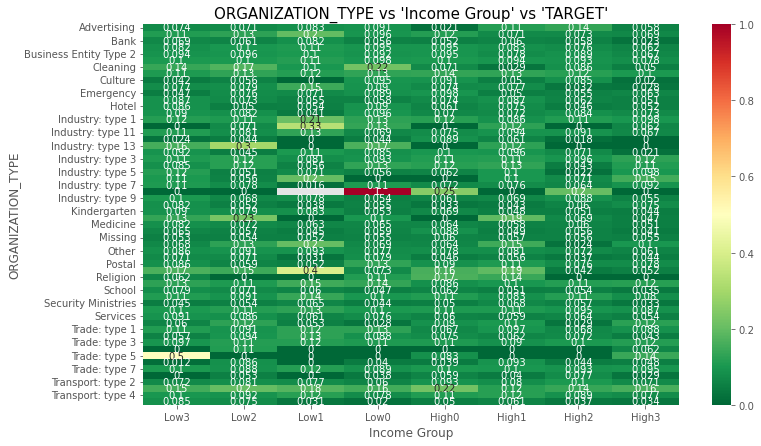

-----------------------------------------------------------------------------------------------------------------------------


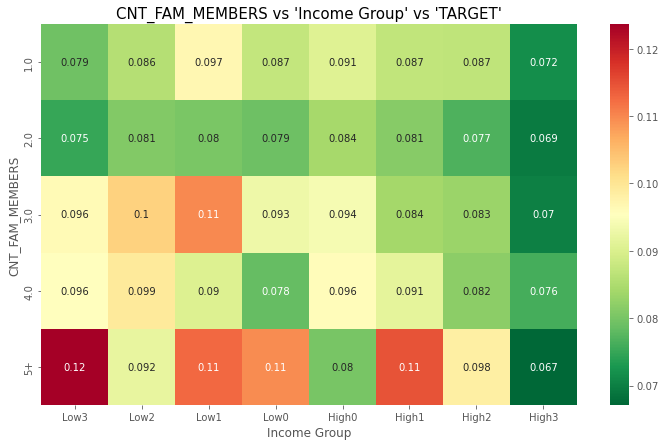

-----------------------------------------------------------------------------------------------------------------------------


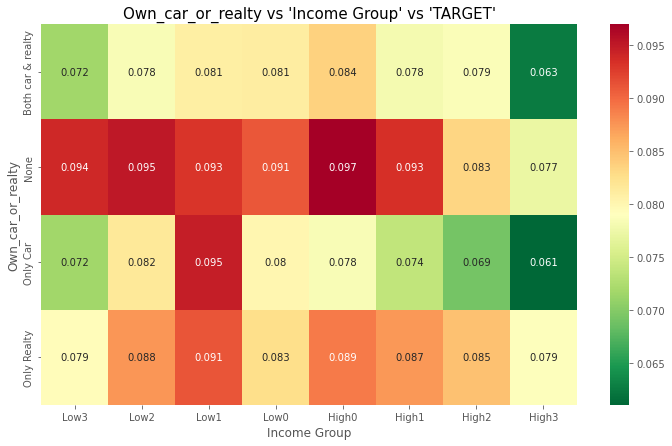

-----------------------------------------------------------------------------------------------------------------------------


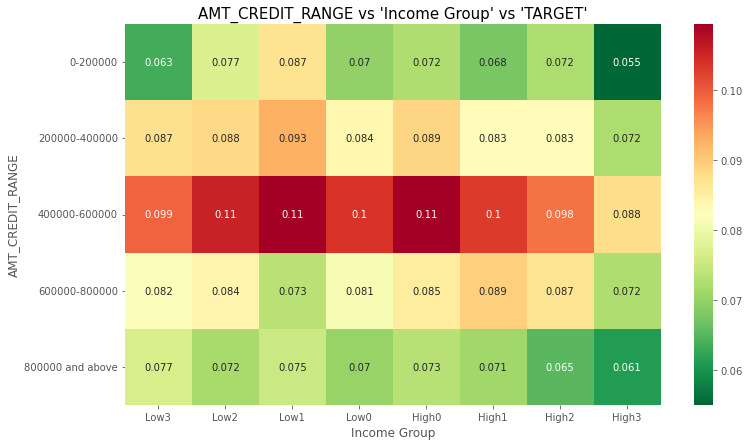

-----------------------------------------------------------------------------------------------------------------------------


In [149]:
cate = ['CODE_GENDER','CNT_CHILDREN','NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS','NAME_HOUSING_TYPE',
        'REGION_POPULATION_RELATIVE','AGE','YEARS_EMPLOYED','OWN_CAR_AGE','OCCUPATION_TYPE','ORGANIZATION_TYPE',
        'CNT_FAM_MEMBERS','Own_car_or_realty','AMT_CREDIT_RANGE']

for i in cate:
    plt.figure(figsize=[12,7])
    plt.title("{} vs 'Income Group' vs 'TARGET'".format(i), fontdict={'fontsize':15})
    sns.heatmap(pd.pivot_table(data=app0,index=i,columns='Income Group',values='TARGET',aggfunc='mean'),annot=True,cmap='RdYlGn_r')

    plt.show()
    print('-----------------------------------------------------------------------------------------------------------------------------')


### Inference:

1. From heatmap of CODE_GENDER, we observe Men are high defaulters inspite of having income upto the range High1
2. From heatmap of CNT_CHILDREN, we observe that as the number of children increase, the rate of defauting also increases.
3. From heatmap of NAME_INCOME_TYPE, we learn that category of Others have less income and are high defaulters.
4. From heatmap of NAME_EDUCATION_TYPE, we observe that People with lower education inspite of earning well tend to default.
5. From heatmap of NAME_FAMILY_STATUS, we can see that Widow are the safest category to provide loans as the rate of default is very less even for people having low income. Also people belonging to the category of Civil marriage and Single are high defaulters.
6. From heatmap of NAME_HOUSING_TYPE, we see that people who live with their parents and living in Rented apartment have high default rates.
7. From heatmap of REGION_POPULATION_RELATIVE, we observe that default rate decreases with increase in population of city. Therefore they are inversely proportional.
8. From heatmap of AGE, we can see that people ranging from 20-40 have higher rate of default. Whereas people who are above 50 are the best range of people to provide loans as their rate of default is very low.
9. From heatmap of YEARS_EMPLOYED, similar to AGE people with less experience tend to default more than people with higher experience.
10. From heatmap of OWN_CAR_AGE, we observe that people who have very old cars, that is above 12 years of age and have income in the range of low2 to high2 default a lot compared to others.
11. From heatmap of OCCUPATION_TYPE, we see that Low-Skill laborers are high defaulters. This is true to people who are earning very well as well. People with high paying jobs that have high education requirements tend to default very less.
12. From heatmap of CNT_FAM_MEMBERS, we see that people with family of more than or equal to 3 and salary less that Low0 tend to default a lot. So, it is better to provide loans to people less than 3 members in their family and for people who have 3 or more members but with Income greater than High1. 
13. From heatmap of Own_car_or_realty, we see that people with No car or Realty and Only realty tend to have higher defaulting rates.

### Plotting Heatmap to find the relation between 'Own_car_or_realty' vs 'YEARS_EMPLOYED' vs 'TARGET'

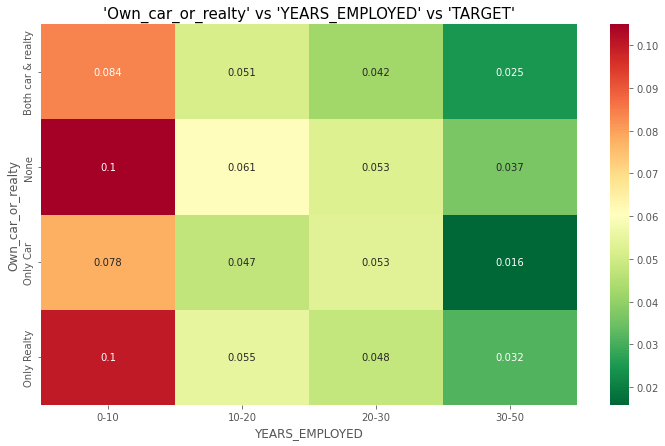

In [150]:
plt.figure(figsize=[12,7])
sns.heatmap(pd.pivot_table(data=app0,index='Own_car_or_realty',columns='YEARS_EMPLOYED',values='TARGET',aggfunc='mean'),annot=True,cmap='RdYlGn_r')
plt.title("'Own_car_or_realty' vs 'YEARS_EMPLOYED' vs 'TARGET'", fontdict={'fontsize':15})

plt.show()

### Inference:

People with less that 10 years of experience and not owning any car or realty or owning only realty have highest defaulting rate. Whereas people with more than 30 years of experience and owning only car have the least defaulting rate. 

## Plotting Heatmap to find the relation between ['OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE'] vs 'Income Group' vs 'TARGET'

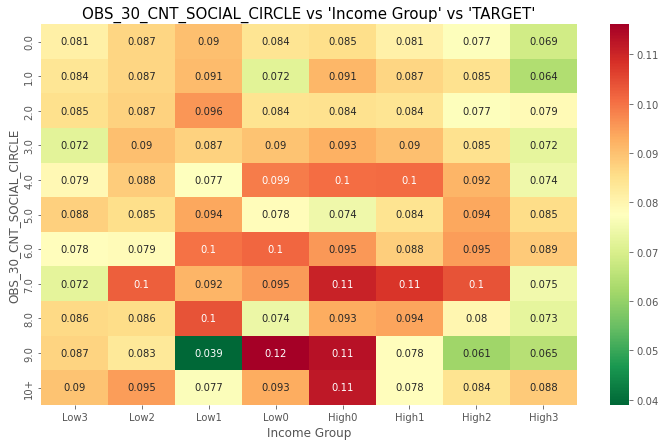

------------------------------------------------------------------------------------------------------------------


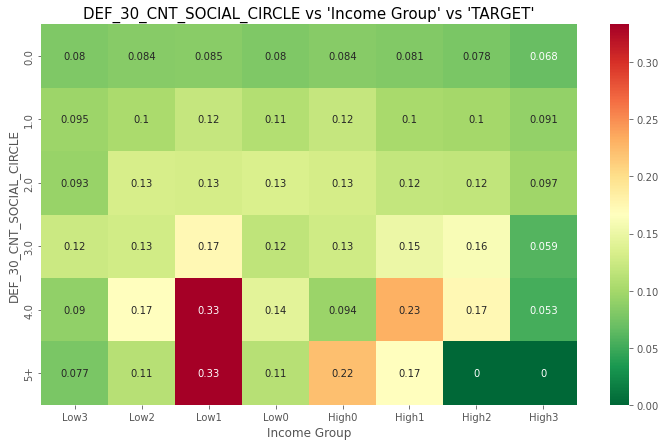

------------------------------------------------------------------------------------------------------------------


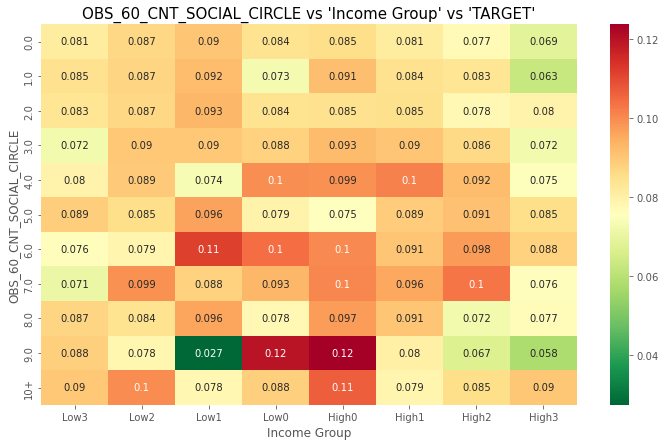

------------------------------------------------------------------------------------------------------------------


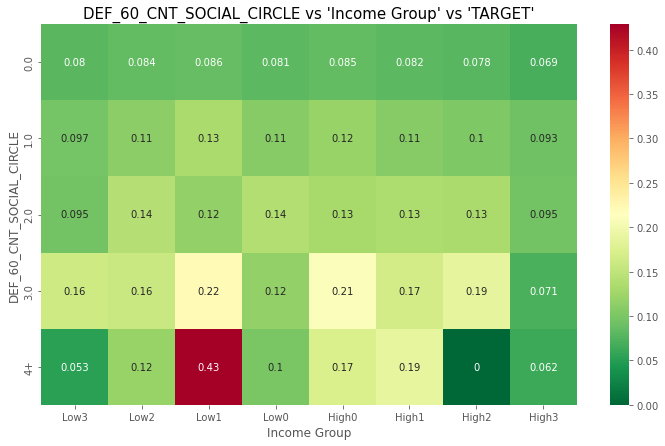

------------------------------------------------------------------------------------------------------------------


In [151]:
obs = ['OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE']

for i in obs:
    plt.figure(figsize=[12,7])
    sns.heatmap(pd.pivot_table(data=app0,index=i,columns='Income Group',values='TARGET',aggfunc='mean'),annot=True,cmap='RdYlGn_r')
    plt.title("{} vs 'Income Group' vs 'TARGET'".format(i), fontdict={'fontsize':15})
    

    plt.show()
    print('------------------------------------------------------------------------------------------------------------------')

### Inference:

'DEF_30_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE' and indicate that higher the number more the defaulting percentage for people earning in the range of Low1. Apart from this nothing can be inferenced from the plots. So, we can drop these columns if required. 

## Plotting Heatmap to find the relation between Categorical columns vs 'AMT_CREDIT_RANGE' vs 'TARGET'

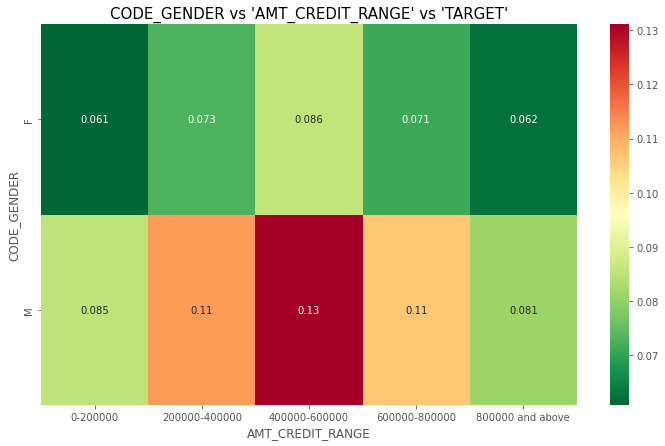

-----------------------------------------------------------------------------------------------------------------------------


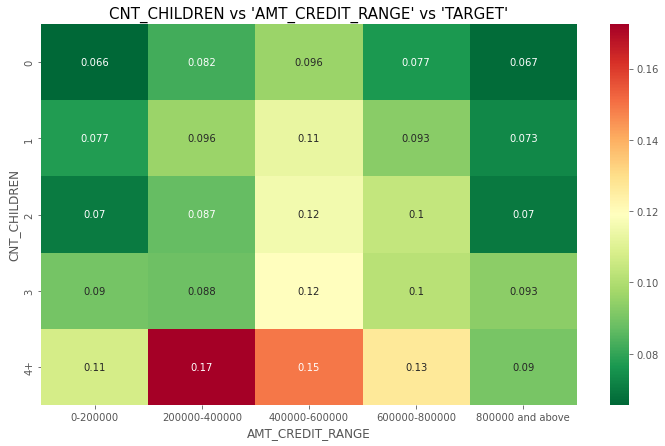

-----------------------------------------------------------------------------------------------------------------------------


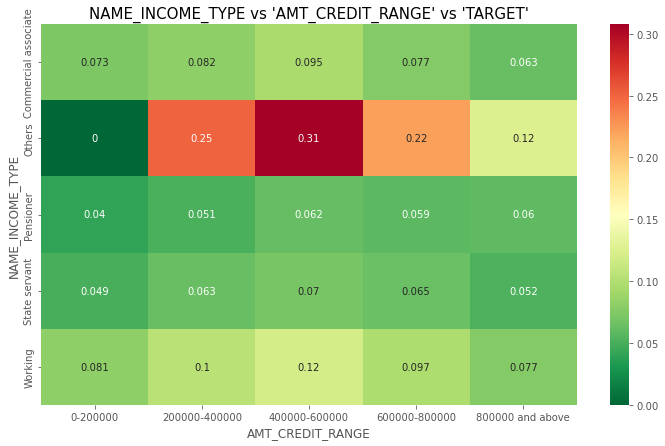

-----------------------------------------------------------------------------------------------------------------------------


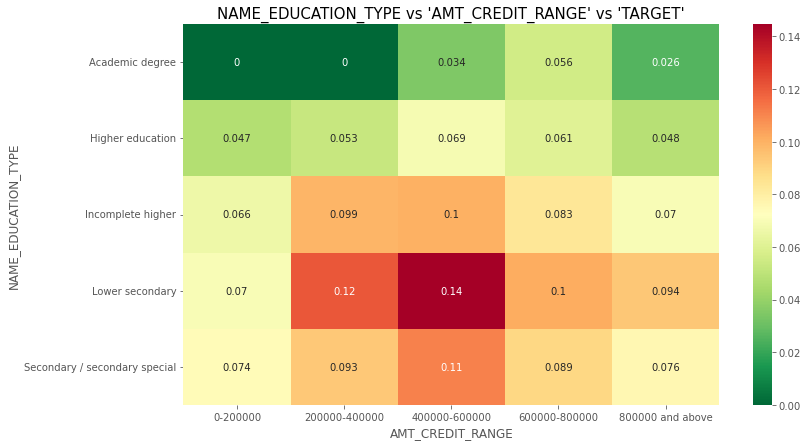

-----------------------------------------------------------------------------------------------------------------------------


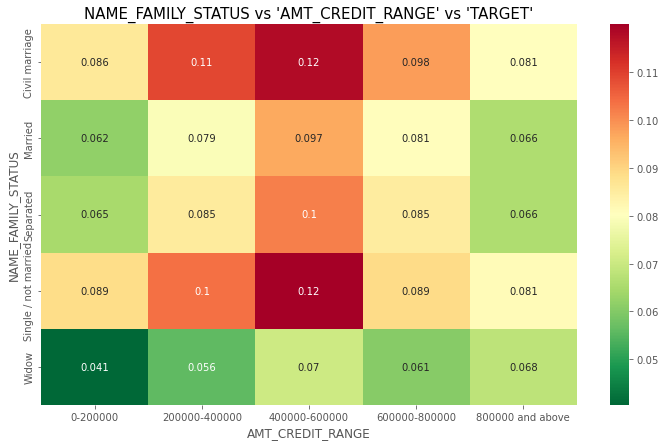

-----------------------------------------------------------------------------------------------------------------------------


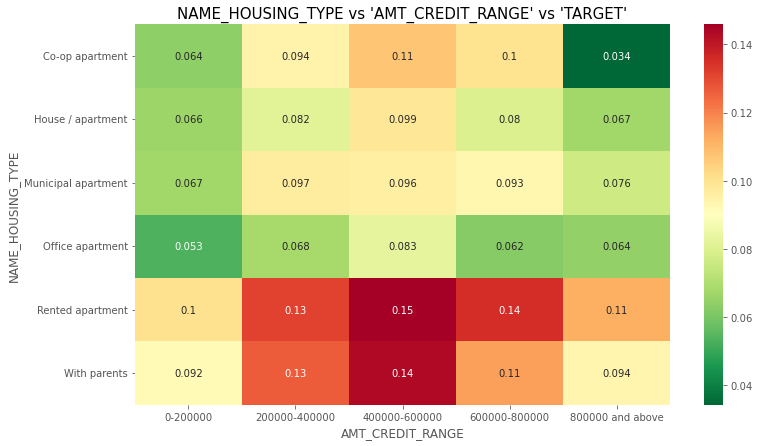

-----------------------------------------------------------------------------------------------------------------------------


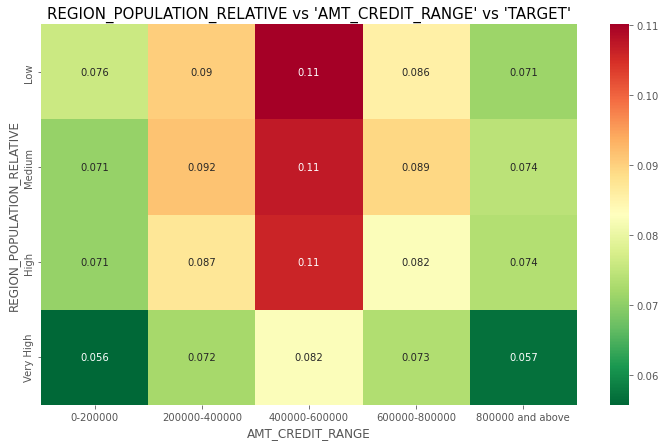

-----------------------------------------------------------------------------------------------------------------------------


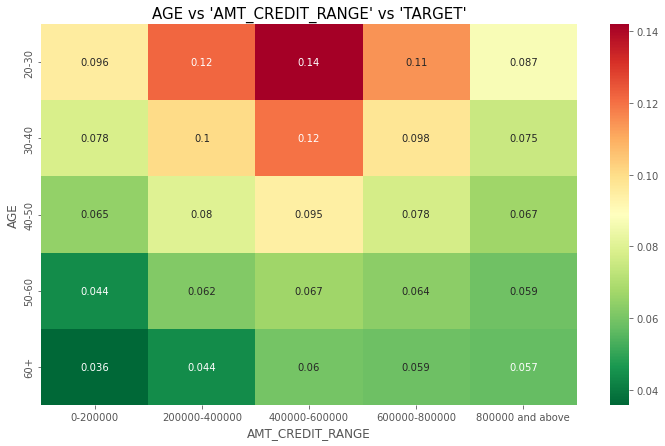

-----------------------------------------------------------------------------------------------------------------------------


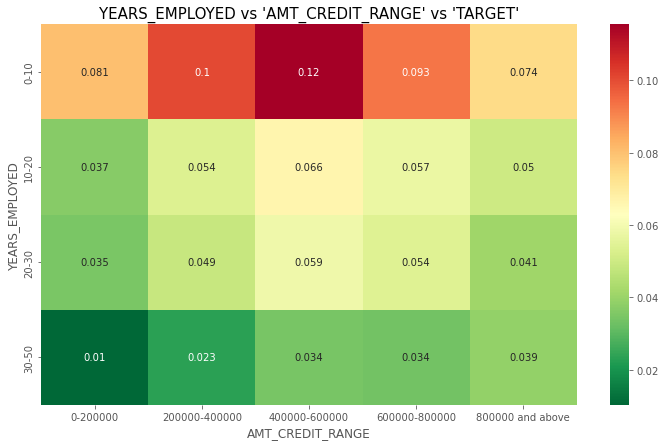

-----------------------------------------------------------------------------------------------------------------------------


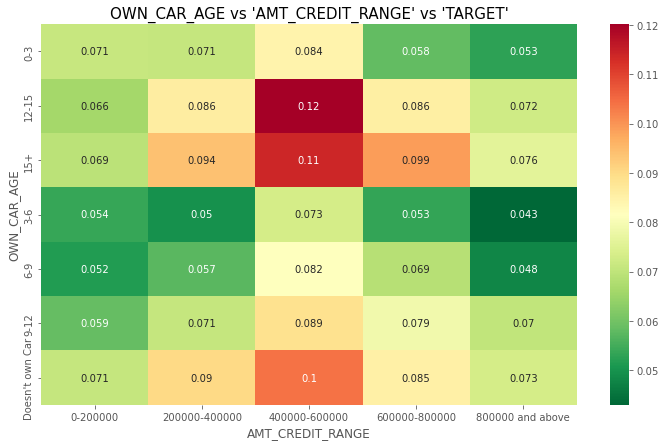

-----------------------------------------------------------------------------------------------------------------------------


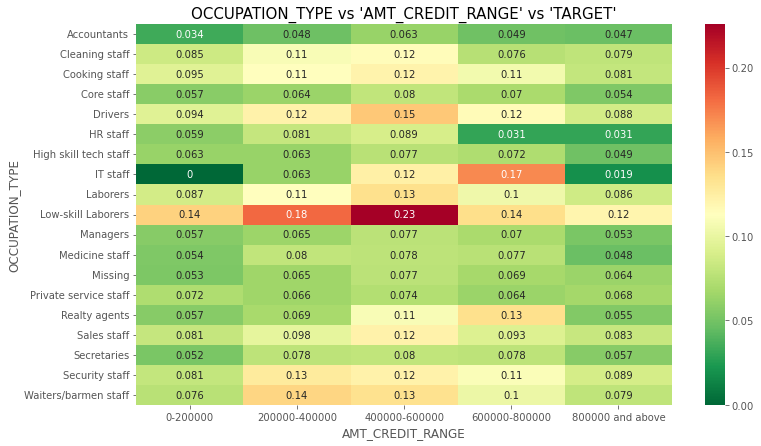

-----------------------------------------------------------------------------------------------------------------------------


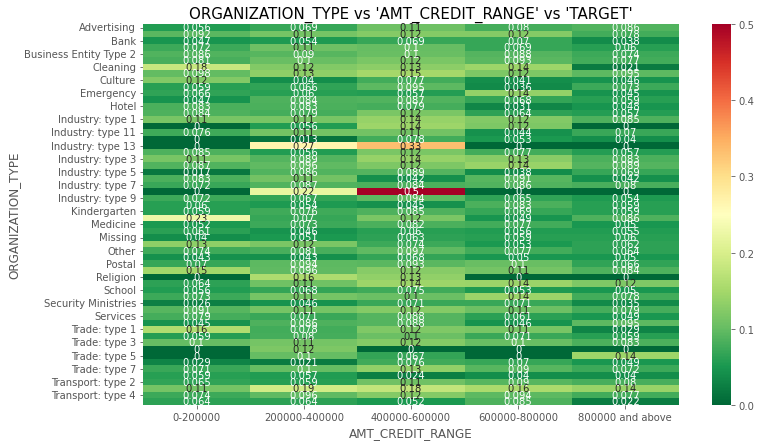

-----------------------------------------------------------------------------------------------------------------------------


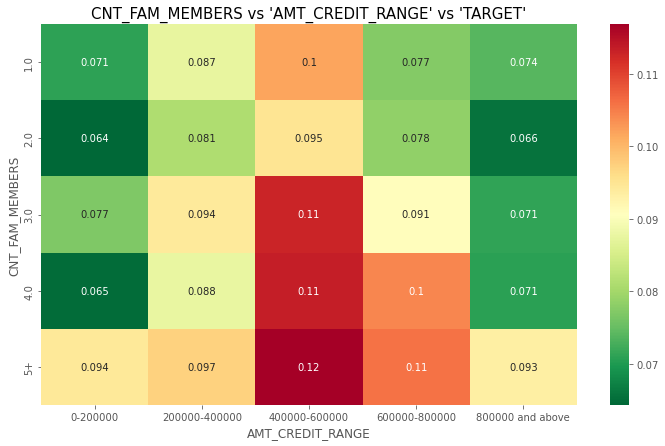

-----------------------------------------------------------------------------------------------------------------------------


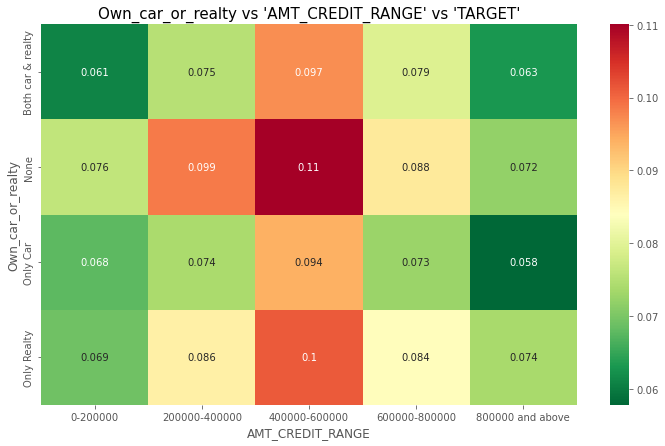

-----------------------------------------------------------------------------------------------------------------------------


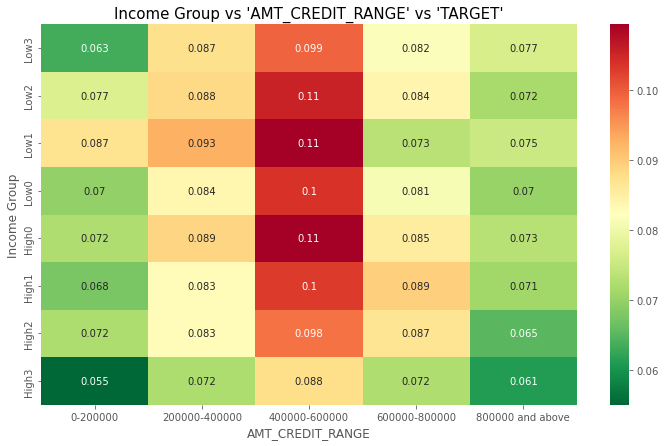

-----------------------------------------------------------------------------------------------------------------------------


In [152]:
cate = ['CODE_GENDER','CNT_CHILDREN','NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS','NAME_HOUSING_TYPE',
        'REGION_POPULATION_RELATIVE','AGE','YEARS_EMPLOYED','OWN_CAR_AGE','OCCUPATION_TYPE','ORGANIZATION_TYPE',
        'CNT_FAM_MEMBERS','Own_car_or_realty','Income Group']

for i in cate:
    plt.figure(figsize=[12,7])
    plt.title("{} vs 'AMT_CREDIT_RANGE' vs 'TARGET'".format(i), fontdict={'fontsize':15})
    sns.heatmap(pd.pivot_table(data=app0,index=i,columns='AMT_CREDIT_RANGE',values='TARGET',aggfunc='mean'),annot=True,cmap='RdYlGn_r')

    plt.show()
    print('-----------------------------------------------------------------------------------------------------------------------------')


## Checking out the Previous Application Dataset

In [153]:
prev0.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [154]:
#Checking the shape of the datatset
prev0.shape

(1670214, 37)

In [155]:
#Using info() to see what datatype of data is present in the columns
prev0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [156]:
#Checking number of Null values
prev0.isnull().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [157]:
#Checking the percentage of Null values
prev0.isnull().sum()*100/prev0.shape[0]

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_DOWN_PAYMENT               53.636480
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
RATE_DOWN_PAYMENT              53.636480
RATE_INTEREST_PRIMARY          99.643698
RATE_INTEREST_PRIVILEGED       99.643698
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYP

In [158]:
prev0.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

## Looking at unique values and their counts in the Categorical columns

In [159]:
cat_col = ['NAME_CONTRACT_TYPE','NAME_PAYMENT_TYPE','NAME_CASH_LOAN_PURPOSE','NAME_CONTRACT_STATUS',
       'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE','NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
           'CHANNEL_TYPE','NAME_SELLER_INDUSTRY','NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']
for i in cat_col:
    print(prev0[i].value_counts())
    print('------------------------------------------------------------------------------------------------')

Cash loans         747553
Consumer loans     729151
Revolving loans    193164
XNA                   346
Name: NAME_CONTRACT_TYPE, dtype: int64
------------------------------------------------------------------------------------------------
Cash through the bank                        1033552
XNA                                           627384
Non-cash from your account                      8193
Cashless from the account of the employer       1085
Name: NAME_PAYMENT_TYPE, dtype: int64
------------------------------------------------------------------------------------------------
XAP                                 922661
XNA                                 677918
Repairs                              23765
Other                                15608
Urgent needs                          8412
Buying a used car                     2888
Building a house or an annex          2693
Everyday expenses                     2416
Medicine                              2174
Payments on other loans   

##### We see that there are huge amount of XAP or XAN in these columns.

### Replacing XAP and XNA with np.nan and storing this to new variable 

##### Not dropping the rows that have XAP and XNA because they formulate a huge amount of rows. Dropping them, we will loose more than 96% of rows. Therefore by coverting it to np.nan we don't loose the available data and it won't aaffect analysis done on the columns.

In [160]:
#Storing the orginal dataset to another variable, so we do not loose the original one.
prev1 = prev0
#Replacing XAP & XAN in all categorical columns.
cat_col = ['NAME_CONTRACT_TYPE','NAME_PAYMENT_TYPE','NAME_CASH_LOAN_PURPOSE','NAME_CONTRACT_STATUS',
       'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE','NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
            'CHANNEL_TYPE','NAME_SELLER_INDUSTRY','NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']
for i in cat_col:
    prev1[i] = prev1[i].apply(lambda x: np.nan if x in ['XAP','XNA'] else x )

## Categorical Univariate Analysis

#### Creating a function to plot countplot and bar chart of the distribution of different categories in the Categorical columns of the dataset

In [161]:
def fin_cat_uni_analysis(x):
    print('Categorical Univariate Analysis of {}'.format(x))
    
    plt.figure(figsize=[15,5])
    plt.subplot(1,2,1)
    plots = sns.countplot(prev0[x],order = prev0[x].value_counts().index)
    plt.xticks(rotation = 90)
    plt.title('Count of {}'.format(x), fontdict={'fontsize':15})
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')
    
    plt.subplot(1,2,2)
    plt.title('% distribution of {}'.format(x), fontdict={'fontsize':18})
    plt.xlabel(x)
    plt.ylabel('Percentage')
    plots = (prev0[x].value_counts()*100/len(prev0[prev0[x]!=np.nan])).plot.bar()
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')
    
    plt.show()
    print('---------------------------------------------------------------------------------------------------------------------')

#### Applying  the created function to the Categorical columns

Categorical Univariate Analysis of NAME_CONTRACT_TYPE


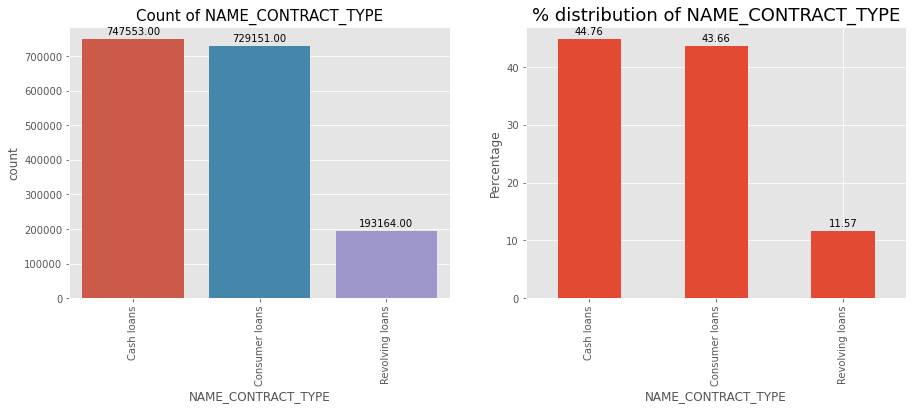

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_PAYMENT_TYPE


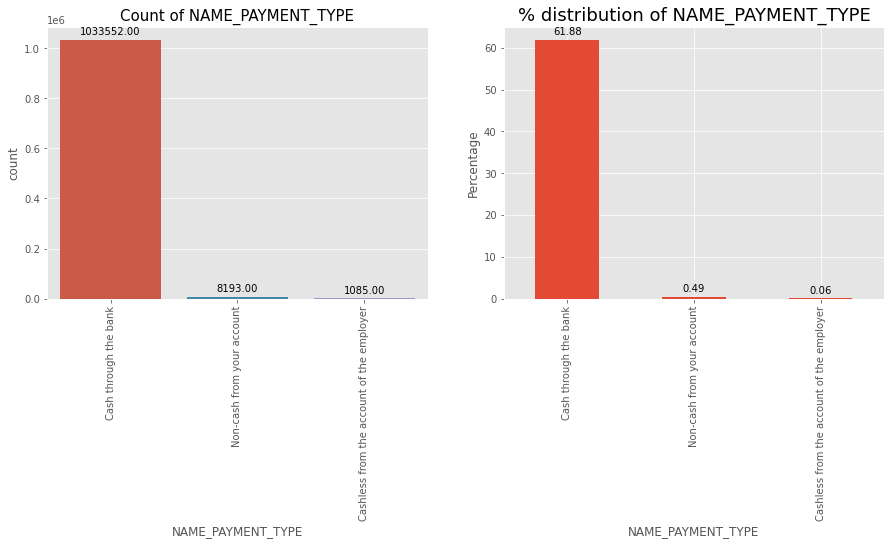

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_CASH_LOAN_PURPOSE


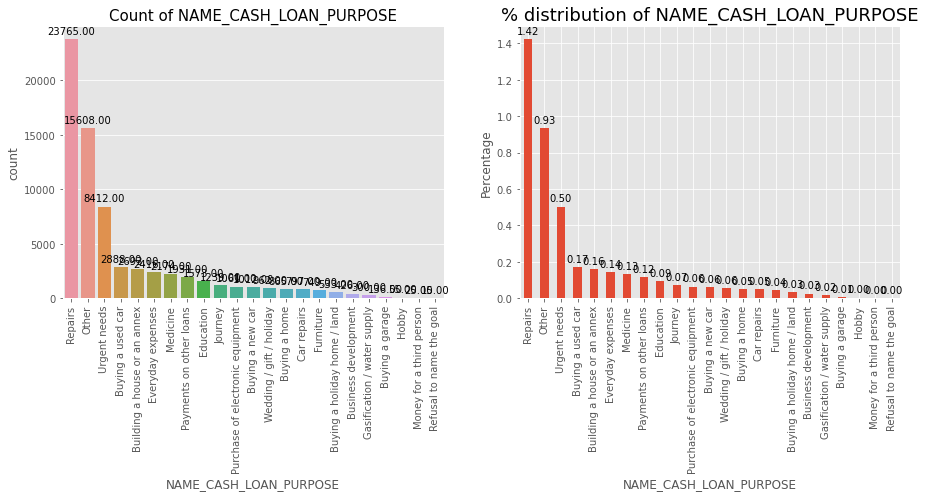

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_CONTRACT_STATUS


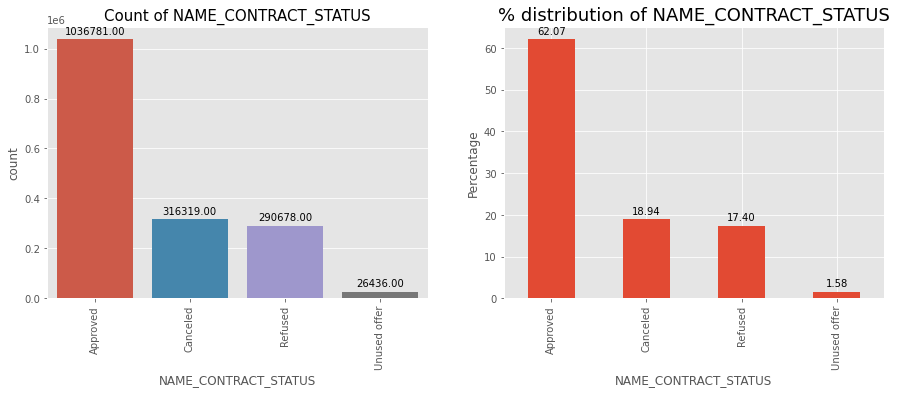

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of CODE_REJECT_REASON


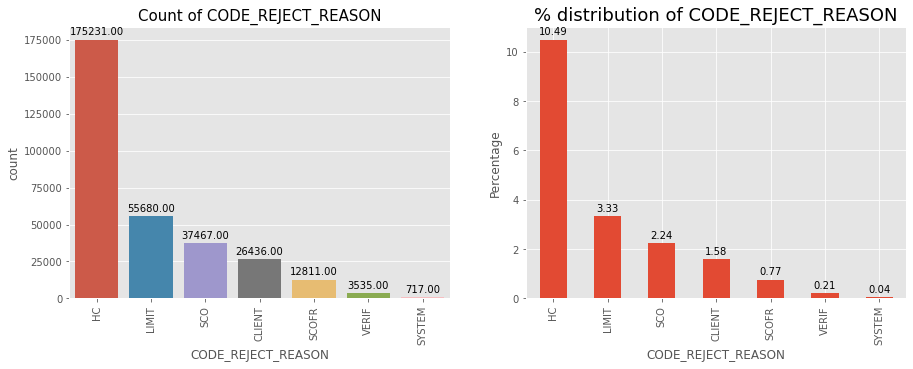

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_CLIENT_TYPE


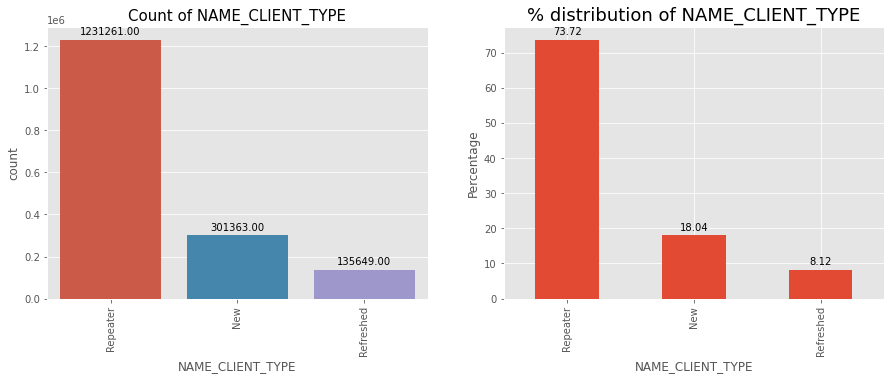

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_GOODS_CATEGORY


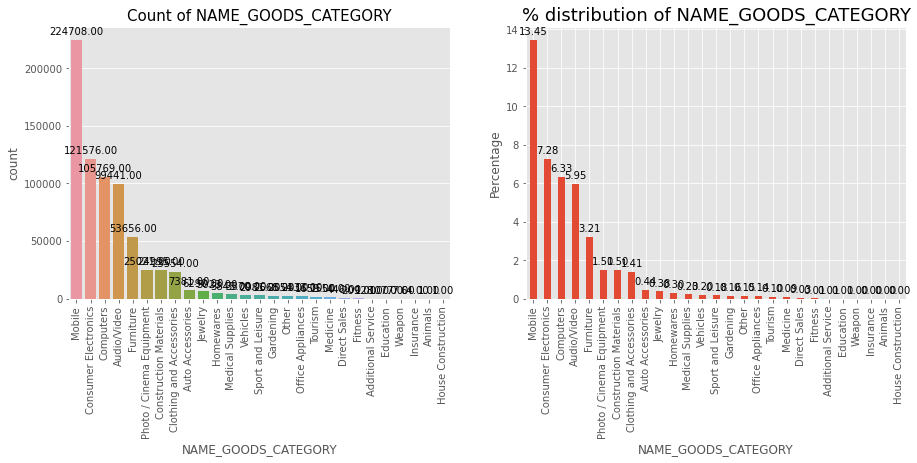

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_PORTFOLIO


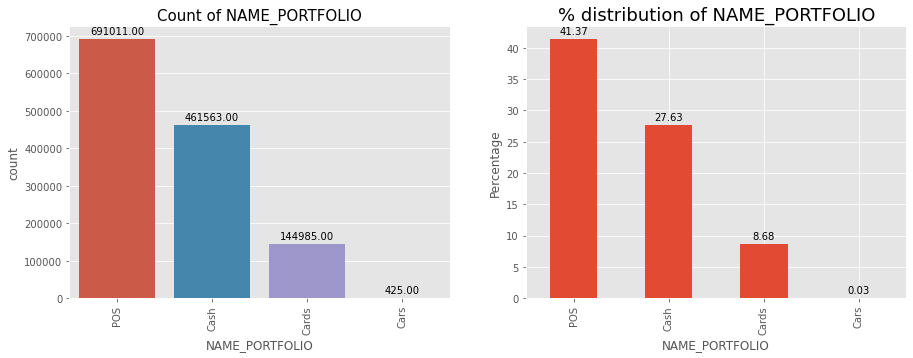

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_PRODUCT_TYPE


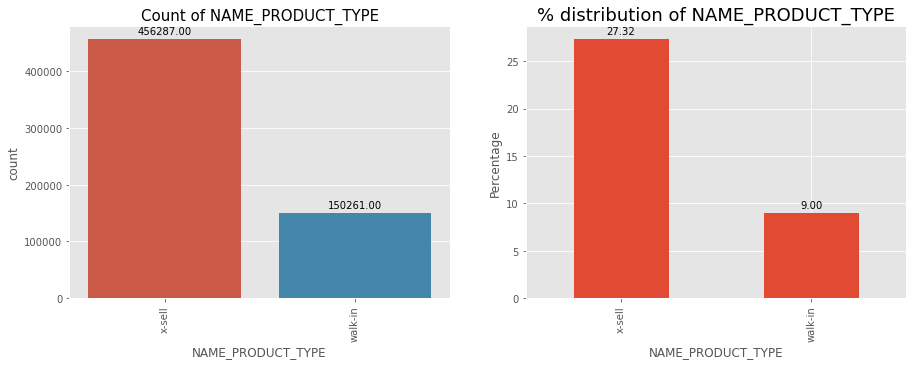

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of CHANNEL_TYPE


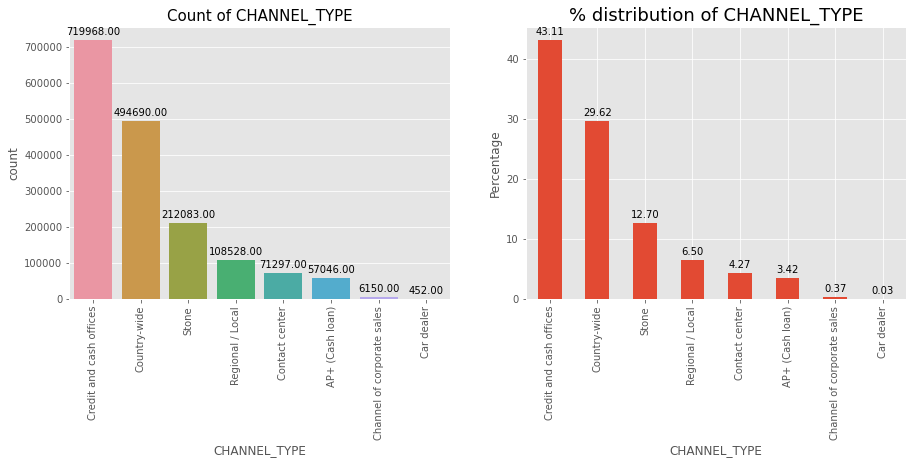

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_SELLER_INDUSTRY


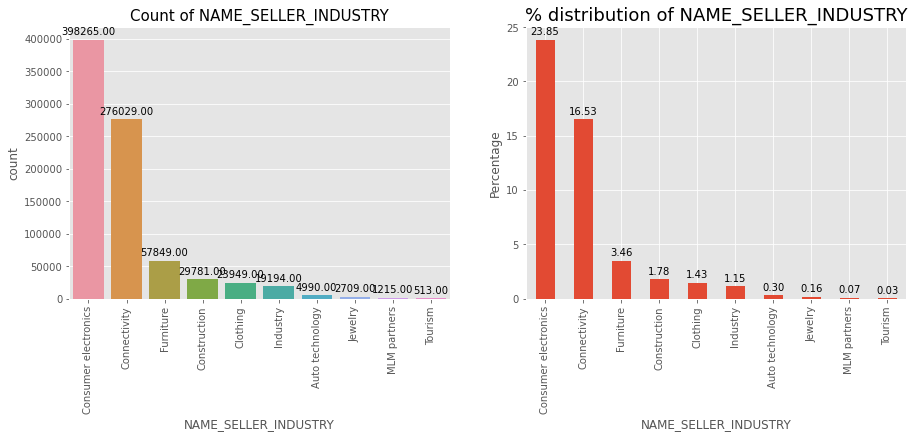

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of NAME_YIELD_GROUP


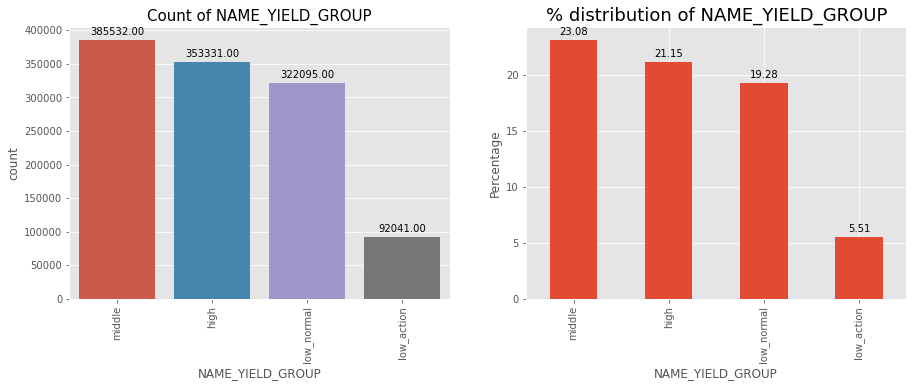

---------------------------------------------------------------------------------------------------------------------
Categorical Univariate Analysis of PRODUCT_COMBINATION


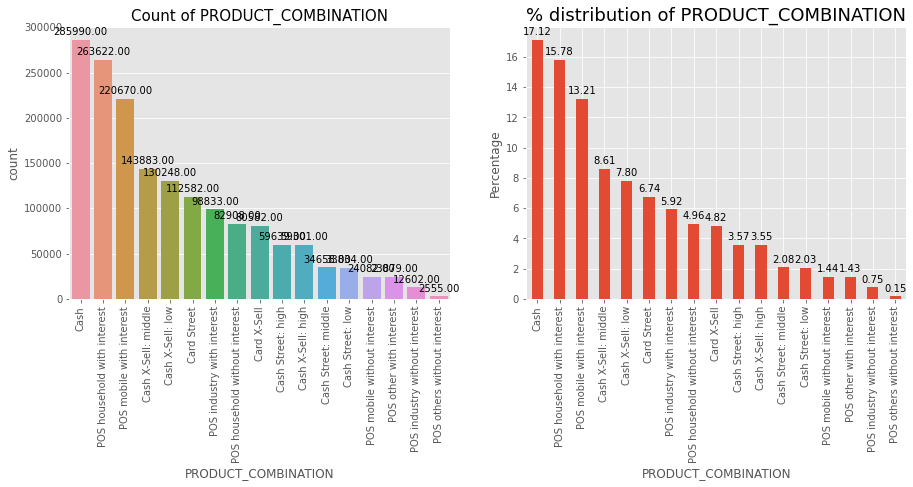

---------------------------------------------------------------------------------------------------------------------


In [162]:
cat_col = ['NAME_CONTRACT_TYPE','NAME_PAYMENT_TYPE','NAME_CASH_LOAN_PURPOSE','NAME_CONTRACT_STATUS',
       'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE','CHANNEL_TYPE','NAME_SELLER_INDUSTRY','NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']
for i in cat_col:
    fin_cat_uni_analysis(i)

## Univariate Analysis of Numerical Columns:

#### Creating a function to do Univariate analysis for Numerical columns

In [163]:
def prev_seg_num_uni_analysis(x):
    print('Numerical Univariate Analysis {}'.format(x))
    print(prev0[x].describe())
    print('')
    
    plt.figure(figsize=[10,5])
    sns.distplot(prev0[x],hist=False)
    plt.title('Distplot of {}:'.format(x),fontdict={'fontsize':18})

    
    plt.show()
    print('----------------------------------------------------------------------------------------------------------------------')


#### Applying the function to do Numerical Columns

Numerical Univariate Analysis AMT_ANNUITY
count    1.297979e+06
mean     1.595512e+04
std      1.478214e+04
min      0.000000e+00
25%      6.321780e+03
50%      1.125000e+04
75%      2.065842e+04
max      4.180581e+05
Name: AMT_ANNUITY, dtype: float64



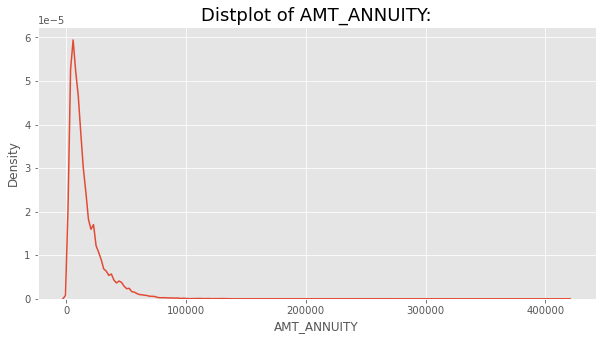

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis AMT_APPLICATION
count    1.670214e+06
mean     1.752339e+05
std      2.927798e+05
min      0.000000e+00
25%      1.872000e+04
50%      7.104600e+04
75%      1.803600e+05
max      6.905160e+06
Name: AMT_APPLICATION, dtype: float64



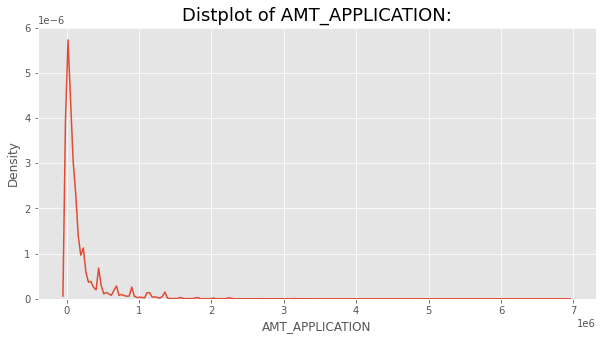

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis AMT_CREDIT
count    1.670213e+06
mean     1.961140e+05
std      3.185746e+05
min      0.000000e+00
25%      2.416050e+04
50%      8.054100e+04
75%      2.164185e+05
max      6.905160e+06
Name: AMT_CREDIT, dtype: float64



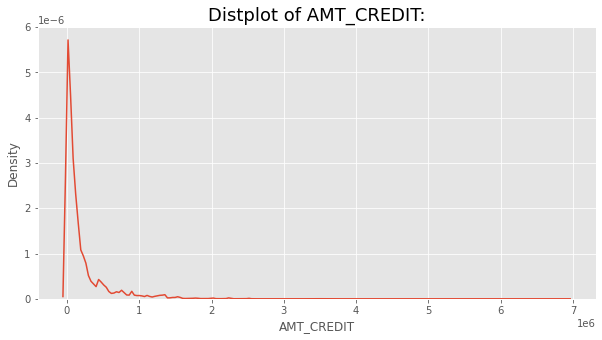

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis AMT_DOWN_PAYMENT
count    7.743700e+05
mean     6.697402e+03
std      2.092150e+04
min     -9.000000e-01
25%      0.000000e+00
50%      1.638000e+03
75%      7.740000e+03
max      3.060045e+06
Name: AMT_DOWN_PAYMENT, dtype: float64



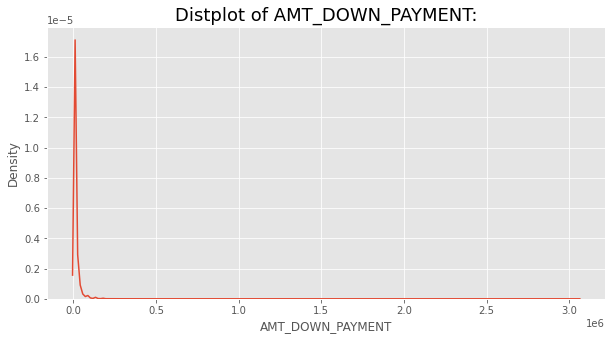

----------------------------------------------------------------------------------------------------------------------
Numerical Univariate Analysis AMT_GOODS_PRICE
count    1.284699e+06
mean     2.278473e+05
std      3.153966e+05
min      0.000000e+00
25%      5.084100e+04
50%      1.123200e+05
75%      2.340000e+05
max      6.905160e+06
Name: AMT_GOODS_PRICE, dtype: float64



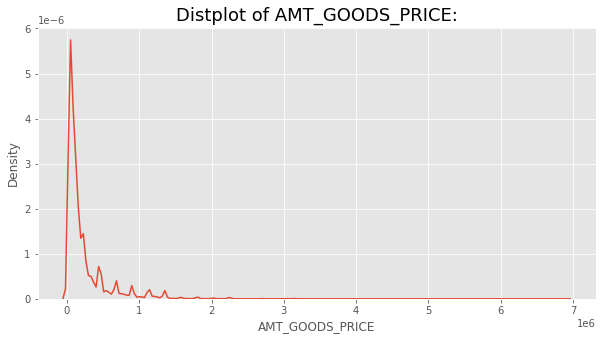

----------------------------------------------------------------------------------------------------------------------


In [164]:
num_col=['AMT_ANNUITY','AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE']

for i in num_col:
    prev_seg_num_uni_analysis(i)

## Merging the Applicatiion dataset and Previous_application datatset

In [165]:
app1=app0

In [166]:
#Merging
final = app1.merge(prev1, left_on='SK_ID_CURR',right_on='SK_ID_CURR', how='inner')

In [167]:
#Checking the shape of the merged dataset
final.shape

(1326995, 73)

In [168]:
#Checking the columns of merged dataset
final.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_x', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x',
       'NAME_TYPE_SUITE_x', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE',
       'AGE', 'YEARS_EMPLOYED', 'YEARS_REGISTRATION', 'YEARS_ID_PUBLISH',
       'OWN_CAR_AGE', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'YEARS_LAST_PHONE_CHANGE', 'Total_documents', 'Total_enquiries',
       'Own_car_or_realty', 'Income Group', 'AMT_CREDIT_RANGE', 'SK_ID_PREV',
       'NAME_CONTRACT_TYPE_y', 'AMT_ANNUITY_y', 'AMT_APPLICATION',
       'AMT_CREDIT_y', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE_y',
       'WEEKDAY_APPR_PROCESS_START', 'H

#### Segmenting the target to different variables if required for further analysis

In [169]:
final0 = final[final.TARGET==0]
final1 = final[final.TARGET==1]

## Bivariate Analysis

#### Creating function to plot bar charts for few key columns present to know the defaulting percentages across different categories.

In [170]:
def fin_seg_cat_uni_analysis(x):
    print('Segmented Categorical Univariate Analysis of {}'.format(x))
    print('')
    
    plt.figure(figsize=[25,8])
    
    plt.subplot(1,2,1)
    plots = sns.countplot(x,hue='TARGET',data=final)
    plt.xticks(rotation = 90)
    plt.title('Count of {} wrt TARGET'.format(x), fontdict={'fontsize':15})
    plt.xlabel(x,fontdict={'fontsize':14})
    plt.ylabel('Count',fontdict={'fontsize':15})
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')
    
    plt.subplot(1,2,2)
    plots = (final[x][final['TARGET']==1].value_counts()*100/final[x].value_counts()).plot.bar()
    plt.xticks(rotation = 90)
    plt.title('% of Total Def by Total count wrt {}'.format(x), fontdict={'fontsize':15})
    plt.xlabel(x,fontdict={'fontsize':14})
    plt.ylabel('Percentage',fontdict={'fontsize':15})
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')
    

    plt.show()
    print('---------------------------------------------------------------------------------------------------------------------')

#### Applying the function to do Bivariate analysis

Segmented Categorical Univariate Analysis of NAME_CONTRACT_TYPE_x



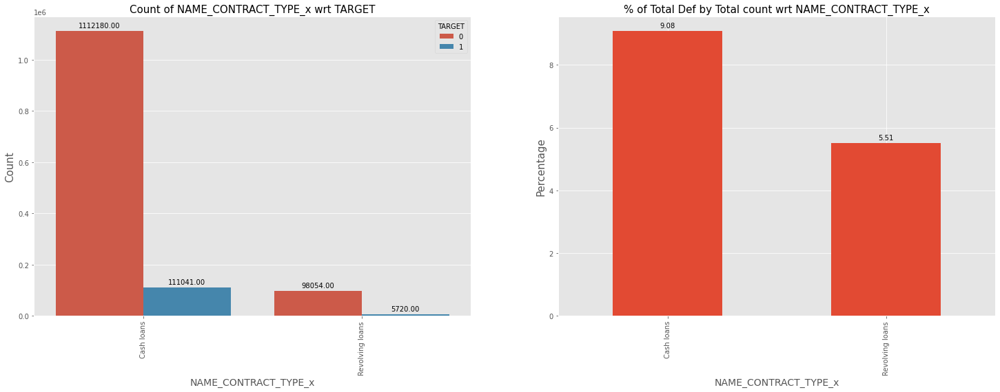

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_CONTRACT_STATUS



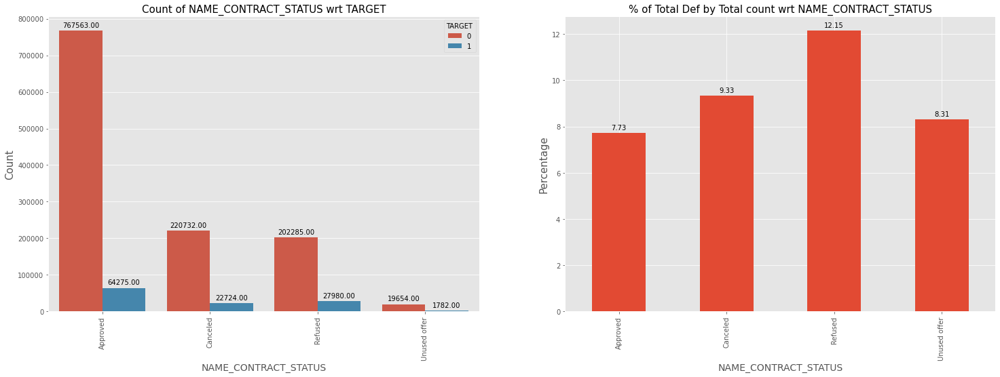

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_PAYMENT_TYPE



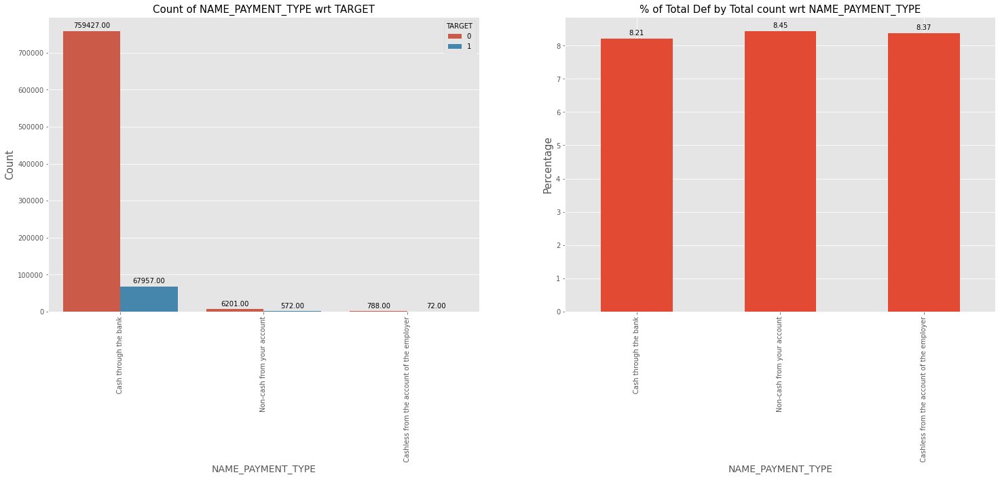

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_CLIENT_TYPE



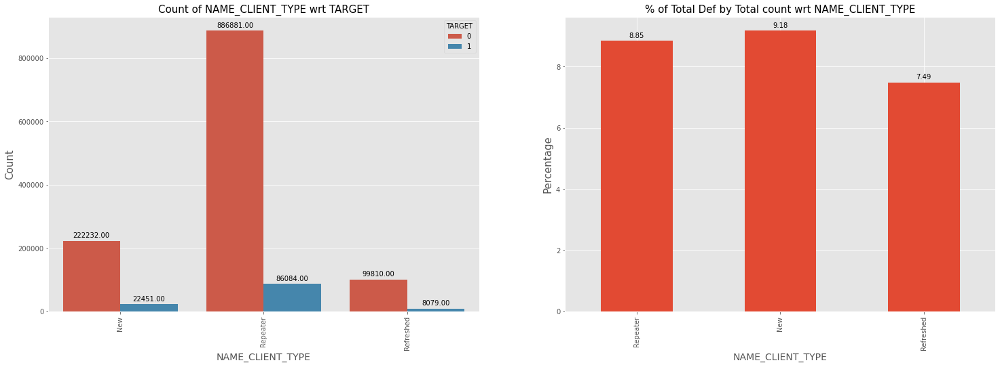

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of CODE_GENDER



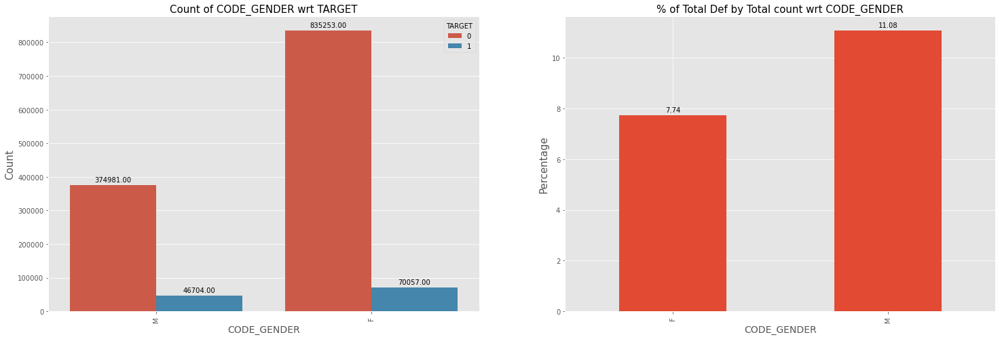

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of CNT_CHILDREN



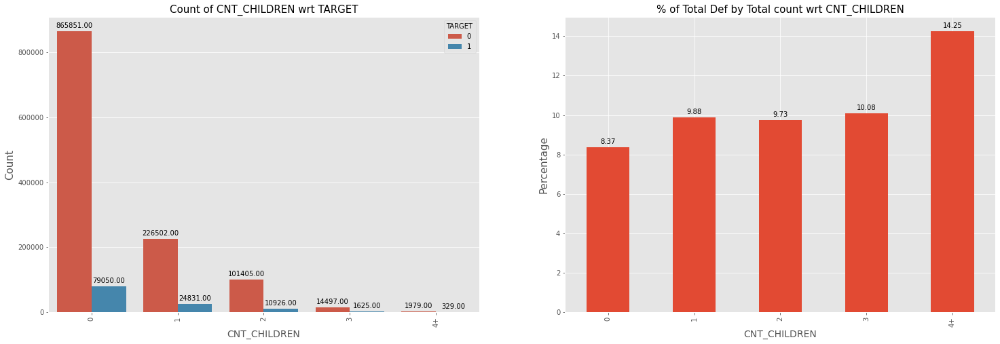

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_INCOME_TYPE



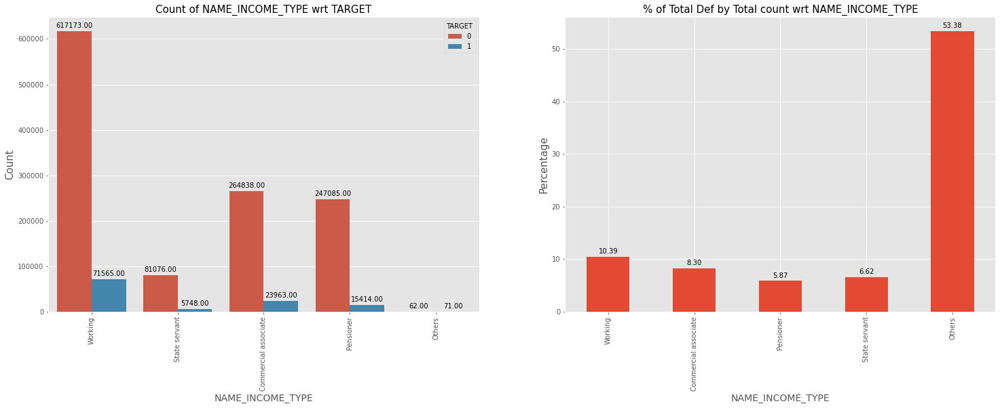

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_EDUCATION_TYPE



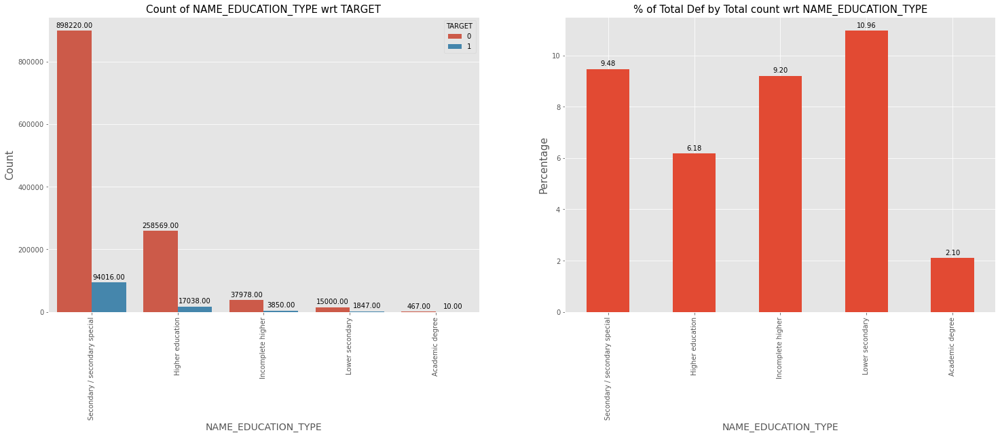

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of CODE_REJECT_REASON



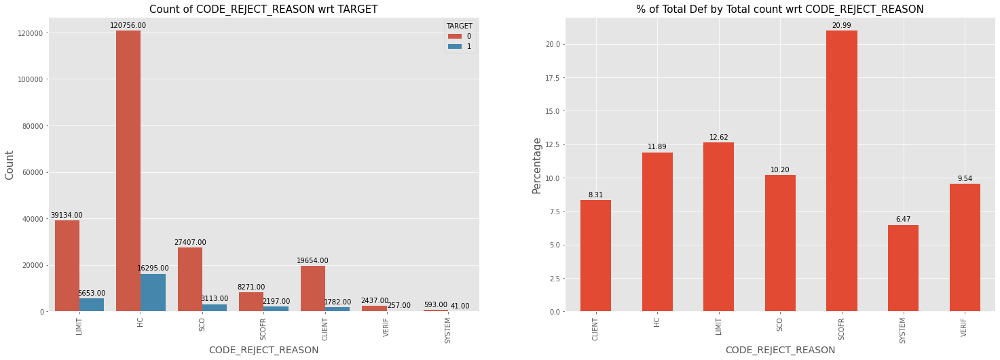

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_PRODUCT_TYPE



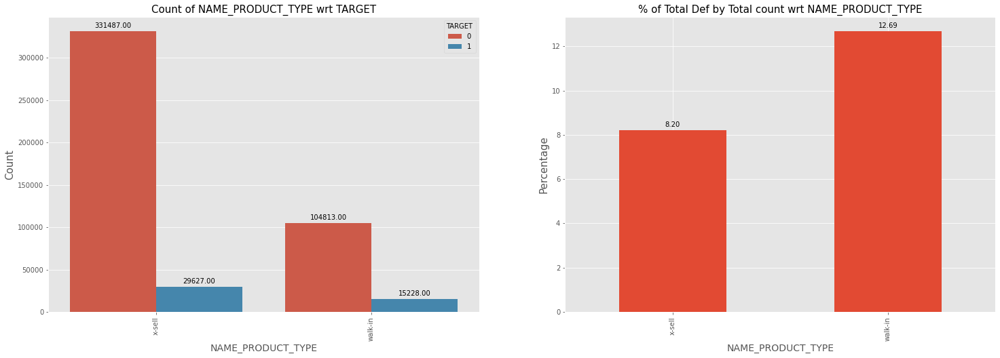

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of CHANNEL_TYPE



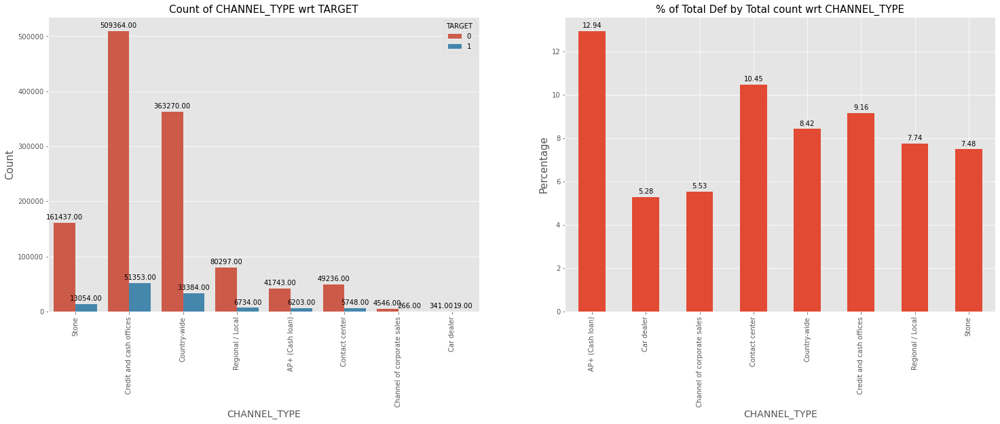

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_SELLER_INDUSTRY



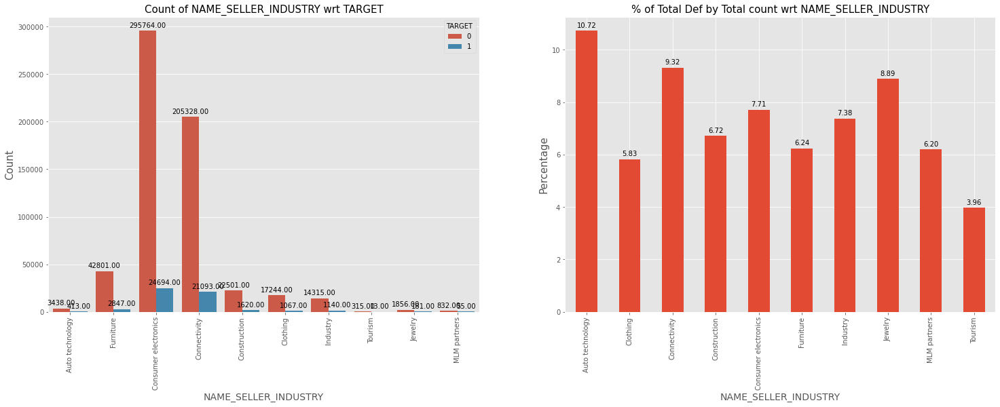

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of PRODUCT_COMBINATION



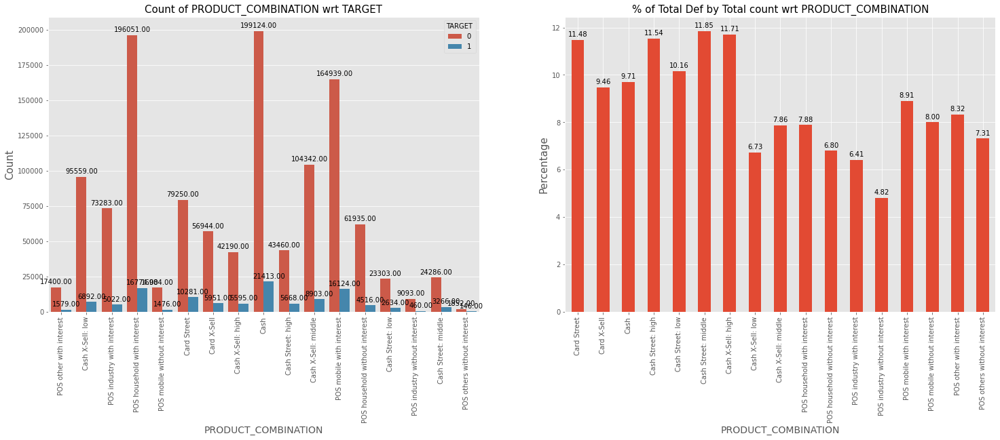

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_FAMILY_STATUS



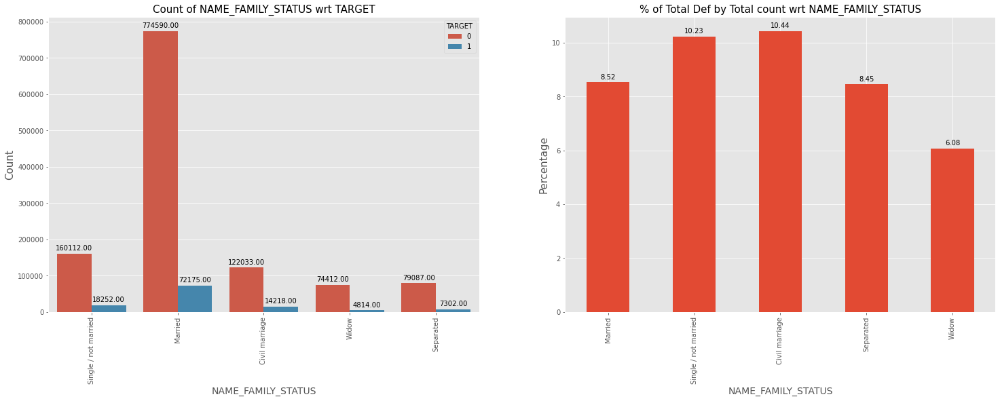

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_HOUSING_TYPE



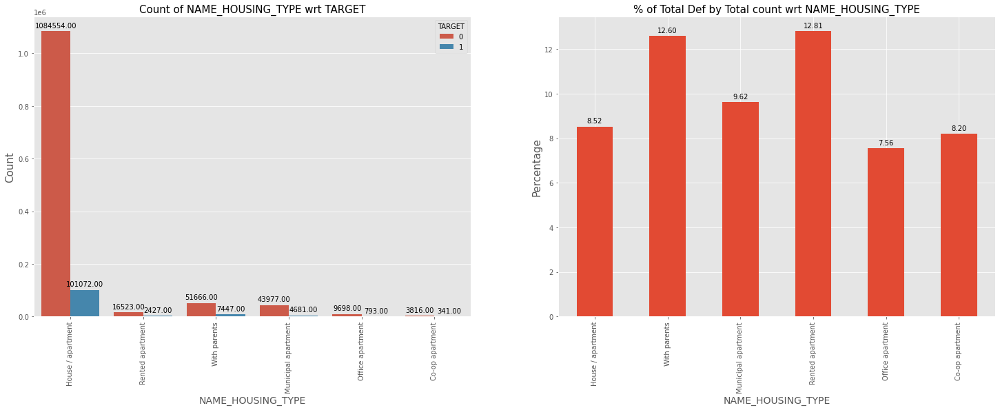

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of REGION_POPULATION_RELATIVE



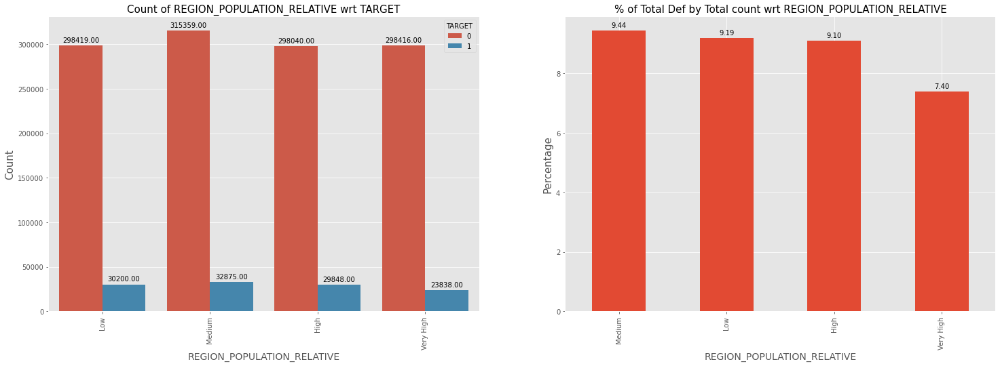

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of AGE



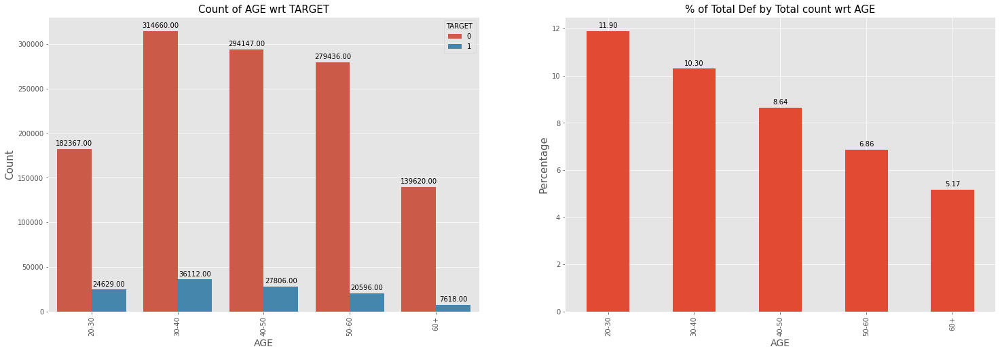

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of YEARS_EMPLOYED



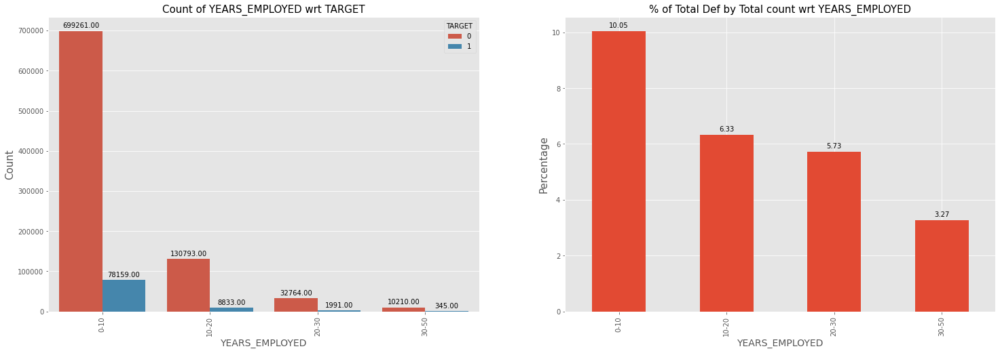

---------------------------------------------------------------------------------------------------------------------
Segmented Categorical Univariate Analysis of NAME_CASH_LOAN_PURPOSE



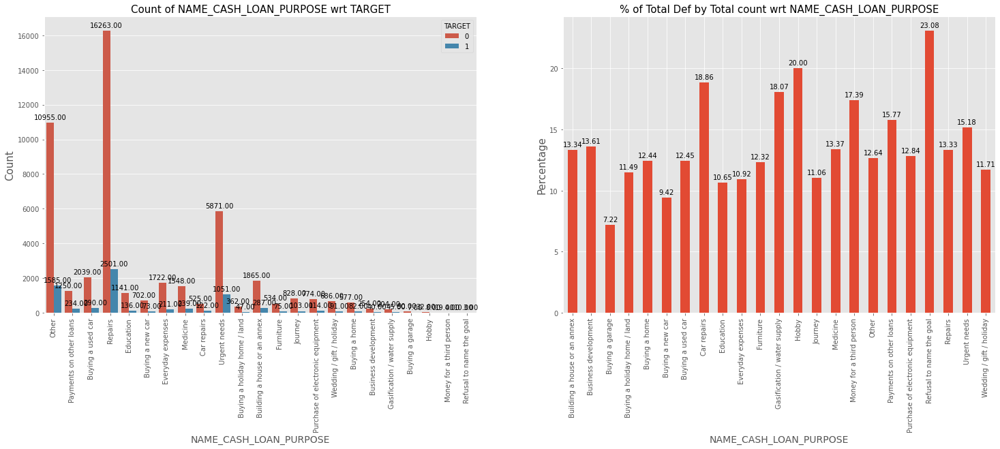

---------------------------------------------------------------------------------------------------------------------


In [171]:
col = ['NAME_CONTRACT_TYPE_x', 'NAME_CONTRACT_STATUS','NAME_PAYMENT_TYPE','NAME_CLIENT_TYPE','CODE_GENDER', 'CNT_CHILDREN', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'CODE_REJECT_REASON','NAME_PRODUCT_TYPE','CHANNEL_TYPE','NAME_SELLER_INDUSTRY','PRODUCT_COMBINATION','NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE',
       'AGE', 'YEARS_EMPLOYED','NAME_CASH_LOAN_PURPOSE']

for i in col:
    fin_seg_cat_uni_analysis(i)

#### Creating function to plot bar charts for few key columns present in the merged dataset

In [172]:
def plotting(column, hue):
    col = column
    hue = hue
    fig = plt.figure(figsize=(13,6))
    
    print('Plotting for {} having hue = {}'.format(column,hue))
    print('')
    ax1 = plt.subplot(131)
    df = pd.DataFrame()
    df['0']= ((final0[col].value_counts())*100/len(final0))
    df['1']= ((final1[col].value_counts())*100/len(final1))
    df.plot.bar(ax=ax1)
    plt.ylabel('Percentage')
    plt.xlabel(column)
    plt.title('Plotting data for target in terms of Percentage')


    ax2 = plt.subplot(132)
    sns.countplot(x=col, hue=hue, data=final0, ax = ax2)
    plt.xticks(rotation=90)
    plt.title('Plotting data for Target=0')

    ax3 = plt.subplot(133)
    sns.countplot(x=col, hue=hue, data=final1, ax = ax3)
    plt.xticks(rotation=90)
    plt.title('Plotting data for Target=1')


    plt.show()
    print('------------------------------------------------------------------------------------------------------------------')


#### Applying the function to do Bivariate analysis

Plotting for NAME_CONTRACT_TYPE_x having hue = NAME_CONTRACT_STATUS



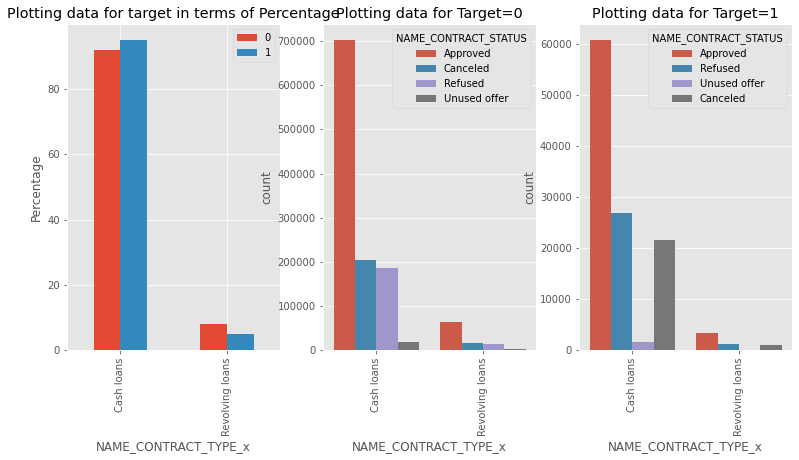

------------------------------------------------------------------------------------------------------------------
Plotting for NAME_CONTRACT_STATUS having hue = NAME_CONTRACT_STATUS



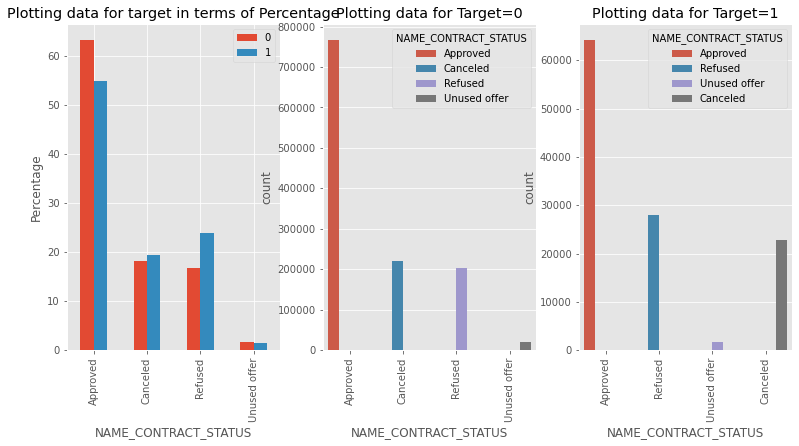

------------------------------------------------------------------------------------------------------------------
Plotting for NAME_PAYMENT_TYPE having hue = NAME_CONTRACT_STATUS



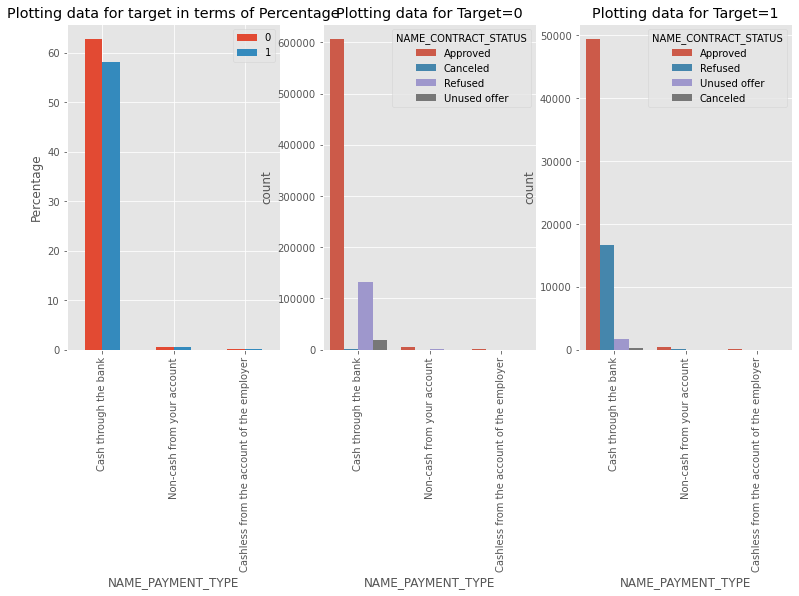

------------------------------------------------------------------------------------------------------------------
Plotting for NAME_CLIENT_TYPE having hue = NAME_CONTRACT_STATUS



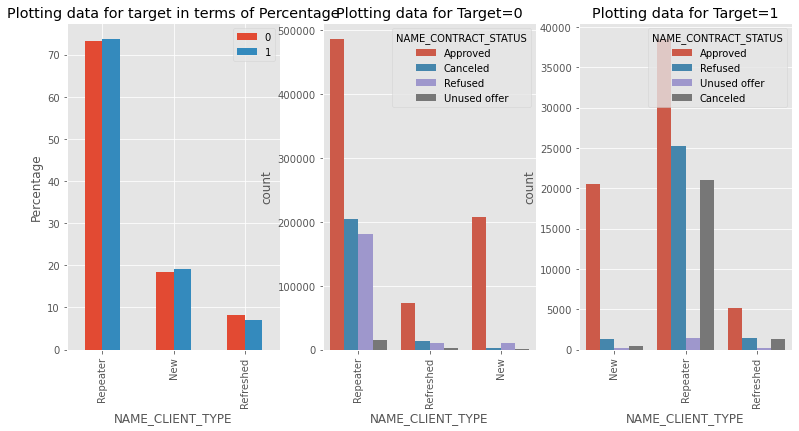

------------------------------------------------------------------------------------------------------------------
Plotting for CODE_GENDER having hue = NAME_CONTRACT_STATUS



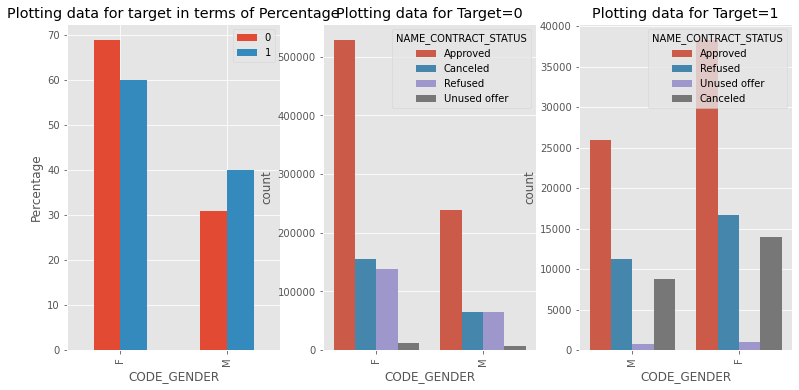

------------------------------------------------------------------------------------------------------------------
Plotting for CNT_CHILDREN having hue = NAME_CONTRACT_STATUS



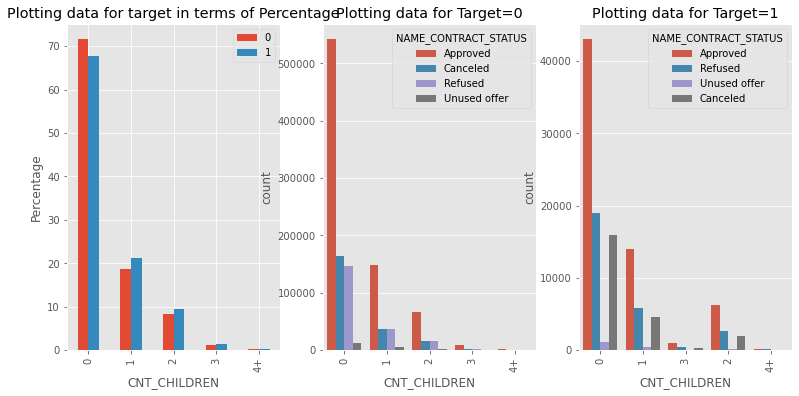

------------------------------------------------------------------------------------------------------------------
Plotting for NAME_INCOME_TYPE having hue = NAME_CONTRACT_STATUS



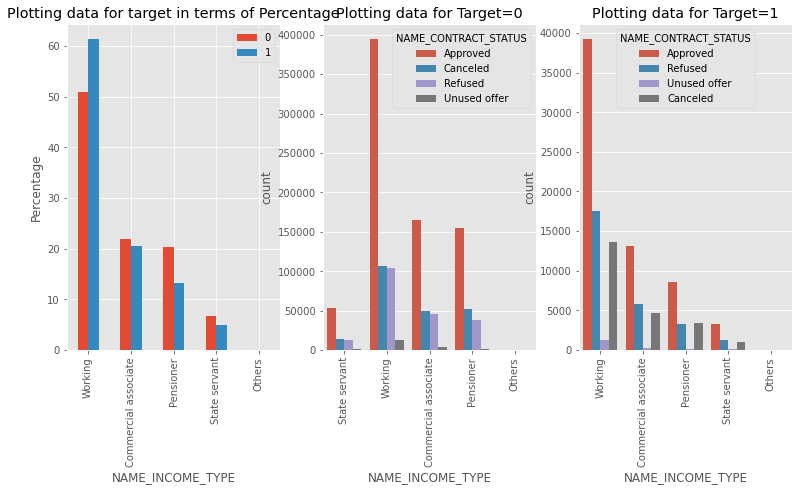

------------------------------------------------------------------------------------------------------------------
Plotting for NAME_EDUCATION_TYPE having hue = NAME_CONTRACT_STATUS



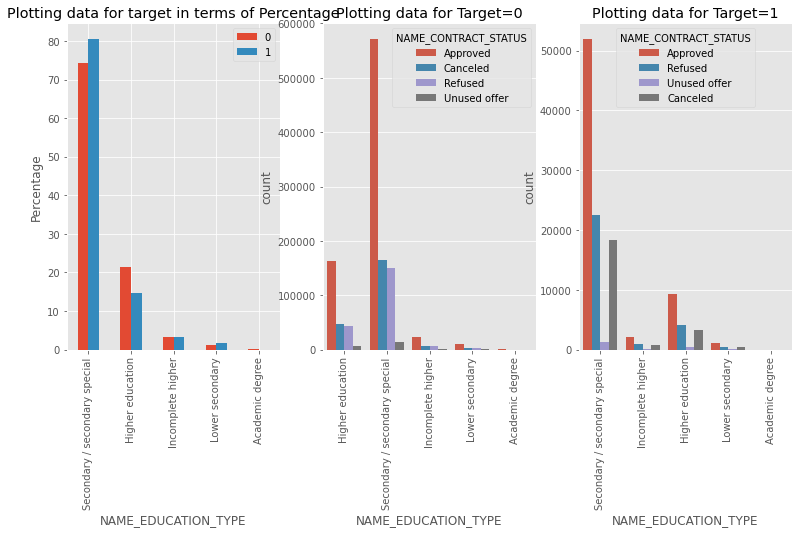

------------------------------------------------------------------------------------------------------------------
Plotting for CODE_REJECT_REASON having hue = NAME_CONTRACT_STATUS



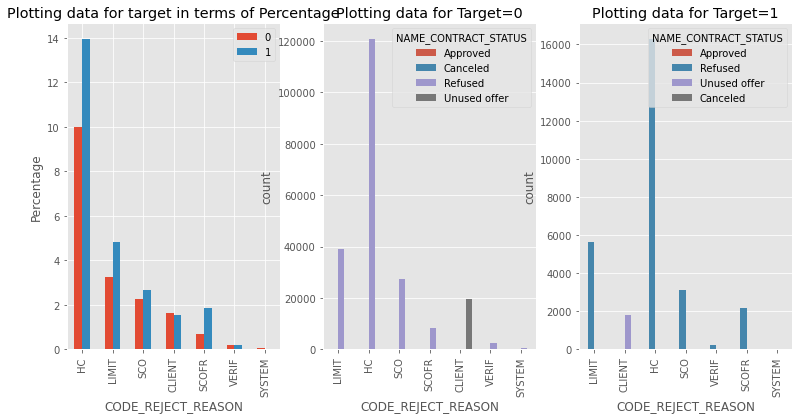

------------------------------------------------------------------------------------------------------------------
Plotting for NAME_PRODUCT_TYPE having hue = NAME_CONTRACT_STATUS



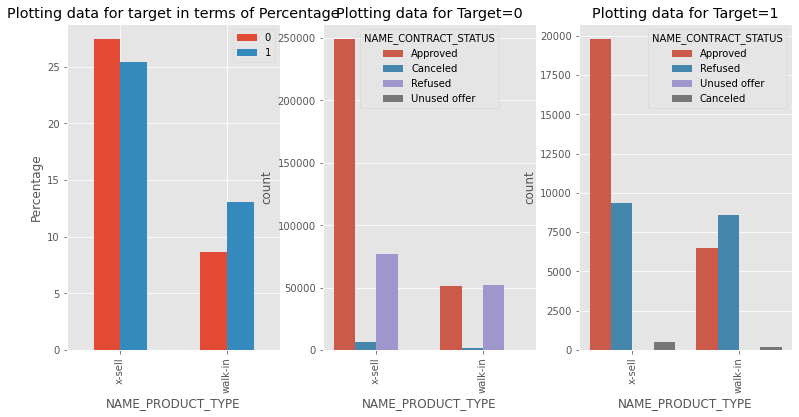

------------------------------------------------------------------------------------------------------------------
Plotting for CHANNEL_TYPE having hue = NAME_CONTRACT_STATUS



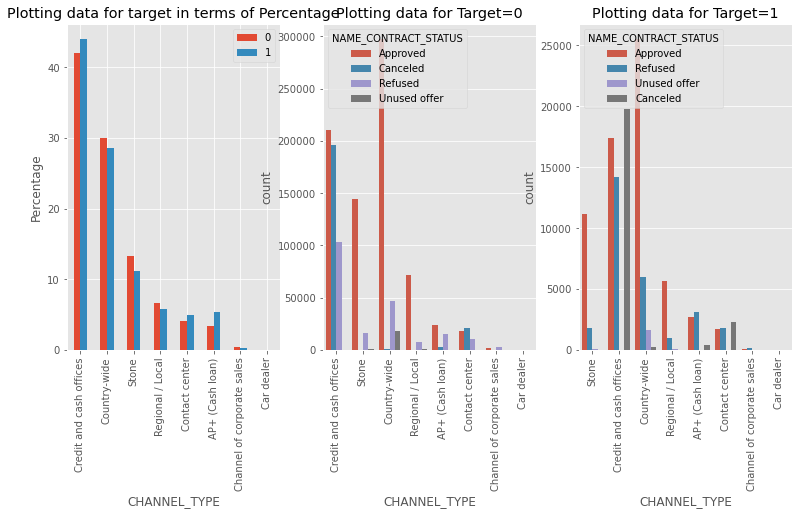

------------------------------------------------------------------------------------------------------------------
Plotting for NAME_SELLER_INDUSTRY having hue = NAME_CONTRACT_STATUS



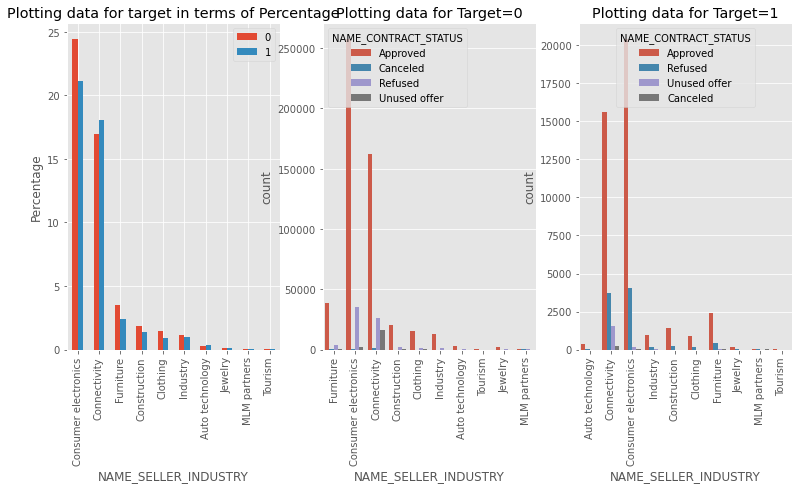

------------------------------------------------------------------------------------------------------------------
Plotting for PRODUCT_COMBINATION having hue = NAME_CONTRACT_STATUS



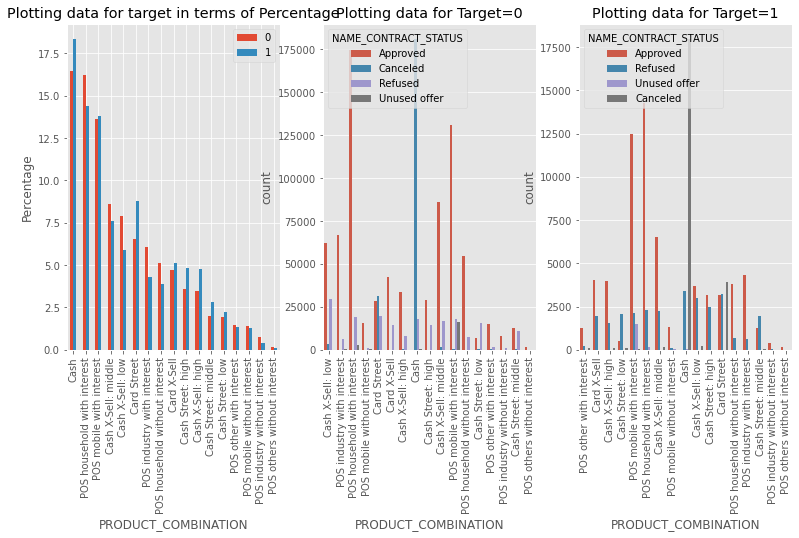

------------------------------------------------------------------------------------------------------------------
Plotting for NAME_FAMILY_STATUS having hue = NAME_CONTRACT_STATUS



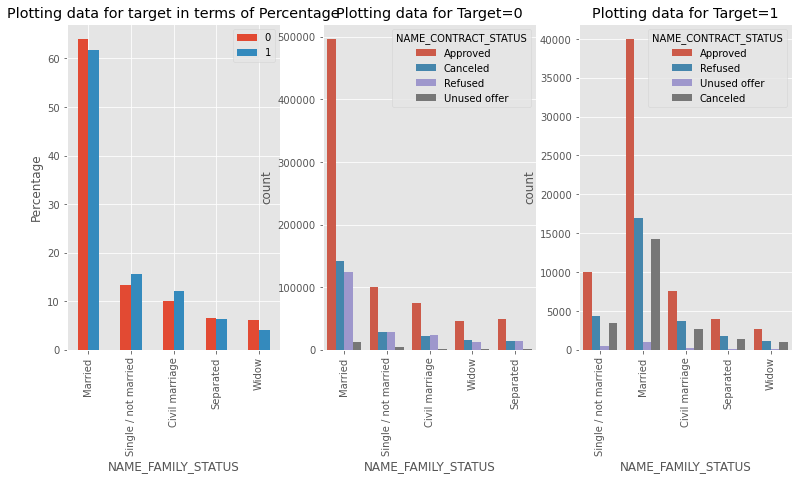

------------------------------------------------------------------------------------------------------------------
Plotting for NAME_HOUSING_TYPE having hue = NAME_CONTRACT_STATUS



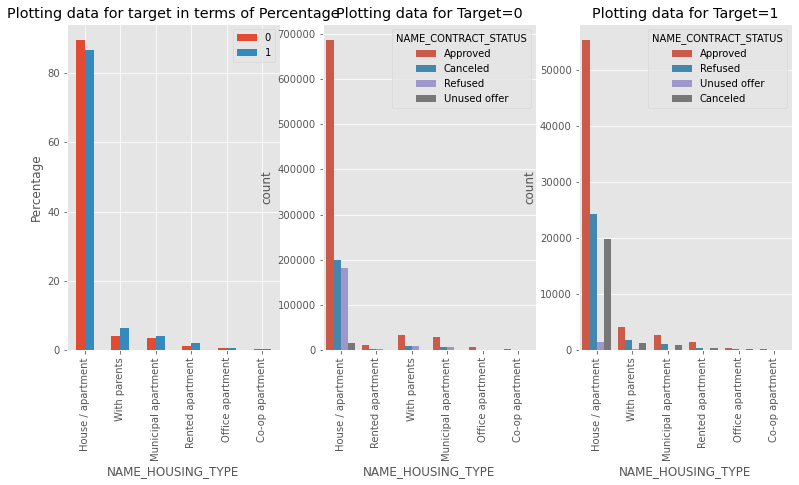

------------------------------------------------------------------------------------------------------------------
Plotting for REGION_POPULATION_RELATIVE having hue = NAME_CONTRACT_STATUS



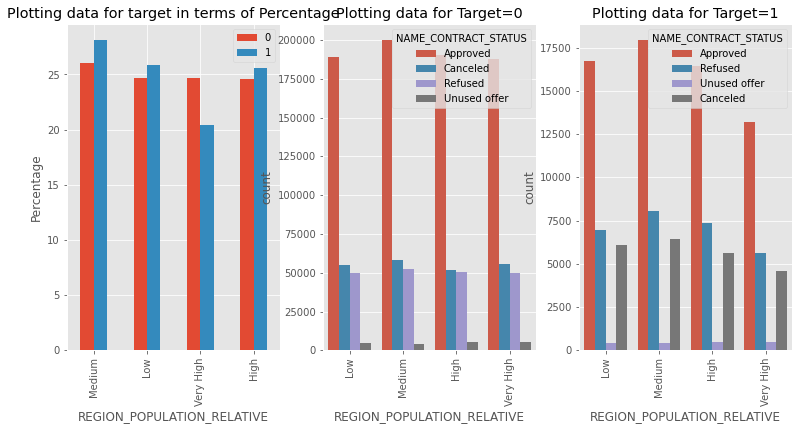

------------------------------------------------------------------------------------------------------------------
Plotting for AGE having hue = NAME_CONTRACT_STATUS



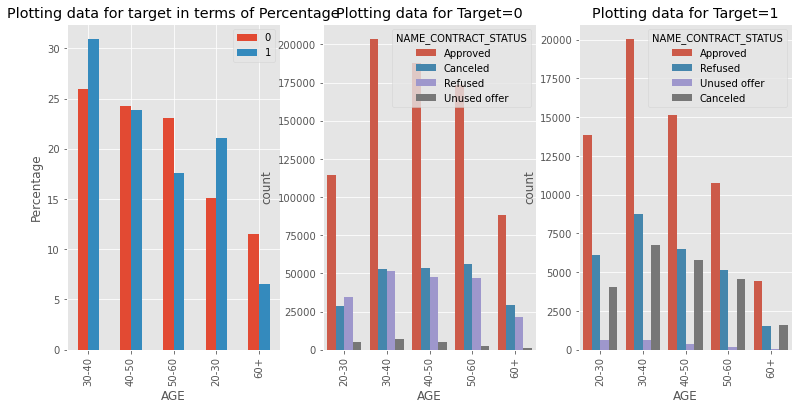

------------------------------------------------------------------------------------------------------------------
Plotting for YEARS_EMPLOYED having hue = NAME_CONTRACT_STATUS



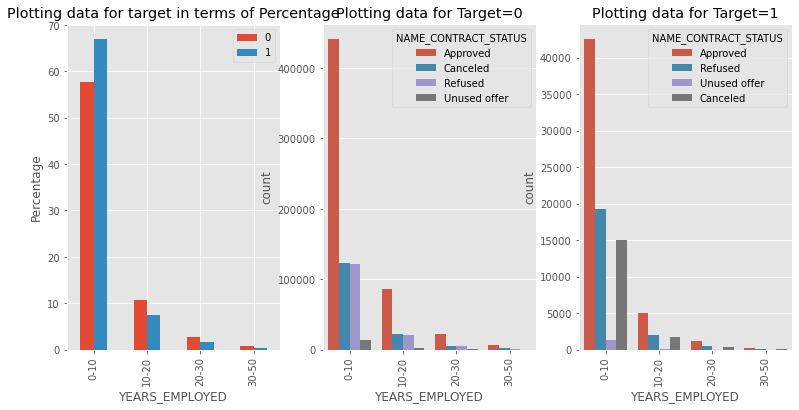

------------------------------------------------------------------------------------------------------------------
Plotting for NAME_CASH_LOAN_PURPOSE having hue = NAME_CONTRACT_STATUS



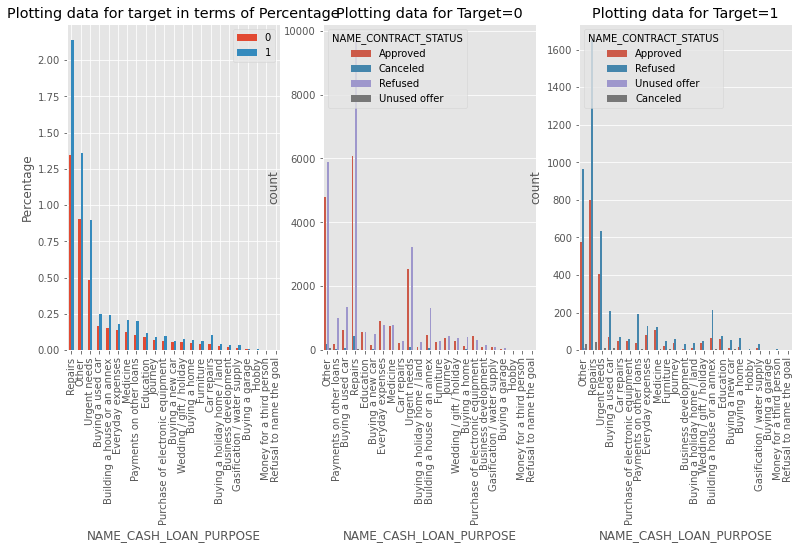

------------------------------------------------------------------------------------------------------------------


In [173]:
col = ['NAME_CONTRACT_TYPE_x', 'NAME_CONTRACT_STATUS','NAME_PAYMENT_TYPE','NAME_CLIENT_TYPE','CODE_GENDER', 'CNT_CHILDREN', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'CODE_REJECT_REASON','NAME_PRODUCT_TYPE','CHANNEL_TYPE','NAME_SELLER_INDUSTRY','PRODUCT_COMBINATION','NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE',
       'AGE', 'YEARS_EMPLOYED','NAME_CASH_LOAN_PURPOSE']

for i in col:
    plotting(i,'NAME_CONTRACT_STATUS')  


# Multivariate Analysis

## Plotting heatmap to see the relationship between few key categorical columns vs 'NAME_CONTRACT_STATUS' vs 'TARGET'

##### Desired result is to have Green boxes over Approved and Red boxes over Refused. This indicates that people who are known high defaulters are being refused and low defaulters are being approved for loans

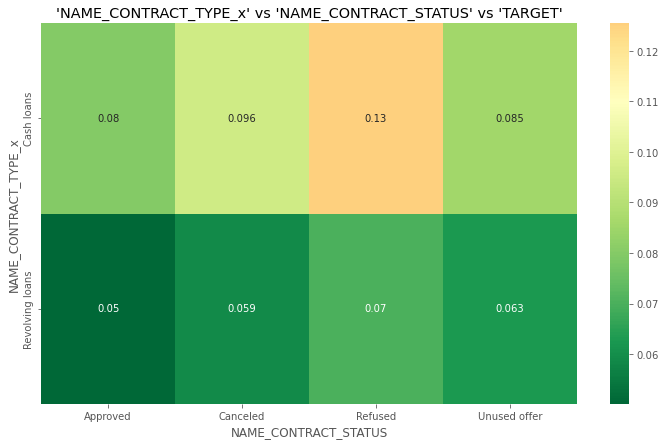

------------------------------------------------------------------------------------------------------------------


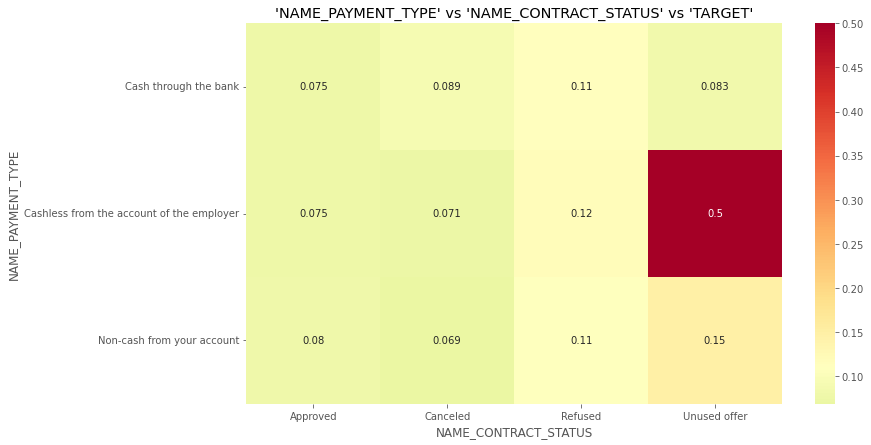

------------------------------------------------------------------------------------------------------------------


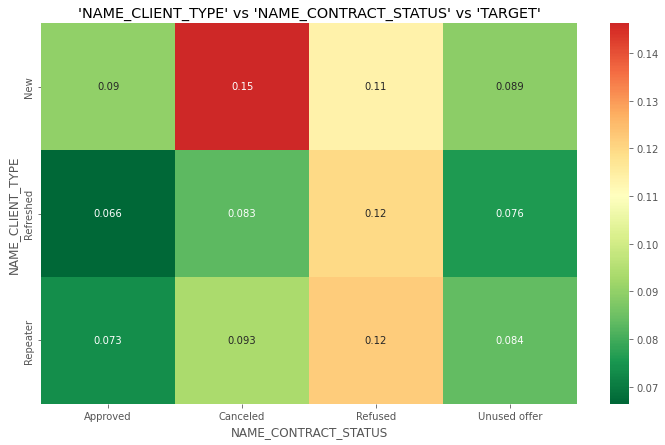

------------------------------------------------------------------------------------------------------------------


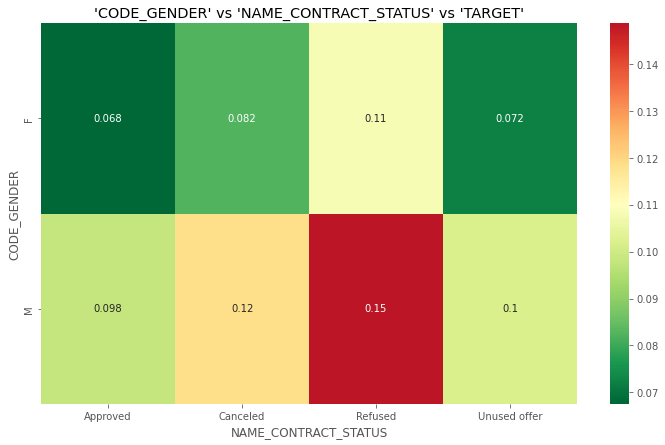

------------------------------------------------------------------------------------------------------------------


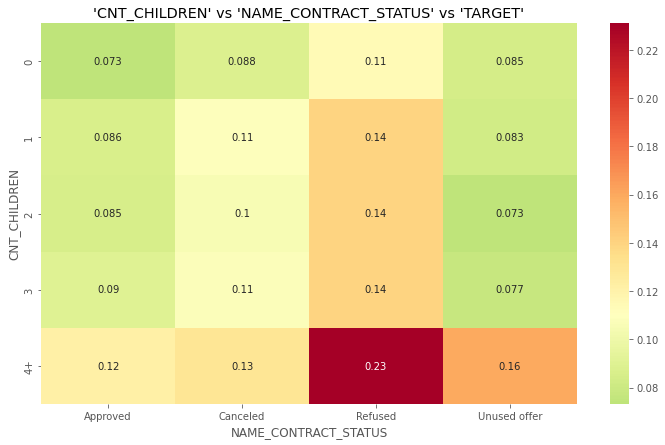

------------------------------------------------------------------------------------------------------------------


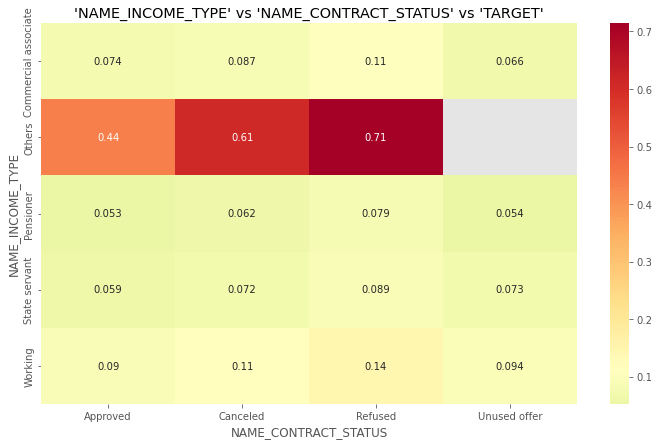

------------------------------------------------------------------------------------------------------------------


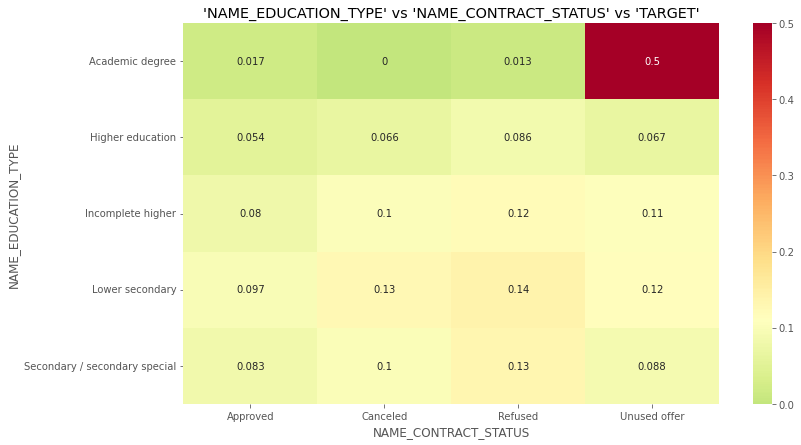

------------------------------------------------------------------------------------------------------------------


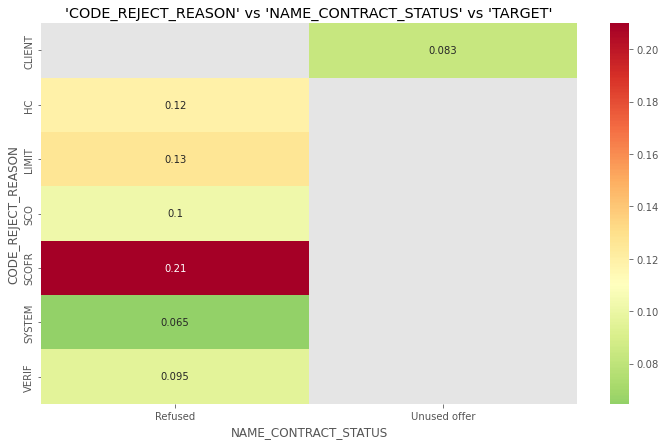

------------------------------------------------------------------------------------------------------------------


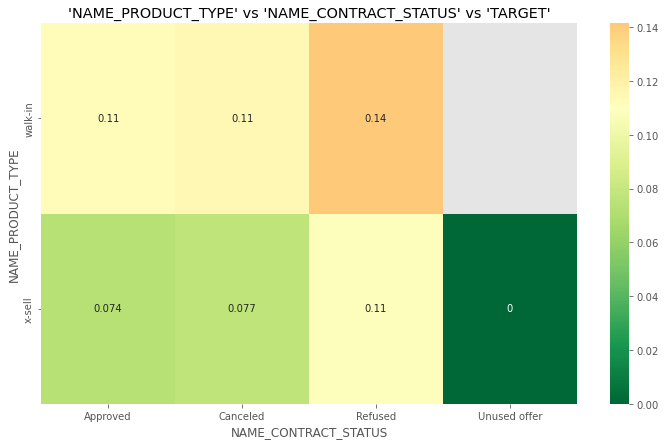

------------------------------------------------------------------------------------------------------------------


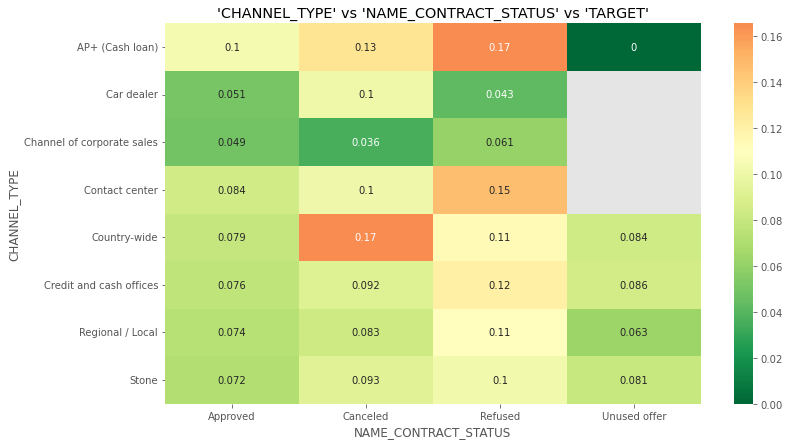

------------------------------------------------------------------------------------------------------------------


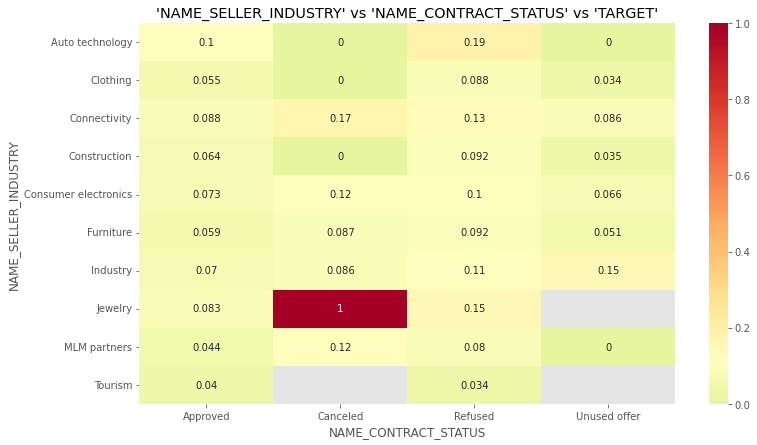

------------------------------------------------------------------------------------------------------------------


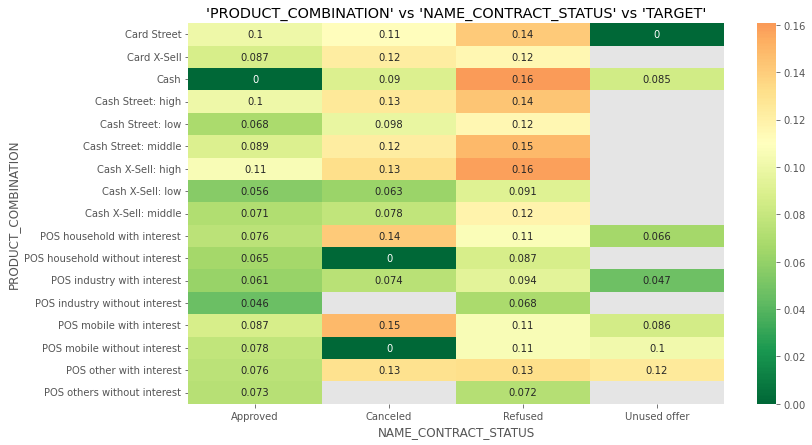

------------------------------------------------------------------------------------------------------------------


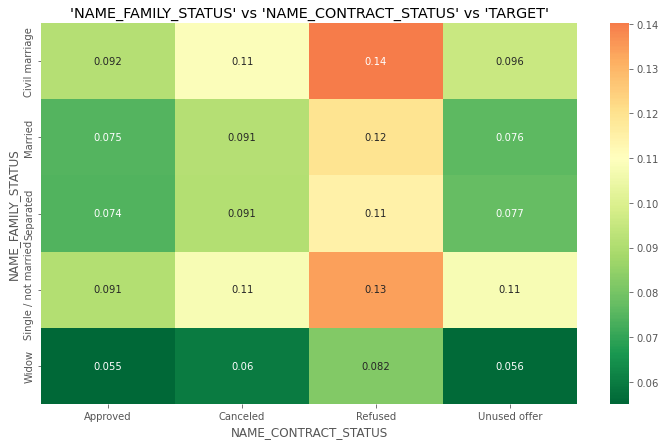

------------------------------------------------------------------------------------------------------------------


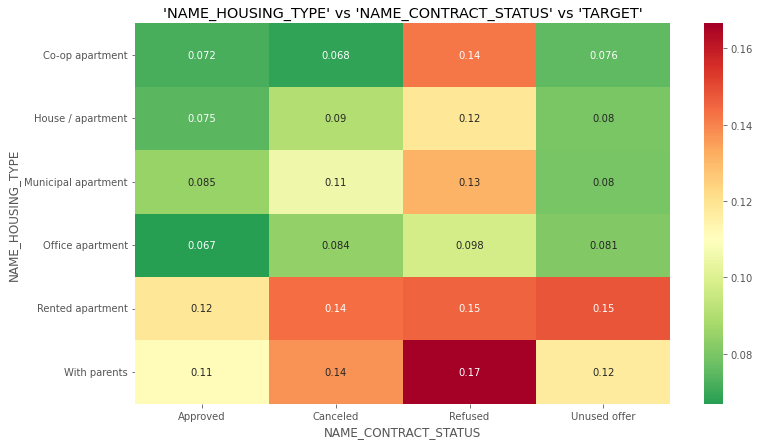

------------------------------------------------------------------------------------------------------------------


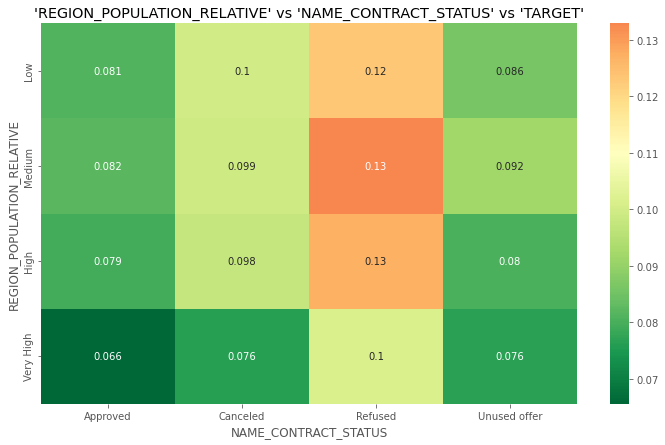

------------------------------------------------------------------------------------------------------------------


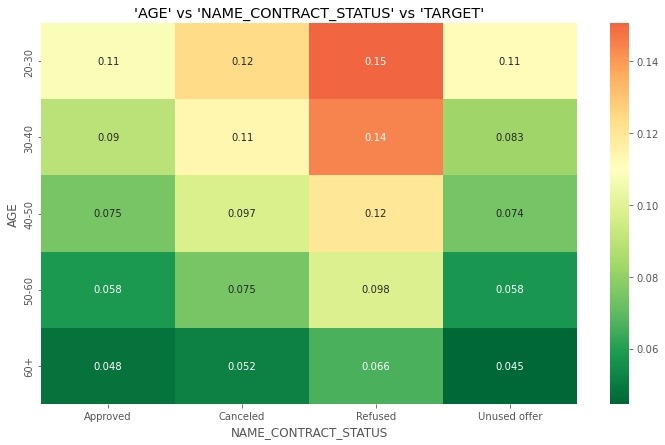

------------------------------------------------------------------------------------------------------------------


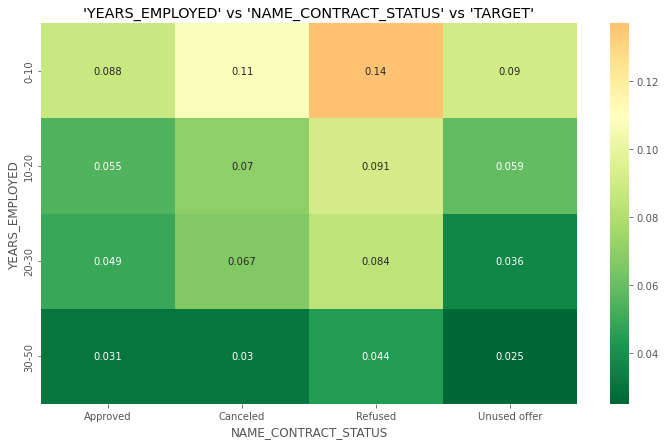

------------------------------------------------------------------------------------------------------------------


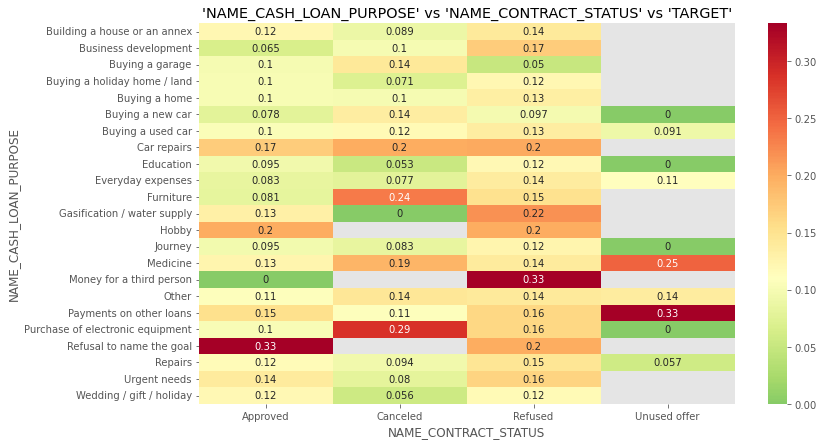

------------------------------------------------------------------------------------------------------------------


In [174]:
col = ['NAME_CONTRACT_TYPE_x','NAME_PAYMENT_TYPE','NAME_CLIENT_TYPE','CODE_GENDER', 'CNT_CHILDREN', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'CODE_REJECT_REASON','NAME_PRODUCT_TYPE','CHANNEL_TYPE','NAME_SELLER_INDUSTRY','PRODUCT_COMBINATION','NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE',
       'AGE', 'YEARS_EMPLOYED','NAME_CASH_LOAN_PURPOSE']

for i in col:
    plt.figure(figsize=[12,7])
    sns.heatmap(pd.pivot_table(data=final,index=i,columns='NAME_CONTRACT_STATUS',values='TARGET',aggfunc='mean'),annot=True,cmap='RdYlGn_r',center=0.11)
    plt.title("'{}' vs 'NAME_CONTRACT_STATUS' vs 'TARGET'".format(i))

    plt.show()
    print('------------------------------------------------------------------------------------------------------------------')

#### From the heatmaps, we can identify the category of people in spite of having very less defaulting rates being rejected. These are few of missed business opportunity to the bank and we can also see in some cases people having higher default rates being approved. Therefore, to improve the business/profits banks should try to provide loans to people having lesser defaulting rates.